## COP and COG estimation by derivative method
Trying to estimate COP and COG were used linear function wich didn't give the results expected, therefore we tried to make different approaches and one of them is the next function:
COP= COG-(4/g*3*d²derivadasegundaTeta)

## Python libraries

First, let's import the necessary Python libraries and configure the environment:

In [2]:
import numpy as np
#from scipy.signal import butter, filtfilt
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
%matplotlib inline
#import seaborn as sns
#sns.set_context("notebook", font_scale=1.3,
#                rc={'lines.linewidth': 1.5, 'lines.markersize': 14, 'axes.titlesize': 'x-large'})
#matplotlib.rc('legend', numpoints=1, fontsize=14)
#import glob
import sys, os
sys.path.insert(1, r'./Functions')
# IPython widgets:
from IPython.display import display
import ipywidgets
from ipywidgets import FloatProgress, interactive

Versions of the Python libraries used:

In [3]:
#!pip install version_information
%load_ext version_information
%version_information numpy, scipy, pandas, matplotlib, seaborn

Software versions
Python 3.8.8 64bit [MSC v.1916 64 bit (AMD64)]
IPython 7.22.0
OS Windows 10 10.0.22000 SP0
numpy 1.20.1
scipy 1.6.2
pandas 1.2.4
matplotlib 3.3.4
seaborn 0.11.1
Mon Mar 21 11:37:23 2022 Hora oficial do Brasil

## Meta data

The file `PDSinfo.txt` contains meta data about the subjects and the experimental trials. The file has a header plus 588 rows per 29 columns (there are 12 rows for each of the 49 subjects).   
Let's use the power of the [pandas](http://pandas.pydata.org/) library to load and explore the meta data:

In [4]:
# GitHub URL:
#path2 = 'C:\Users\ferna\Downloads\IC- dados\Dados'
# local directory:
path2 = r'C:\\Users\\ferna\\Downloads\\IC- dados\\Dados'
fname = os.path.join(path2, 'PDSinfo.txt')
PDSinfo = pd.read_csv(fname, sep='\t', header=0, index_col=None, engine='c', encoding='utf-8')
print(fname)
print("Information of %s subjects loaded (%s rows, %s columns)."
      %(len(pd.unique(PDSinfo.Subject)), PDSinfo.shape[0], PDSinfo.shape[1]))

C:\\Users\\ferna\\Downloads\\IC- dados\\Dados\PDSinfo.txt
Information of 49 subjects loaded (588 rows, 29 columns).


In [5]:
a=PDSinfo[PDSinfo['Subject']==44].index.tolist()
e=PDSinfo[PDSinfo['Subject']==44].index.tolist()[2]
print(a)
print(e)

[516, 517, 518, 519, 520, 521, 522, 523, 524, 525, 526, 527]
518


Here are the first 12 rows and first 10 columns of meta data:

## COP and COG displacements

## For Every Subject

## Errors in function of angles

In [7]:
for s in range (1,50):
    a=PDSinfo[PDSinfo['Subject']==s].index.tolist()[2]
    fname_grf = os.path.join(path2, PDSinfo.Trial[a] + 'grf' + '.txt') 
    fname_mkr = os.path.join(path2, PDSinfo.Trial[a] + 'mkr' + '.txt')
    grf = pd.read_csv(fname_grf, delimiter='\t', header=0, engine='c')
    mkr = pd.read_csv(fname_mkr, delimiter='\t', header=0, engine='c')
    COGX=mkr['COG_X']
    COGY=mkr['COG_Y']
    COGZ=mkr['COG_Z']
    d=(COGX**2+COGY**2+COGZ**2)**0.5
    angulox = np.arcsin(COGX/d)
    anguloz= np.arcsin(COGZ/d)
    matrizangx=np.array(angulox[30:])
    matrizangz=np.array(anguloz[30:])
    t=grf['Time']
    dt=t[1]-t[0]
    d1x=np.zeros(len(matrizangx))
    d1z=np.zeros(len(matrizangz))
    for i in range(0, len(matrizangx)-1):
        next=i+1
        d1x[i]=(matrizangx[next]-matrizangx[i])/dt
        d1z[i]=(matrizangz[next]-matrizangz[i])/dt
    d2x=np.zeros(len(d1x))
    d2z=np.zeros(len(d1z))
    for i in range(0, 30):
        next=i+1
        d2x[i]=(d1x[next]-d1x[i])/dt
        d2z[i]=(d1z[next]-d1z[i])/dt
    COPX=COGX[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2x
    COPZ=COGZ[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2z
    COPXreal=grf['COPNET_X']
    COPZreal=grf['COPNET_Z']
    COPXmatrix=np.array(COPX)
    COPXrealmatrix=np.array(COPXreal[30:])
    errorx=np.subtract(COPXmatrix,COPXrealmatrix)
    COPZmatrix=np.array(COPZ)
    COPZrealmatrix=np.array(COPZreal[30:])
    errorz=np.subtract(COPZmatrix,COPZrealmatrix)

## Corrrelation 

In [32]:

import pandas as pd 
import seaborn as sns
for s in range (1,50):
    a=PDSinfo[PDSinfo['Subject']==s].index.tolist()[2]
    fname_grf = os.path.join(path2, PDSinfo.Trial[a] + 'grf' + '.txt') 
    fname_mkr = os.path.join(path2, PDSinfo.Trial[a] + 'mkr' + '.txt')
    grf = pd.read_csv(fname_grf, delimiter='\t', header=0, engine='c')
    mkr = pd.read_csv(fname_mkr, delimiter='\t', header=0, engine='c')
    COGX=mkr['COG_X']
    COGY=mkr['COG_Y']
    COGZ=mkr['COG_Z']
    d=(COGX**2+COGY**2+COGZ**2)**0.5
    angulox = np.arcsin(COGX/d)
    anguloz= np.arcsin(COGZ/d)
    matrizangx=np.array(angulox[30:])
    matrizangz=np.array(anguloz[30:])
    t=grf['Time']
    dt=t[1]-t[0]
    d1x=np.zeros(len(matrizangx))
    d1z=np.zeros(len(matrizangz))
    for i in range(0, len(matrizangx)-1):
        next=i+1
        d1x[i]=(matrizangx[next]-matrizangx[i])/dt
        d1z[i]=(matrizangz[next]-matrizangz[i])/dt
    d2x=np.zeros(len(d1x))
    d2z=np.zeros(len(d1z))
    for i in range(0, 30):
        next=i+1
        d2x[i]=(d1x[next]-d1x[i])/dt
        d2z[i]=(d1z[next]-d1z[i])/dt
    COPX=COGX[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2x
    COPZ=COGZ[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2z
    COPXreal=grf['COPNET_X']
    COPZreal=grf['COPNET_Z']
    COPZmatrix=np.array(COPZ)
    COPZrealmatrix=np.array(COPZreal[30:])
    errorz=np.subtract(COPZmatrix,COPZrealmatrix)

# Correlation between COPX and Angle x

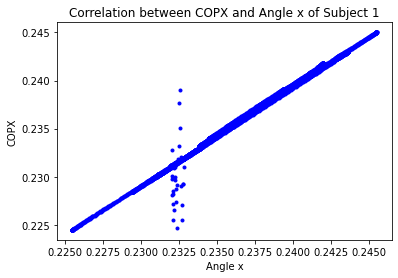

[[1.        0.9972404]
 [0.9972404 1.       ]]


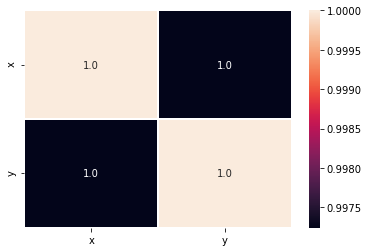

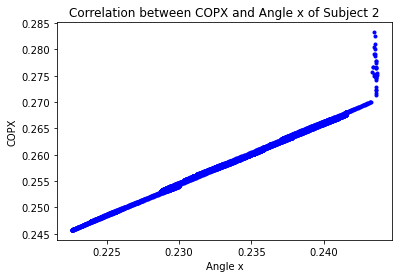

[[1.         0.99512454]
 [0.99512454 1.        ]]


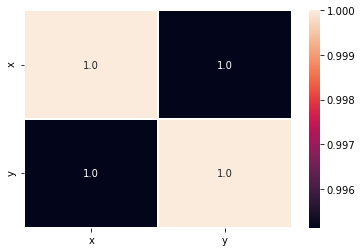

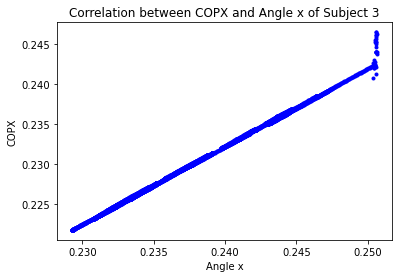

[[1.         0.99932351]
 [0.99932351 1.        ]]


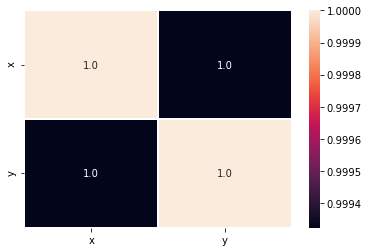

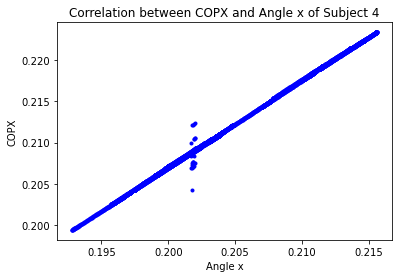

[[1.         0.99971216]
 [0.99971216 1.        ]]


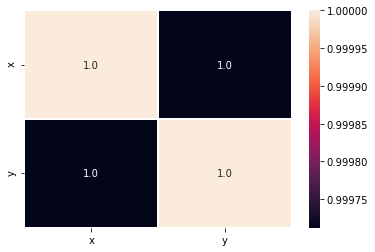

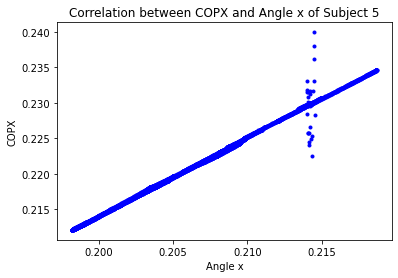

[[1.         0.99833391]
 [0.99833391 1.        ]]


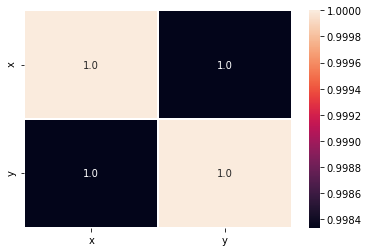

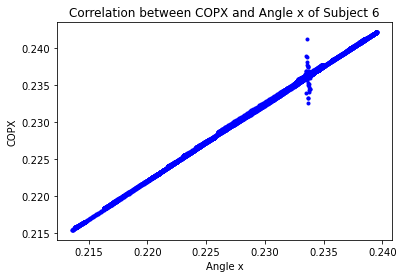

[[1.         0.99971239]
 [0.99971239 1.        ]]


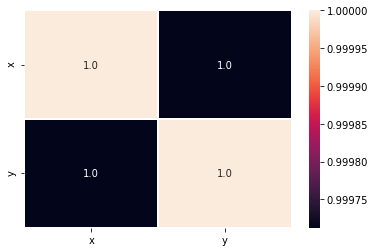

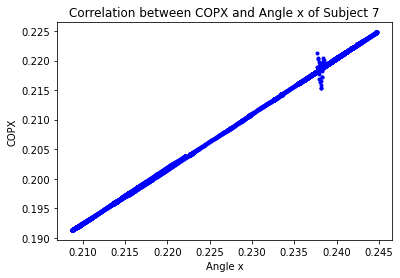

[[1.         0.99992263]
 [0.99992263 1.        ]]


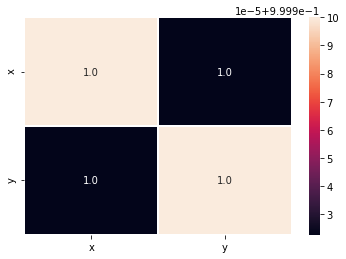

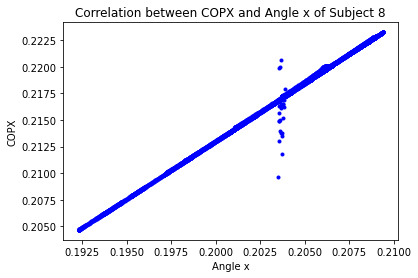

[[1.         0.99924463]
 [0.99924463 1.        ]]


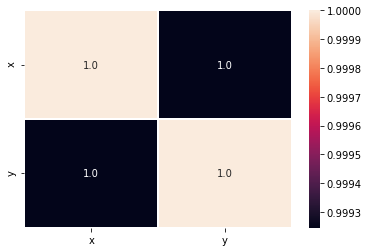

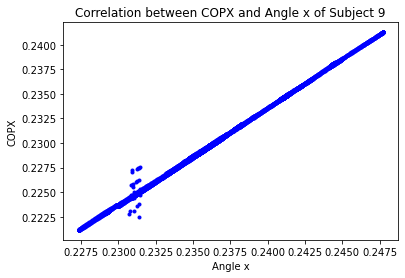

[[1.         0.99960844]
 [0.99960844 1.        ]]


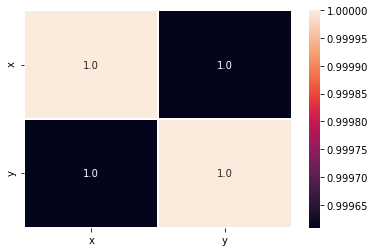

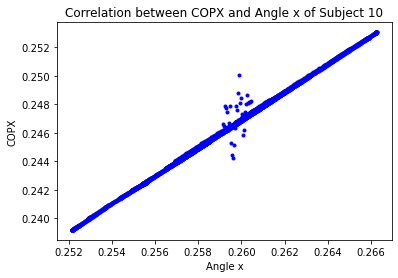

[[1.         0.99938784]
 [0.99938784 1.        ]]


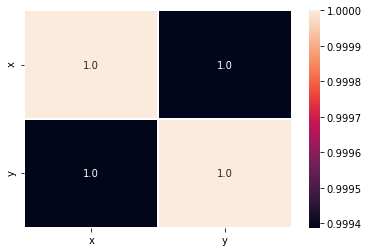

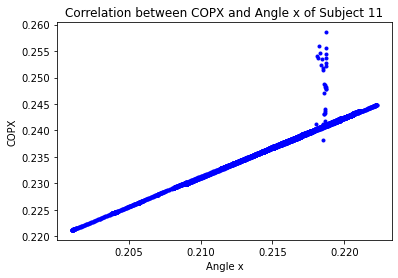

[[1.         0.98787683]
 [0.98787683 1.        ]]


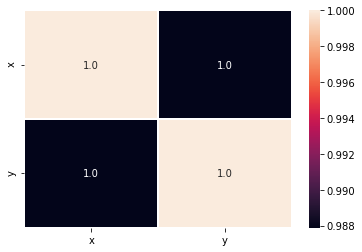

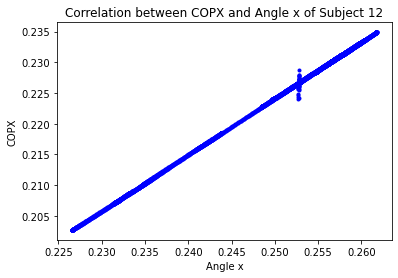

[[1.         0.99993991]
 [0.99993991 1.        ]]


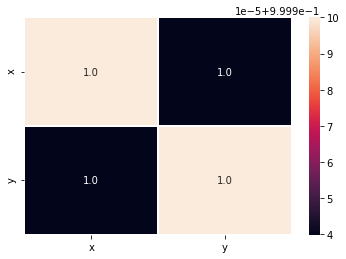

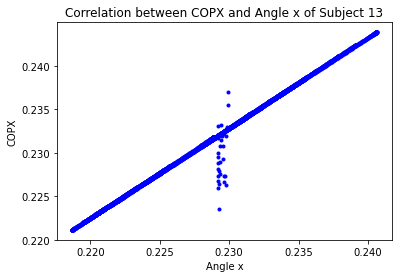

[[1.         0.99878647]
 [0.99878647 1.        ]]


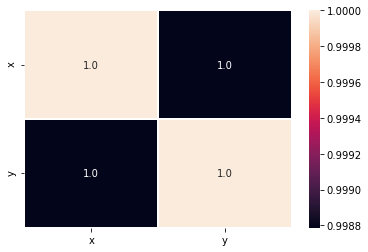

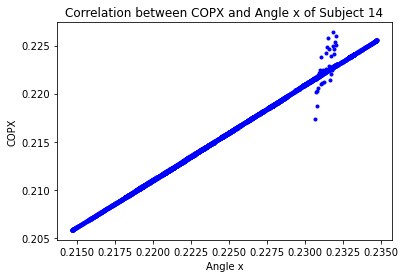

[[1.         0.99953947]
 [0.99953947 1.        ]]


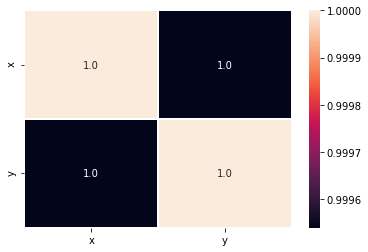

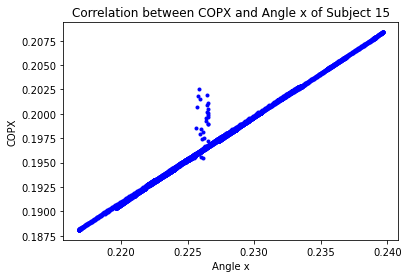

[[1.         0.99841346]
 [0.99841346 1.        ]]


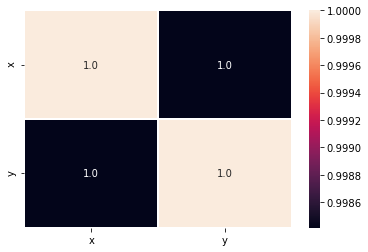

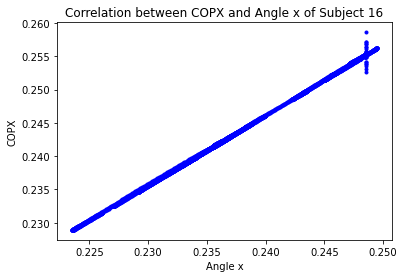

[[1.         0.99984469]
 [0.99984469 1.        ]]


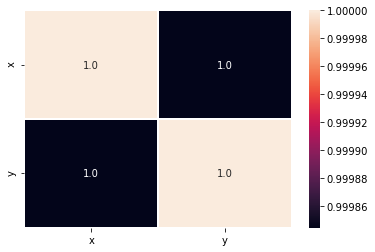

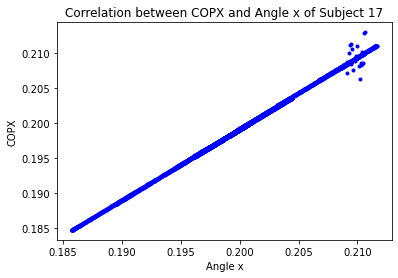

[[1.         0.99971847]
 [0.99971847 1.        ]]


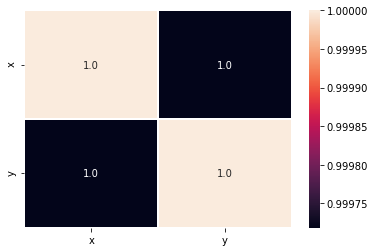

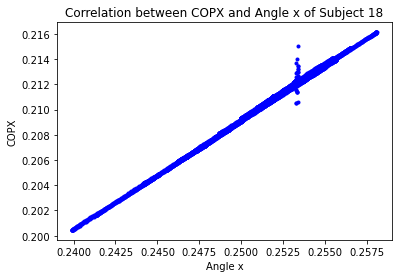

[[1.         0.99932591]
 [0.99932591 1.        ]]


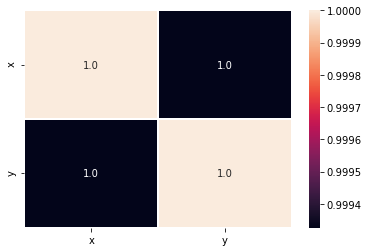

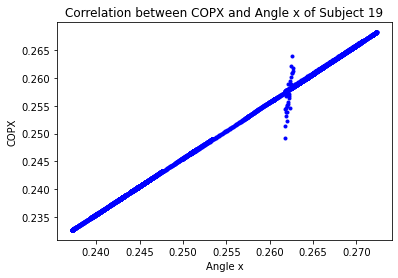

[[1.         0.99977485]
 [0.99977485 1.        ]]


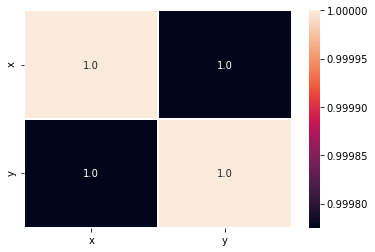

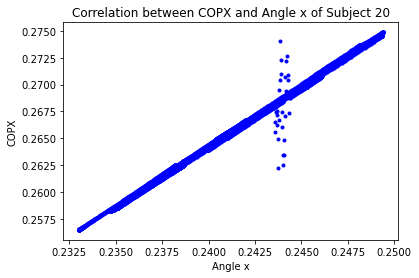

[[1.         0.99800281]
 [0.99800281 1.        ]]


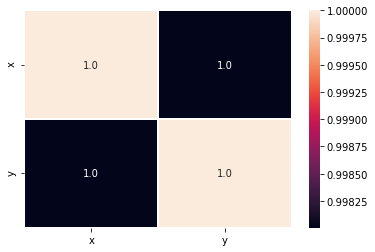

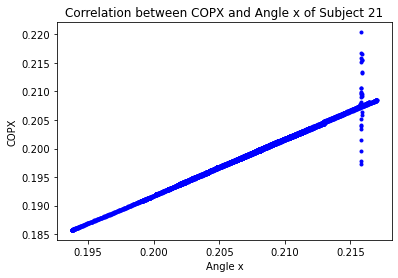

[[1.         0.99507459]
 [0.99507459 1.        ]]


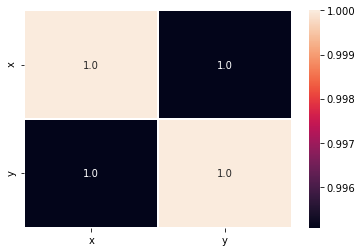

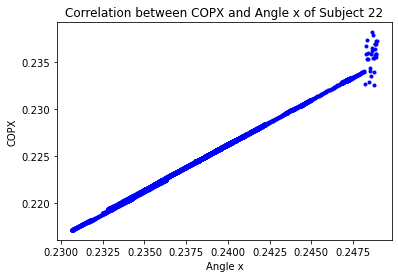

[[1.         0.99914548]
 [0.99914548 1.        ]]


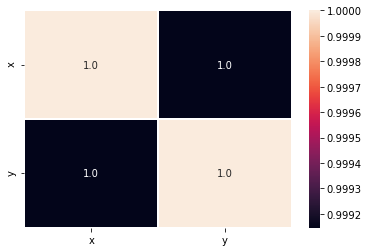

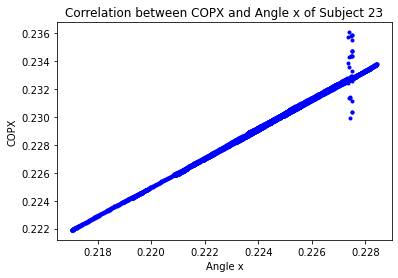

[[1.         0.99814786]
 [0.99814786 1.        ]]


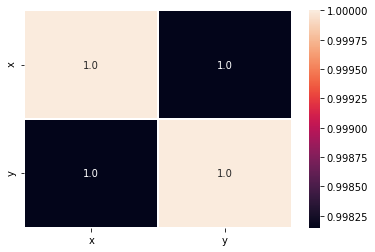

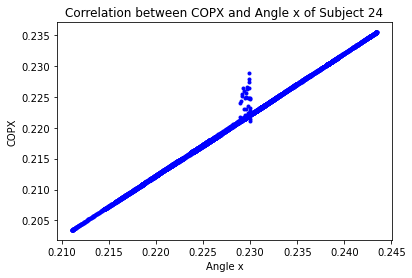

[[1.         0.99935377]
 [0.99935377 1.        ]]


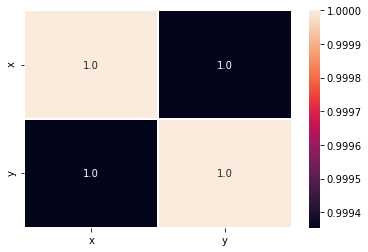

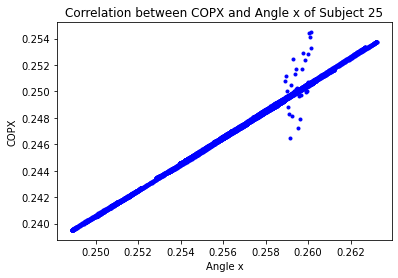

[[1.         0.99888123]
 [0.99888123 1.        ]]


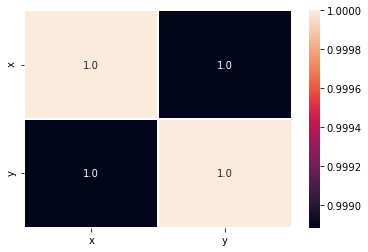

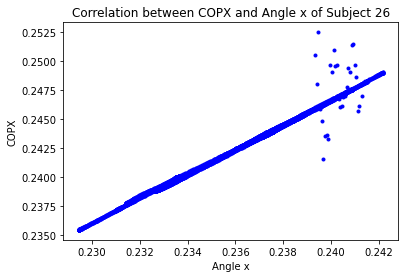

[[1.         0.99747097]
 [0.99747097 1.        ]]


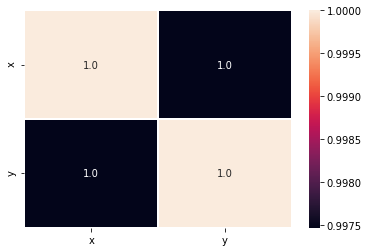

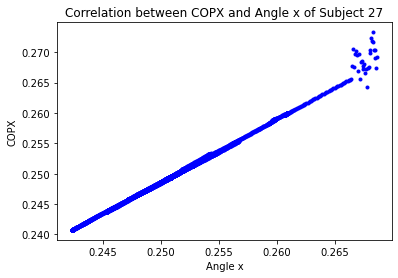

[[1.         0.99872393]
 [0.99872393 1.        ]]


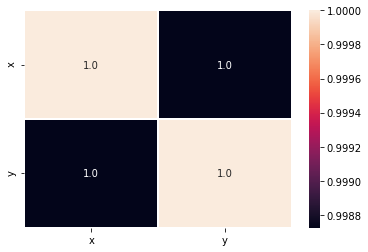

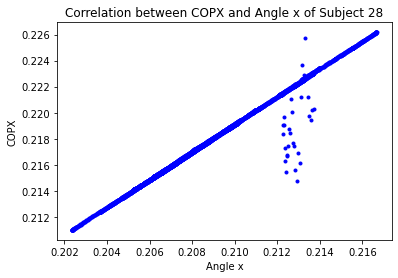

[[1.         0.99524863]
 [0.99524863 1.        ]]


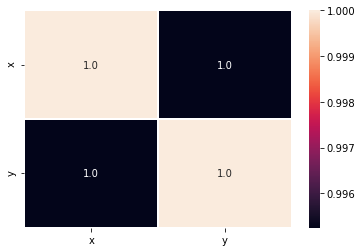

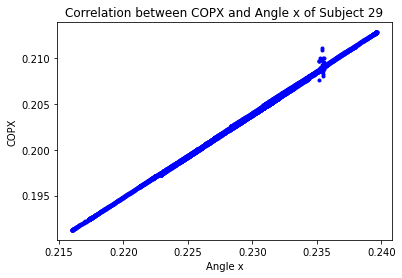

[[1.         0.99968809]
 [0.99968809 1.        ]]


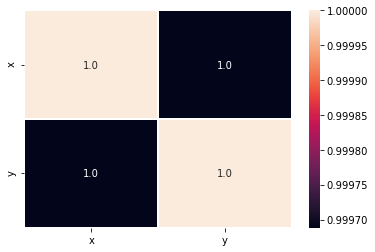

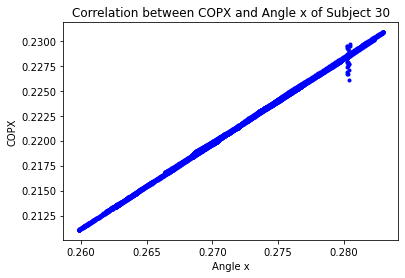

[[1.         0.99974174]
 [0.99974174 1.        ]]


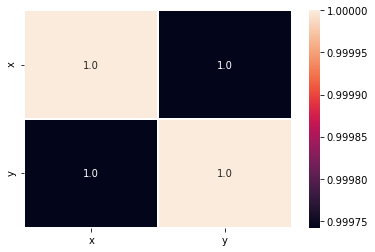

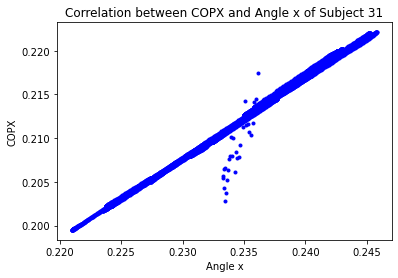

[[1.         0.99793168]
 [0.99793168 1.        ]]


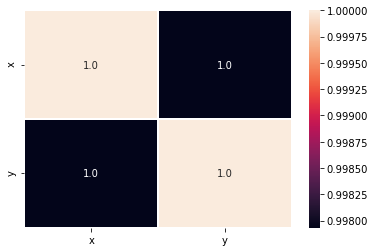

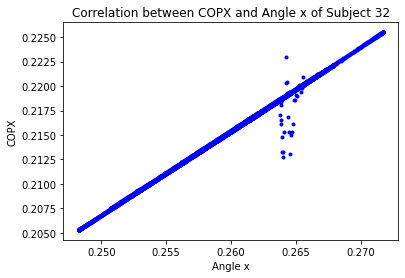

[[1.         0.99863319]
 [0.99863319 1.        ]]


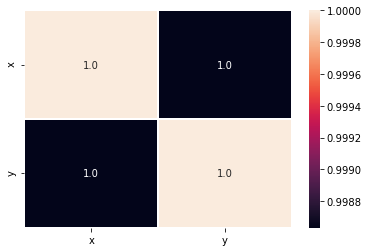

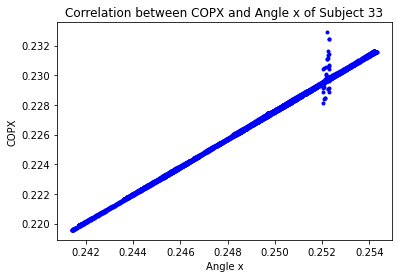

[[1.         0.99935356]
 [0.99935356 1.        ]]


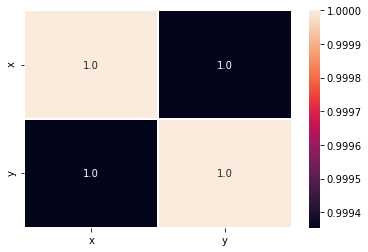

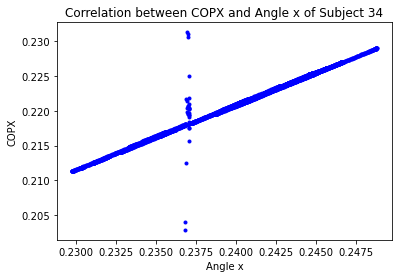

[[1.         0.99353262]
 [0.99353262 1.        ]]


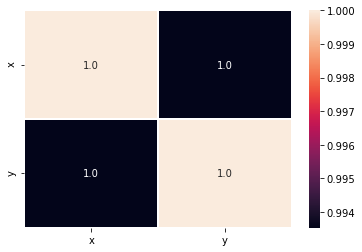

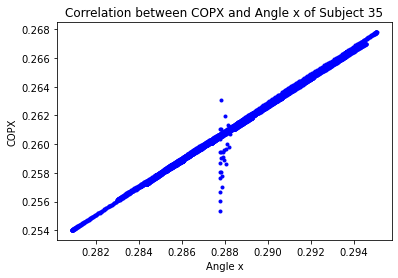

[[1.         0.99767475]
 [0.99767475 1.        ]]


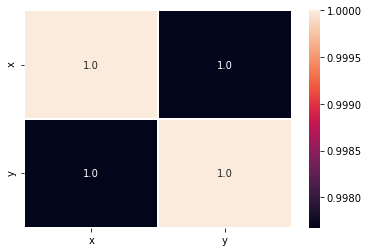

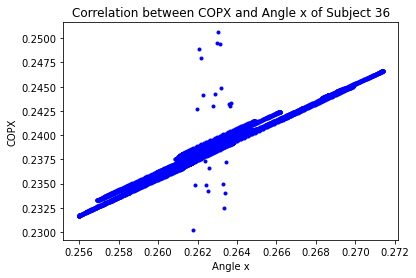

[[1.        0.9882368]
 [0.9882368 1.       ]]


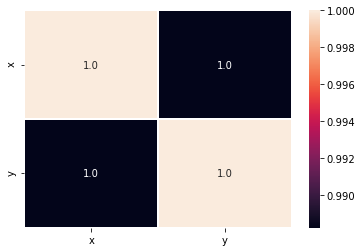

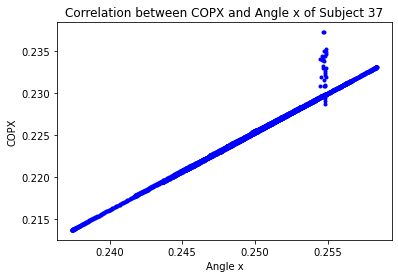

[[1.         0.99696837]
 [0.99696837 1.        ]]


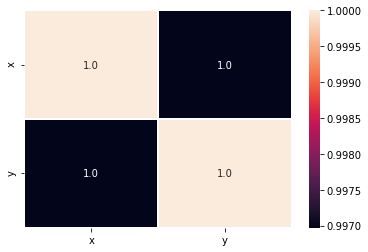

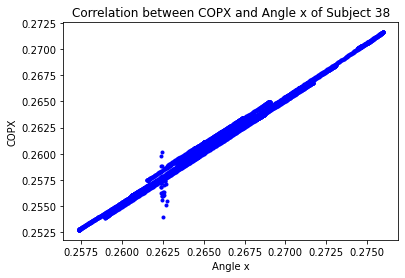

[[1.         0.99633003]
 [0.99633003 1.        ]]


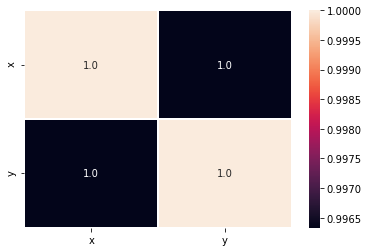

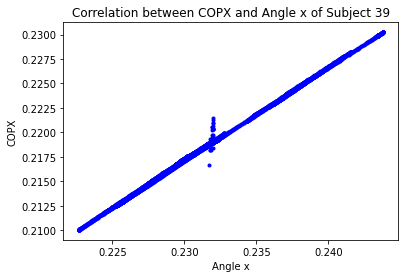

[[1.         0.99967673]
 [0.99967673 1.        ]]


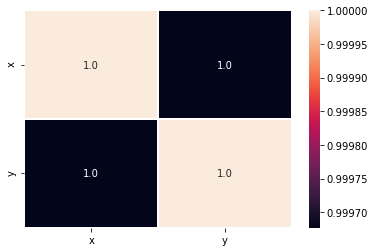

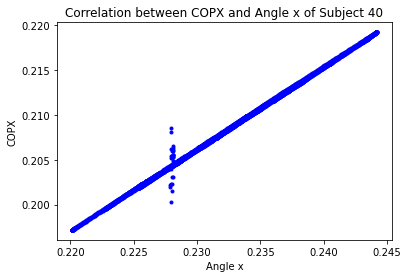

[[1.        0.9994833]
 [0.9994833 1.       ]]


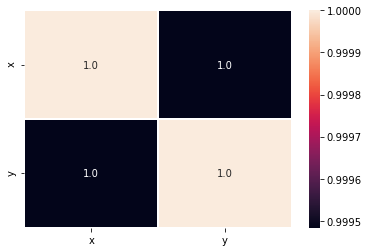

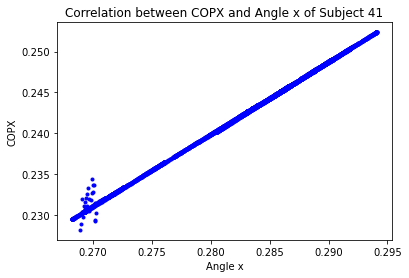

[[1.         0.99976597]
 [0.99976597 1.        ]]


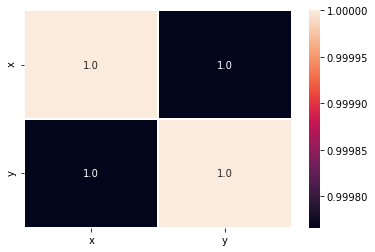

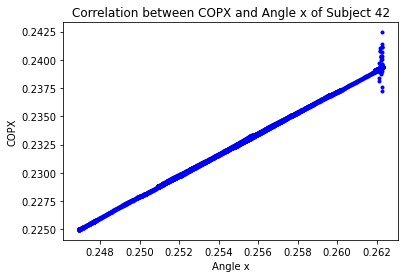

[[1.         0.99945875]
 [0.99945875 1.        ]]


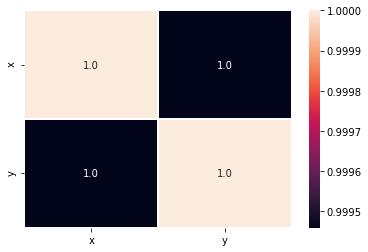

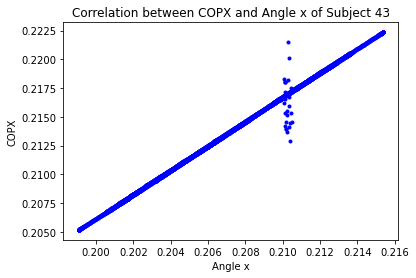

[[1.         0.99933212]
 [0.99933212 1.        ]]


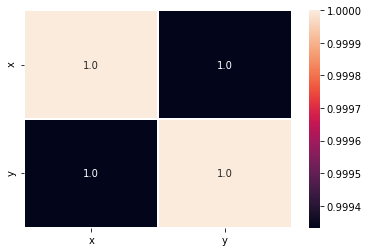

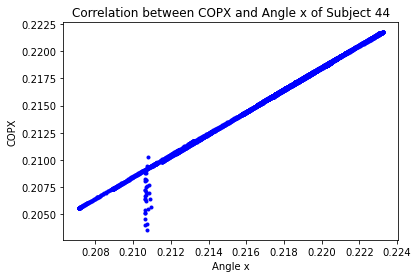

[[1.        0.9980544]
 [0.9980544 1.       ]]


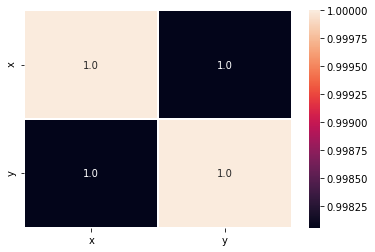

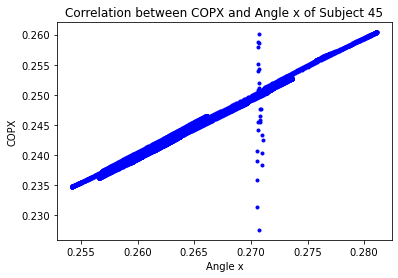

[[1.         0.99234465]
 [0.99234465 1.        ]]


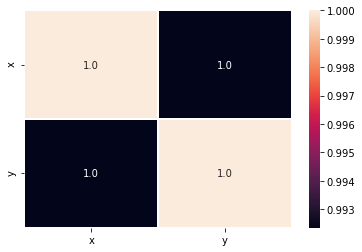

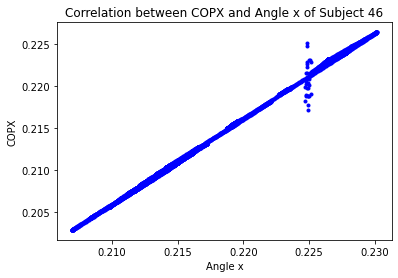

[[1.         0.99936411]
 [0.99936411 1.        ]]


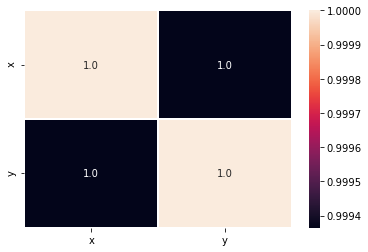

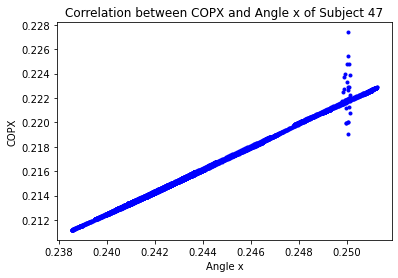

[[1.         0.99855013]
 [0.99855013 1.        ]]


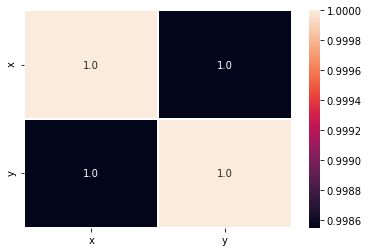

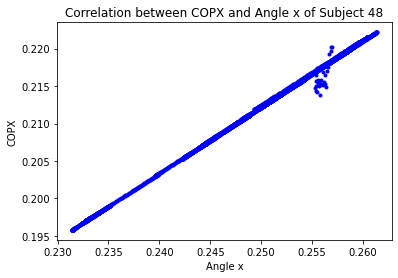

[[1.         0.99976628]
 [0.99976628 1.        ]]


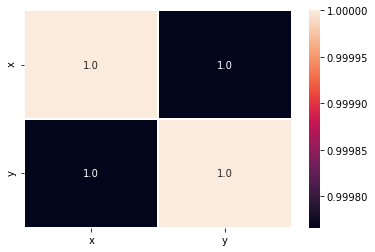

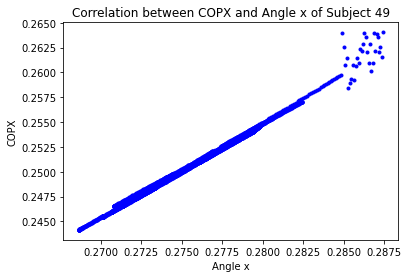

[[1.         0.99791615]
 [0.99791615 1.        ]]


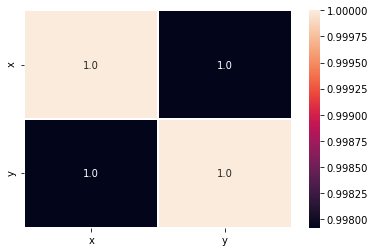

In [31]:
import pandas as pd 
import seaborn as sns
for s in range (1,50):
    a=PDSinfo[PDSinfo['Subject']==s].index.tolist()[2]
    fname_grf = os.path.join(path2, PDSinfo.Trial[a] + 'grf' + '.txt') 
    fname_mkr = os.path.join(path2, PDSinfo.Trial[a] + 'mkr' + '.txt')
    grf = pd.read_csv(fname_grf, delimiter='\t', header=0, engine='c')
    mkr = pd.read_csv(fname_mkr, delimiter='\t', header=0, engine='c')
    COGX=mkr['COG_X']
    COGY=mkr['COG_Y']
    COGZ=mkr['COG_Z']
    d=(COGX**2+COGY**2+COGZ**2)**0.5
    angulox = np.arcsin(COGX/d)
    anguloz= np.arcsin(COGZ/d)
    matrizangx=np.array(angulox[30:])
    matrizangz=np.array(anguloz[30:])
    t=grf['Time']
    dt=t[1]-t[0]
    d1x=np.zeros(len(matrizangx))
    d1z=np.zeros(len(matrizangz))
    for i in range(0, len(matrizangx)-1):
        next=i+1
        d1x[i]=(matrizangx[next]-matrizangx[i])/dt
        d1z[i]=(matrizangz[next]-matrizangz[i])/dt
    d2x=np.zeros(len(d1x))
    d2z=np.zeros(len(d1z))
    for i in range(0, 30):
        next=i+1
        d2x[i]=(d1x[next]-d1x[i])/dt
        d2z[i]=(d1z[next]-d1z[i])/dt
    COPX=COGX[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2x
    COPZ=COGZ[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2z
    COPXreal=grf['COPNET_X']
    COPZreal=grf['COPNET_Z']
    COPXmatrix=np.array(COPX)
    COPXrealmatrix=np.array(COPXreal[30:])
    COPZmatrix=np.array(COPZ)
    COPZrealmatrix=np.array(COPZreal[30:])
    errorx=np.subtract(COPXmatrix,COPXrealmatrix)
    errorz=np.subtract(COPZmatrix,COPZrealmatrix)
    data={'x':matrizangx,
         'y': COPXmatrix
         }
    df=pd.DataFrame(data)
    #ax=sns.lmplot(x=matrizangx, y=errorx, data= df)
    #ax
    plt.plot('x','y','bo',data= df, marker='.')
    plt.xlabel("Angle x")
    plt.ylabel("COPX")
    plt.title("Correlation between COPX and Angle x of Subject {}".format(s))
    plt.show()
    r=np.corrcoef(matrizangx,COPXmatrix)
    print(r)
    plt.figure()
    data={'x':matrizangx,
          'y': COPXmatrix
         }
    df=pd.DataFrame(data)
    correlation=df.corr()
    plot=sns.heatmap(correlation,annot= True, fmt='.1f',linewidths=.6)
    plt.show()

# Correlation between COPX and First Derivative x

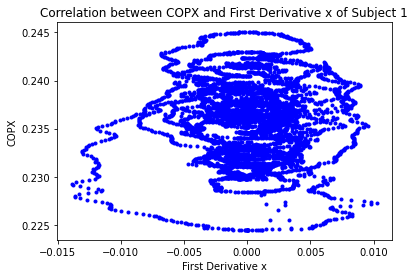

[[1.         0.00575093]
 [0.00575093 1.        ]]


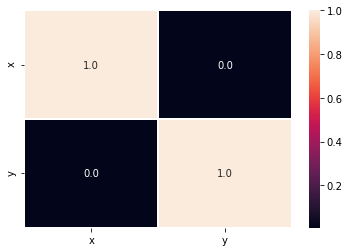

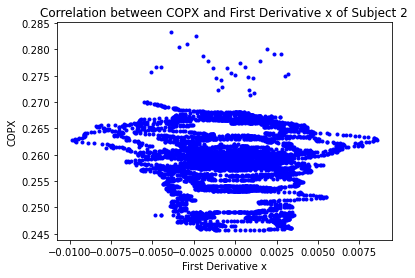

[[ 1.         -0.06019288]
 [-0.06019288  1.        ]]


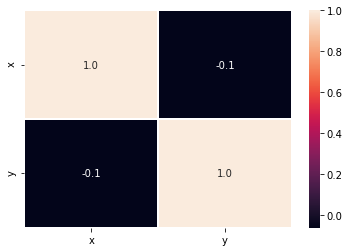

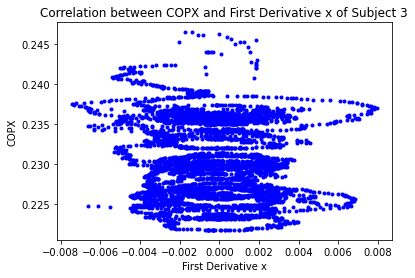

[[ 1.         -0.08316466]
 [-0.08316466  1.        ]]


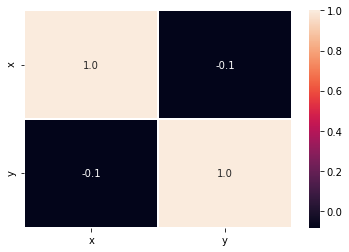

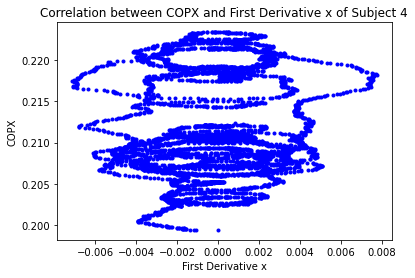

[[1.         0.07482018]
 [0.07482018 1.        ]]


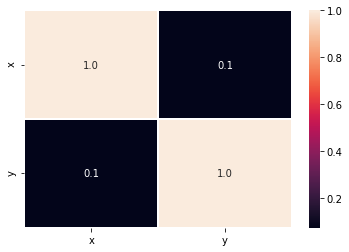

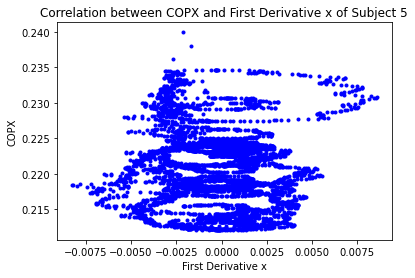

[[ 1.         -0.03315114]
 [-0.03315114  1.        ]]


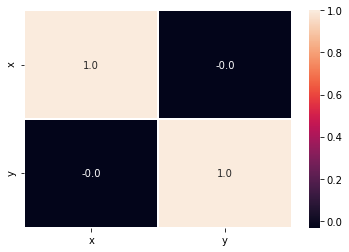

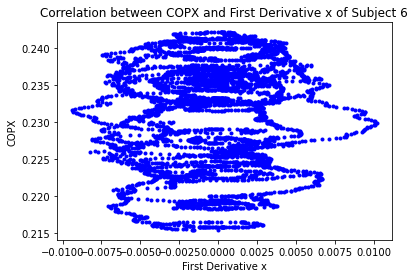

[[1.         0.07577445]
 [0.07577445 1.        ]]


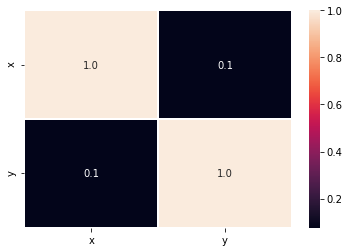

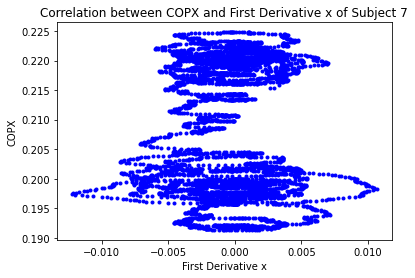

[[1.         0.02168919]
 [0.02168919 1.        ]]


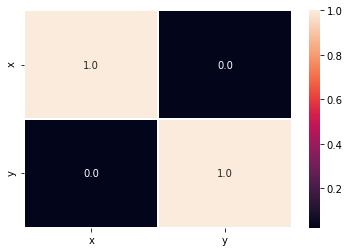

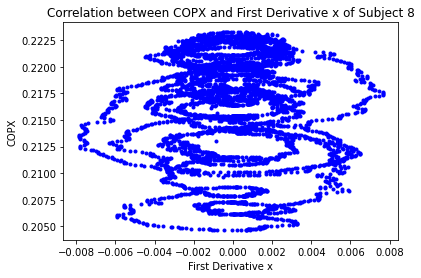

[[ 1.00000000e+00 -3.20139785e-04]
 [-3.20139785e-04  1.00000000e+00]]


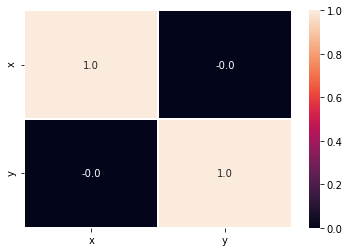

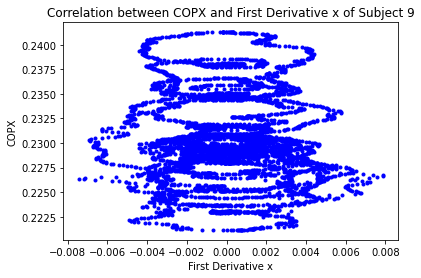

[[ 1.         -0.03105646]
 [-0.03105646  1.        ]]


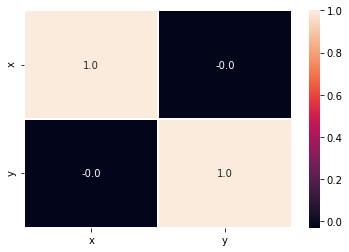

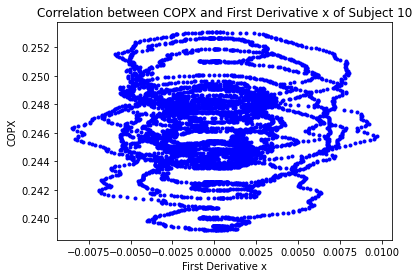

[[ 1.         -0.00408307]
 [-0.00408307  1.        ]]


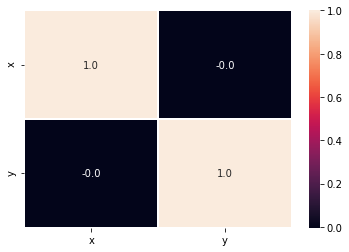

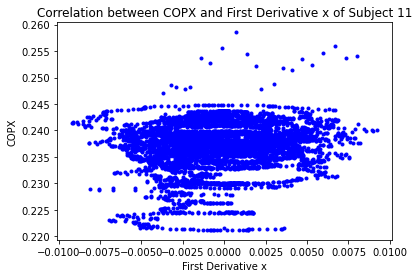

[[1.         0.13531246]
 [0.13531246 1.        ]]


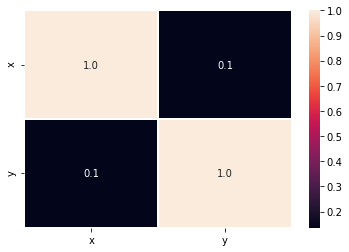

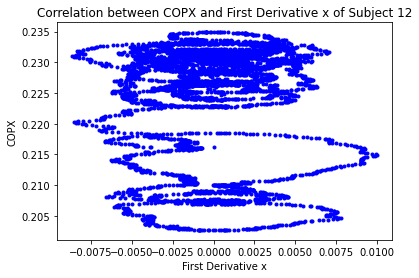

[[1.         0.02202994]
 [0.02202994 1.        ]]


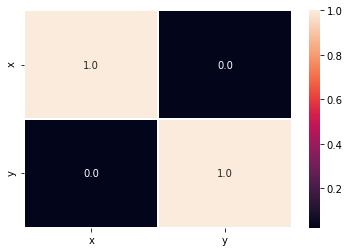

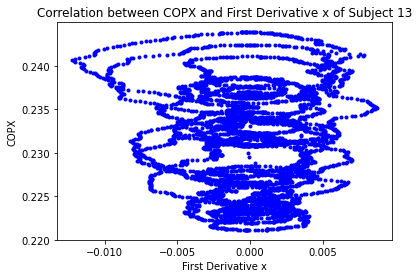

[[ 1.         -0.00467689]
 [-0.00467689  1.        ]]


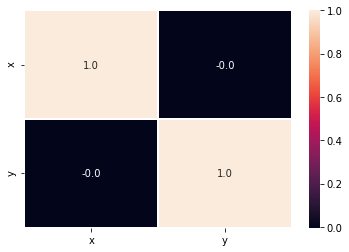

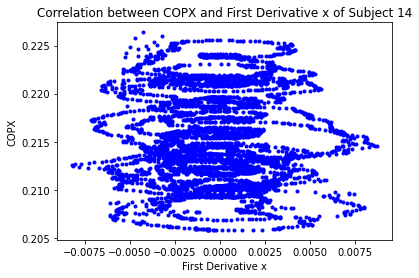

[[ 1.        -0.0290085]
 [-0.0290085  1.       ]]


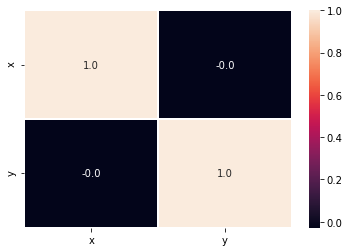

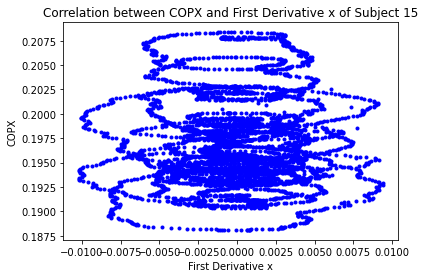

[[1.         0.01856805]
 [0.01856805 1.        ]]


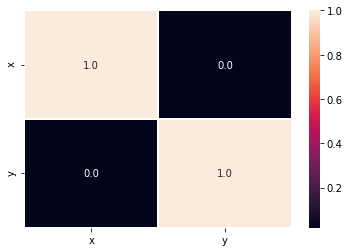

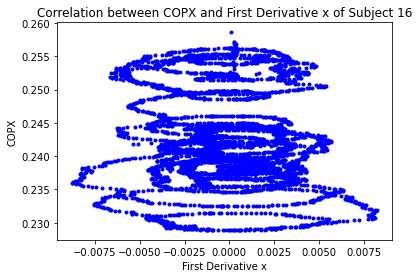

[[ 1.         -0.07297306]
 [-0.07297306  1.        ]]


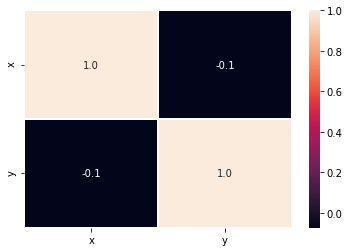

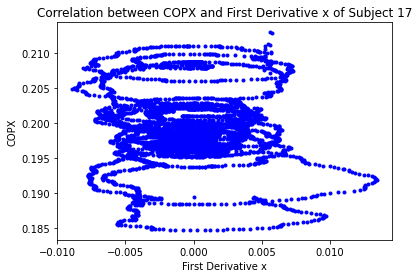

[[ 1.         -0.00172107]
 [-0.00172107  1.        ]]


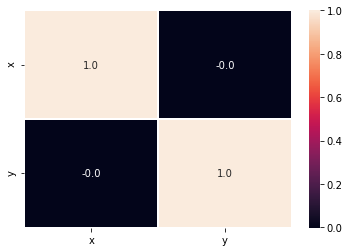

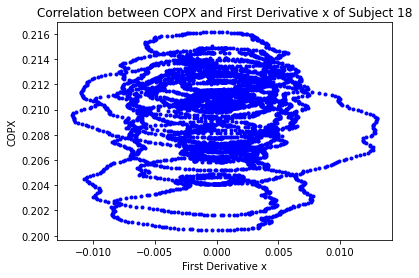

[[ 1.         -0.00780975]
 [-0.00780975  1.        ]]


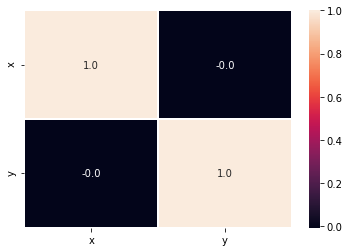

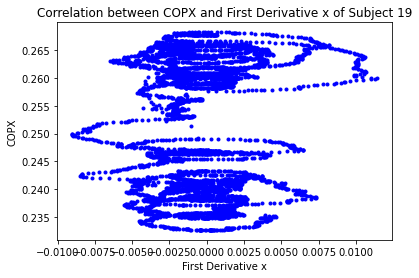

[[1.         0.05429743]
 [0.05429743 1.        ]]


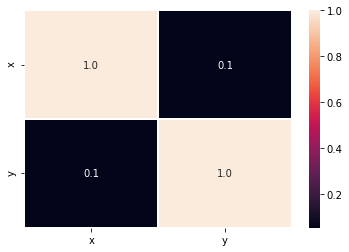

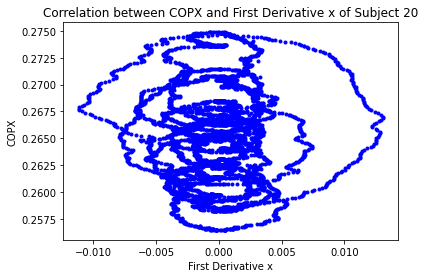

[[ 1.00000000e+00 -5.01605289e-04]
 [-5.01605289e-04  1.00000000e+00]]


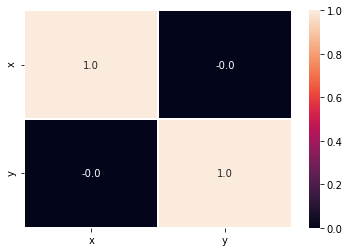

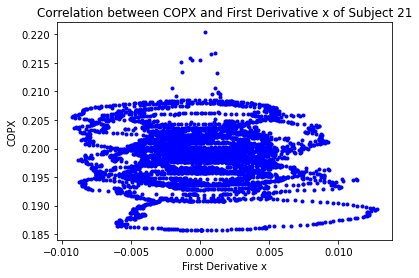

[[ 1.         -0.03431993]
 [-0.03431993  1.        ]]


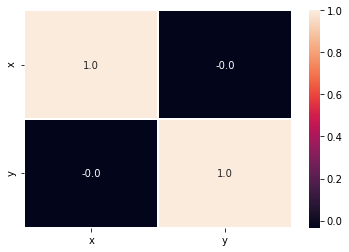

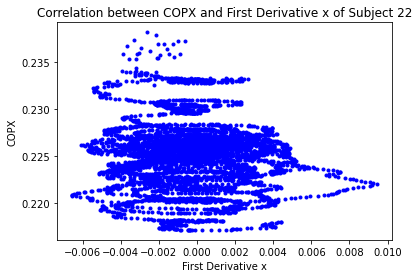

[[ 1.         -0.05157239]
 [-0.05157239  1.        ]]


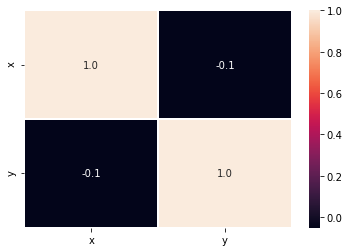

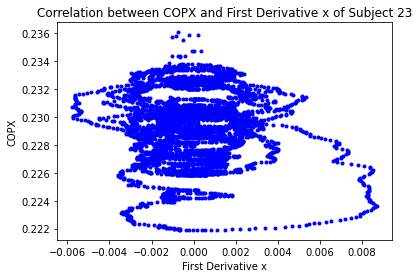

[[ 1.         -0.02626279]
 [-0.02626279  1.        ]]


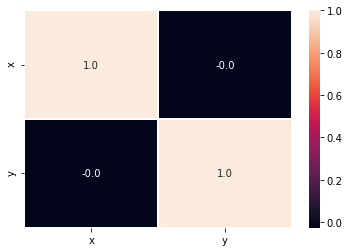

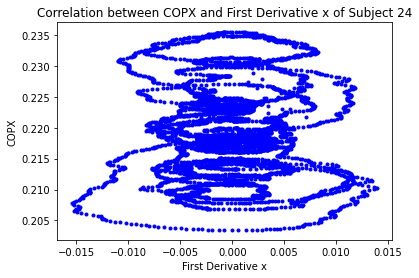

[[1.         0.00393995]
 [0.00393995 1.        ]]


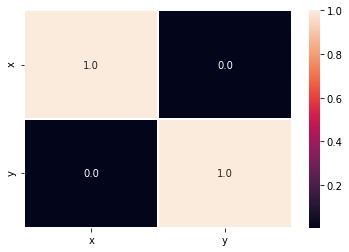

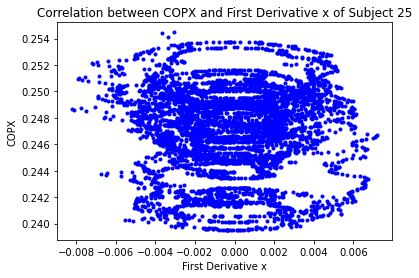

[[1.         0.01869223]
 [0.01869223 1.        ]]


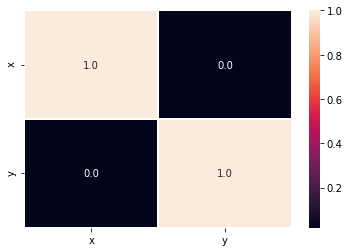

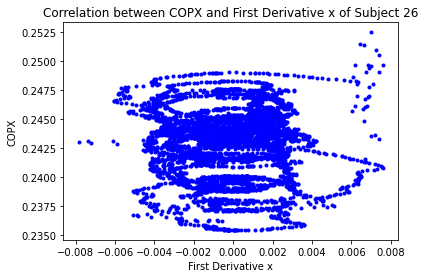

[[ 1.00000000e+00 -1.58384185e-04]
 [-1.58384185e-04  1.00000000e+00]]


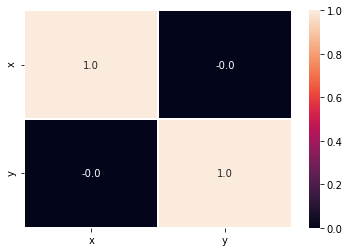

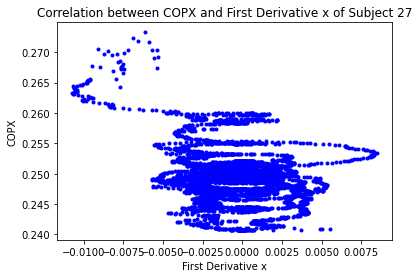

[[ 1.         -0.28177952]
 [-0.28177952  1.        ]]


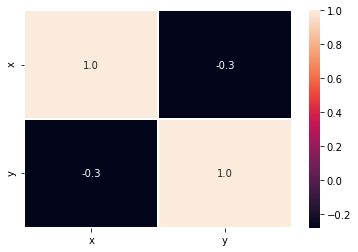

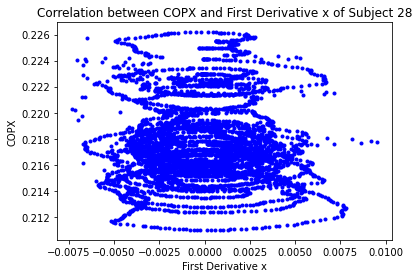

[[ 1.         -0.02676037]
 [-0.02676037  1.        ]]


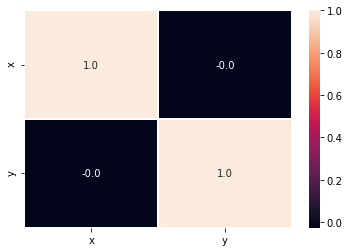

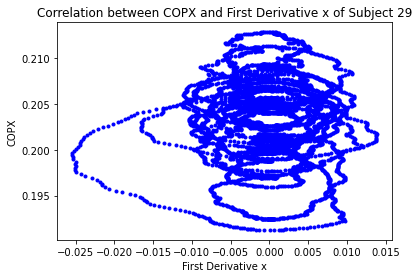

[[ 1.         -0.01642008]
 [-0.01642008  1.        ]]


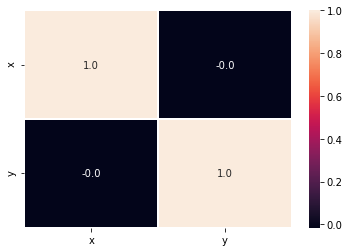

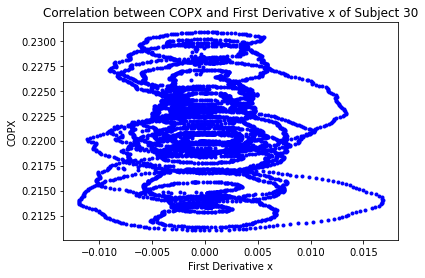

[[ 1.        -0.0309042]
 [-0.0309042  1.       ]]


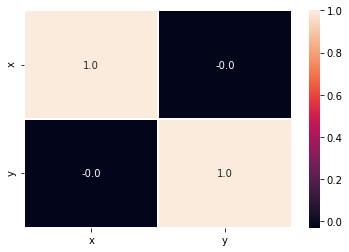

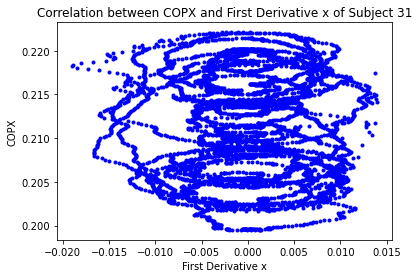

[[ 1.         -0.00661204]
 [-0.00661204  1.        ]]


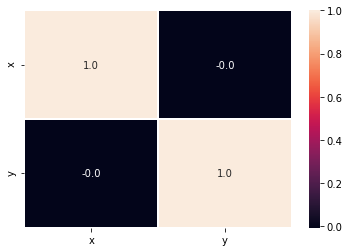

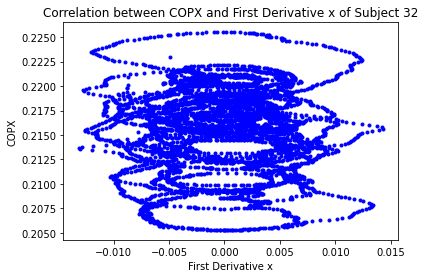

[[ 1.        -0.0133315]
 [-0.0133315  1.       ]]


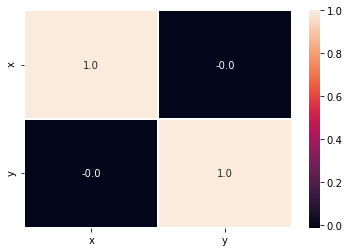

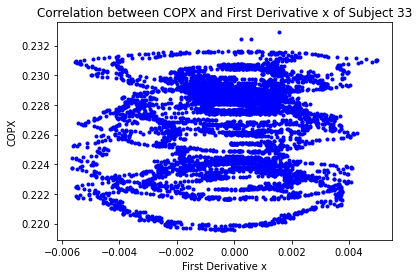

[[1.         0.06570511]
 [0.06570511 1.        ]]


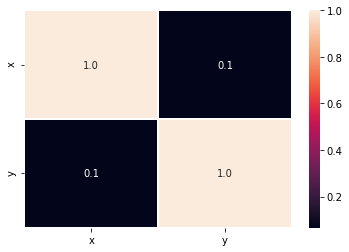

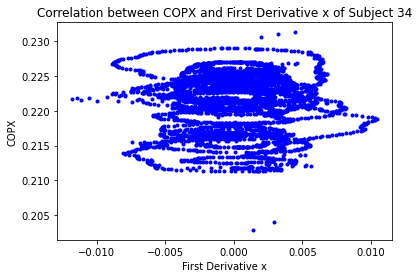

[[ 1.         -0.01604957]
 [-0.01604957  1.        ]]


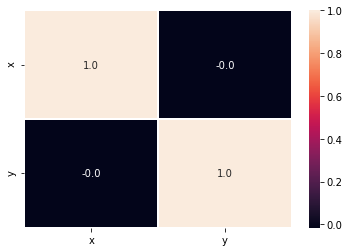

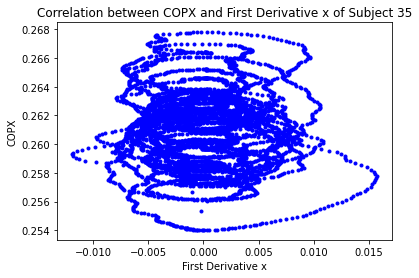

[[ 1.         -0.00942927]
 [-0.00942927  1.        ]]


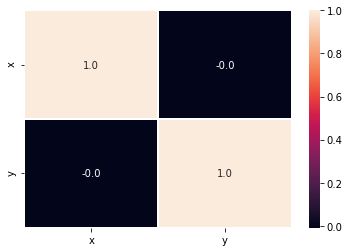

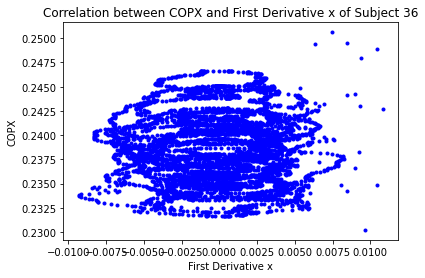

[[1.         0.00109444]
 [0.00109444 1.        ]]


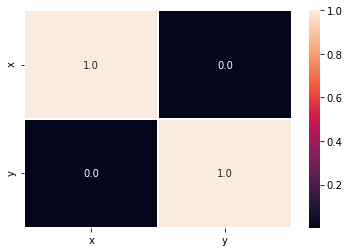

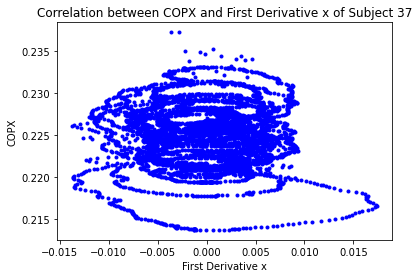

[[ 1.         -0.01429486]
 [-0.01429486  1.        ]]


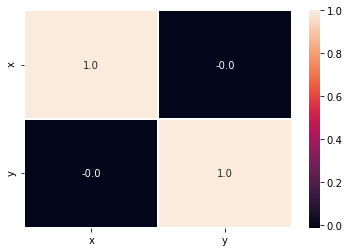

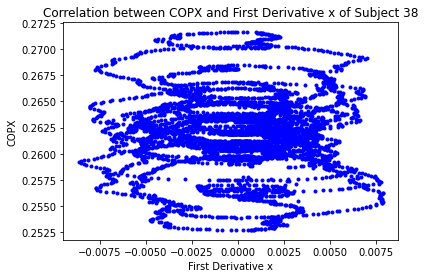

[[1.         0.00287086]
 [0.00287086 1.        ]]


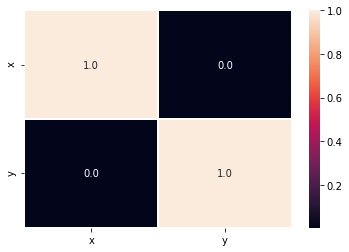

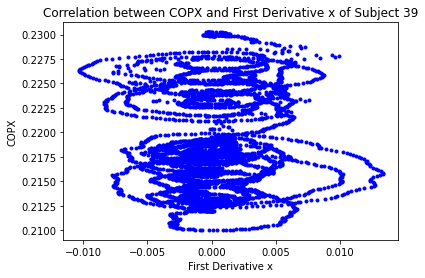

[[1.         0.07537755]
 [0.07537755 1.        ]]


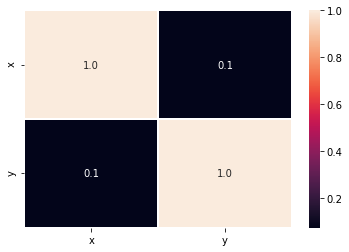

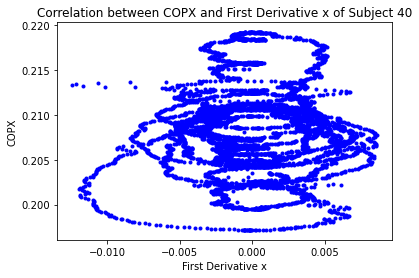

[[1.         0.00748867]
 [0.00748867 1.        ]]


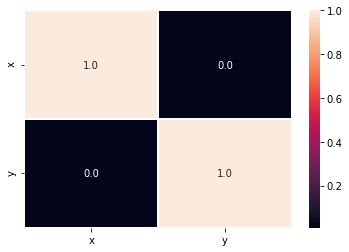

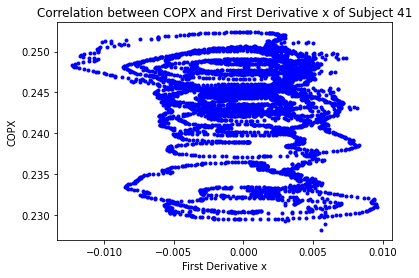

[[ 1.         -0.09311939]
 [-0.09311939  1.        ]]


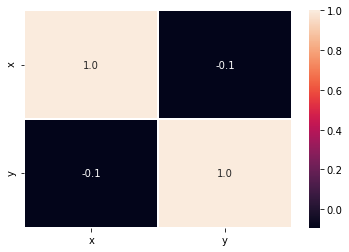

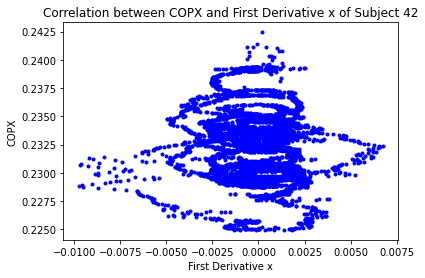

[[ 1.         -0.06686704]
 [-0.06686704  1.        ]]


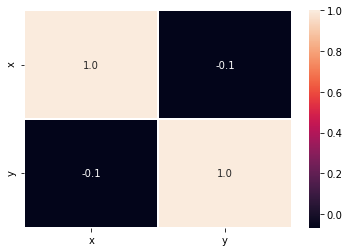

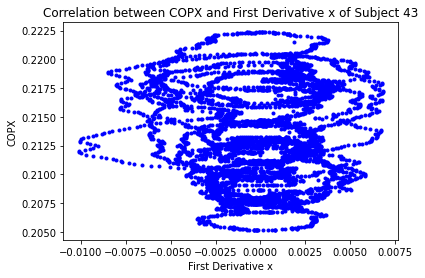

[[ 1.         -0.01120034]
 [-0.01120034  1.        ]]


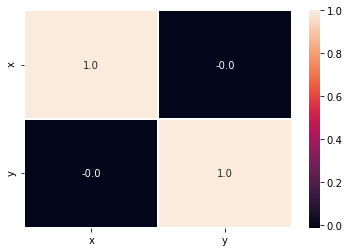

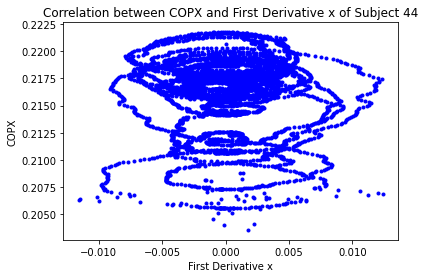

[[ 1.        -0.0271328]
 [-0.0271328  1.       ]]


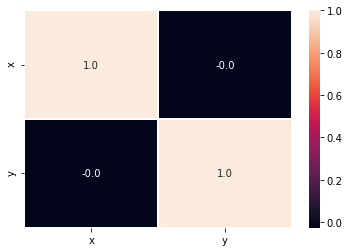

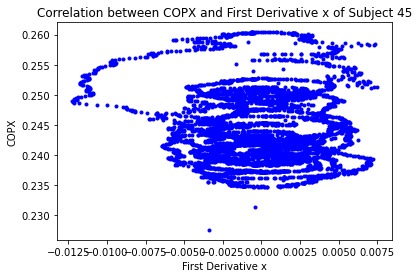

[[ 1.        -0.0191554]
 [-0.0191554  1.       ]]


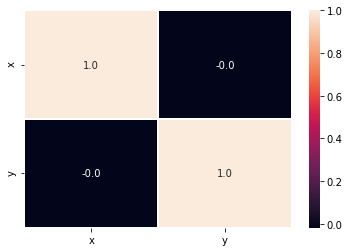

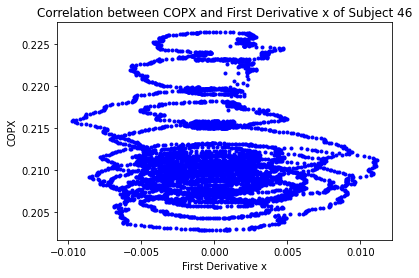

[[ 1.         -0.03279778]
 [-0.03279778  1.        ]]


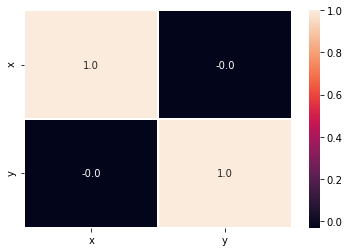

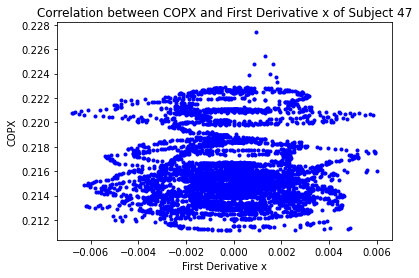

[[ 1.         -0.02607109]
 [-0.02607109  1.        ]]


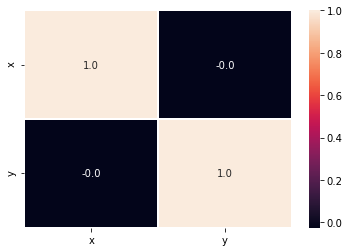

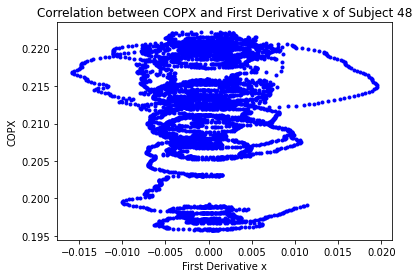

[[1.        0.0486985]
 [0.0486985 1.       ]]


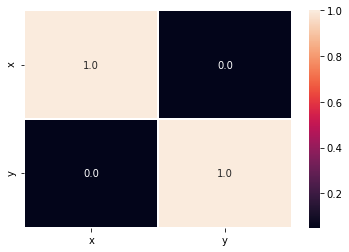

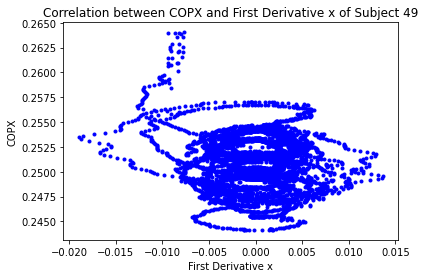

[[ 1.         -0.11912765]
 [-0.11912765  1.        ]]


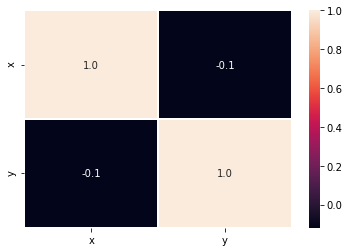

In [37]:
import pandas as pd 
import seaborn as sns
for s in range (1,50):
    a=PDSinfo[PDSinfo['Subject']==s].index.tolist()[2]
    fname_grf = os.path.join(path2, PDSinfo.Trial[a] + 'grf' + '.txt') 
    fname_mkr = os.path.join(path2, PDSinfo.Trial[a] + 'mkr' + '.txt')
    grf = pd.read_csv(fname_grf, delimiter='\t', header=0, engine='c')
    mkr = pd.read_csv(fname_mkr, delimiter='\t', header=0, engine='c')
    COGX=mkr['COG_X']
    COGY=mkr['COG_Y']
    COGZ=mkr['COG_Z']
    d=(COGX**2+COGY**2+COGZ**2)**0.5
    angulox = np.arcsin(COGX/d)
    anguloz= np.arcsin(COGZ/d)
    matrizangx=np.array(angulox[30:])
    matrizangz=np.array(anguloz[30:])
    t=grf['Time']
    dt=t[1]-t[0]
    d1x=np.zeros(len(matrizangx))
    d1z=np.zeros(len(matrizangz))
    for i in range(0, len(matrizangx)-1):
        next=i+1
        d1x[i]=(matrizangx[next]-matrizangx[i])/dt
        d1z[i]=(matrizangz[next]-matrizangz[i])/dt
    d2x=np.zeros(len(d1x))
    d2z=np.zeros(len(d1z))
    for i in range(0, 30):
        next=i+1
        d2x[i]=(d1x[next]-d1x[i])/dt
        d2z[i]=(d1z[next]-d1z[i])/dt
    COPX=COGX[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2x
    COPZ=COGZ[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2z
    COPXreal=grf['COPNET_X']
    COPZreal=grf['COPNET_Z']
    COPXmatrix=np.array(COPX)
    COPXrealmatrix=np.array(COPXreal[30:])
    COPZmatrix=np.array(COPZ)
    COPZrealmatrix=np.array(COPZreal[30:])
    errorx=np.subtract(COPXmatrix,COPXrealmatrix)
    errorz=np.subtract(COPZmatrix,COPZrealmatrix)
    data={'x':d1x,
         'y': COPXmatrix
         }
    df=pd.DataFrame(data)
    plt.plot('x','y','bo',data= df, marker='.')
    plt.xlabel("First Derivative x")
    plt.ylabel("COPX")
    plt.title("Correlation between COPX and First Derivative x of Subject {}".format(s))
    plt.show()
    r=np.corrcoef(d1x,COPXmatrix)
    print(r)
    plt.figure()
    data={'x':d1x,
          'y': COPXmatrix
         }
    df=pd.DataFrame(data)
    correlation=df.corr()
    plot=sns.heatmap(correlation,annot= True, fmt='.1f',linewidths=.6)
    plt.show()

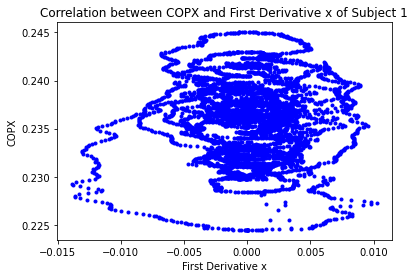

[[1.         0.00575093]
 [0.00575093 1.        ]]


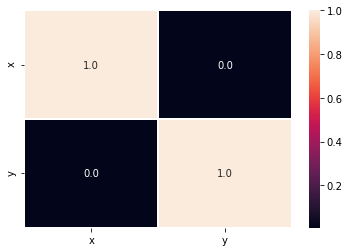

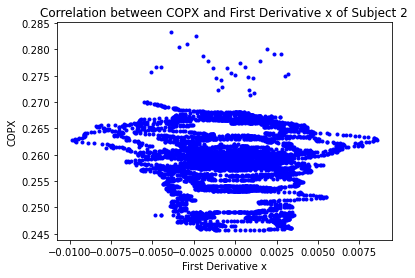

[[ 1.         -0.06019288]
 [-0.06019288  1.        ]]


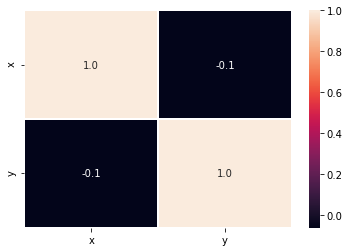

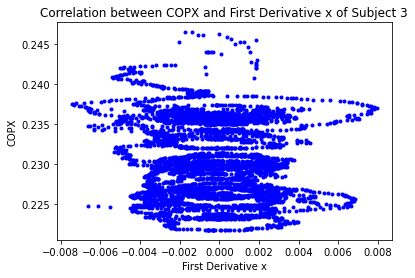

[[ 1.         -0.08316466]
 [-0.08316466  1.        ]]


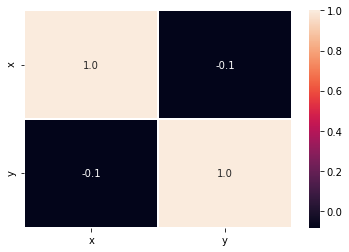

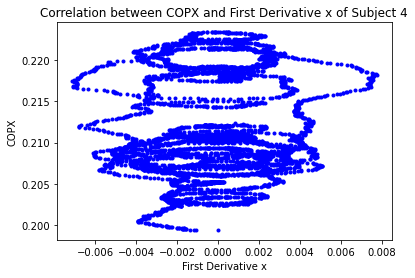

[[1.         0.07482018]
 [0.07482018 1.        ]]


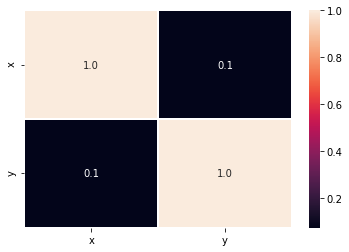

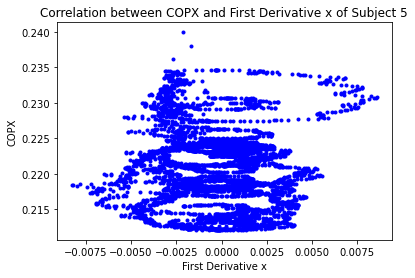

[[ 1.         -0.03315114]
 [-0.03315114  1.        ]]


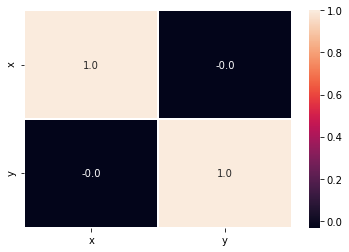

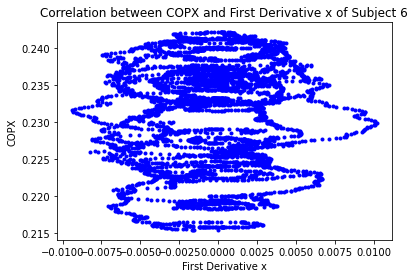

[[1.         0.07577445]
 [0.07577445 1.        ]]


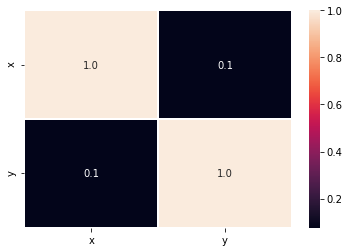

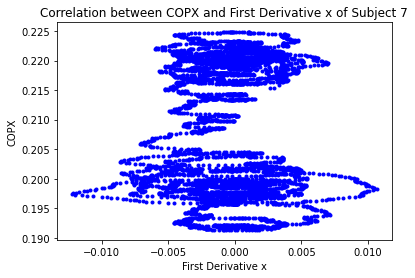

[[1.         0.02168919]
 [0.02168919 1.        ]]


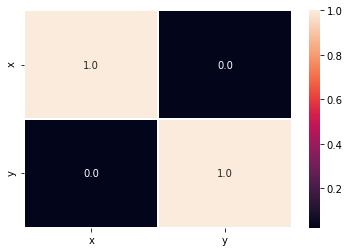

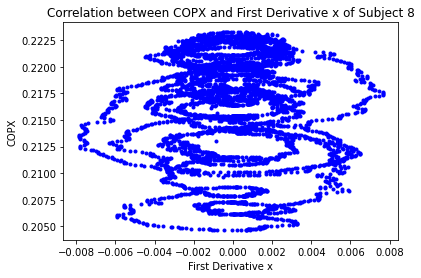

[[ 1.00000000e+00 -3.20139785e-04]
 [-3.20139785e-04  1.00000000e+00]]


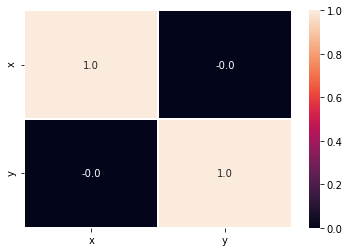

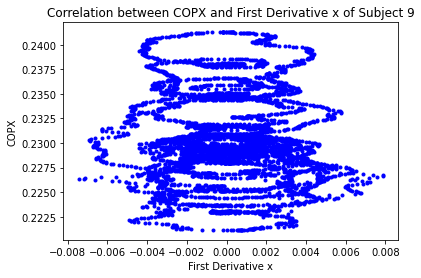

[[ 1.         -0.03105646]
 [-0.03105646  1.        ]]


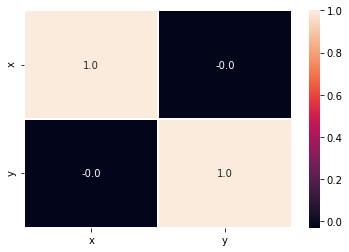

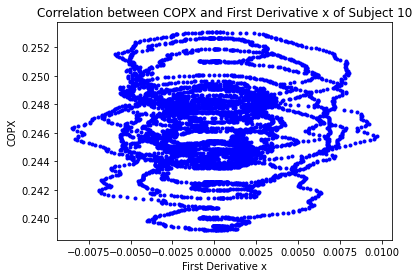

[[ 1.         -0.00408307]
 [-0.00408307  1.        ]]


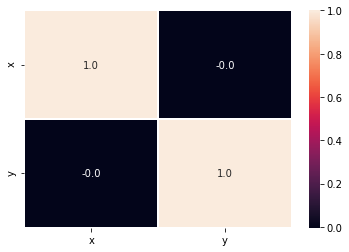

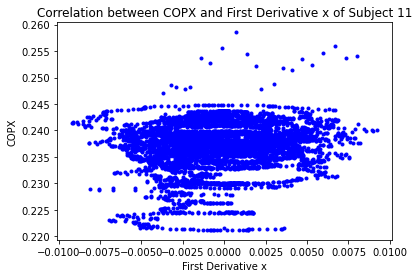

[[1.         0.13531246]
 [0.13531246 1.        ]]


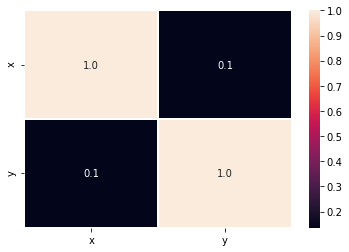

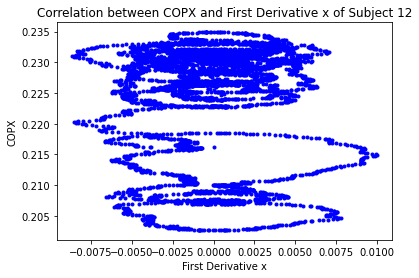

[[1.         0.02202994]
 [0.02202994 1.        ]]


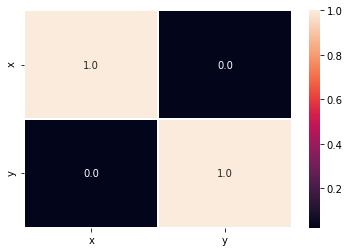

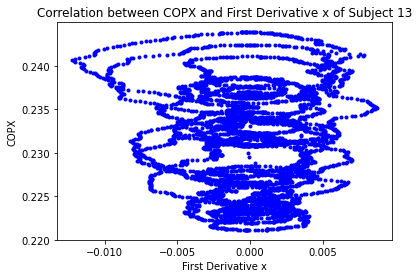

[[ 1.         -0.00467689]
 [-0.00467689  1.        ]]


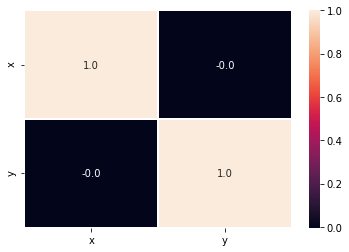

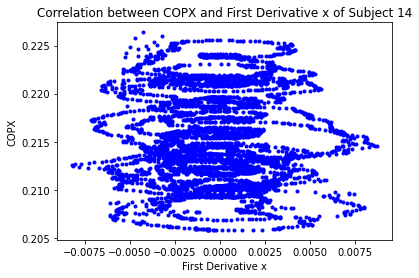

[[ 1.        -0.0290085]
 [-0.0290085  1.       ]]


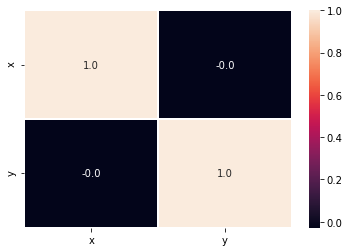

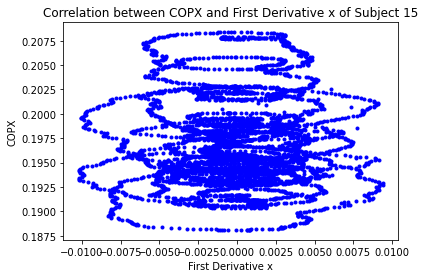

[[1.         0.01856805]
 [0.01856805 1.        ]]


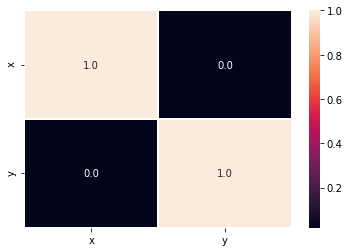

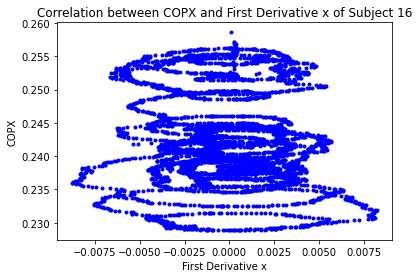

[[ 1.         -0.07297306]
 [-0.07297306  1.        ]]


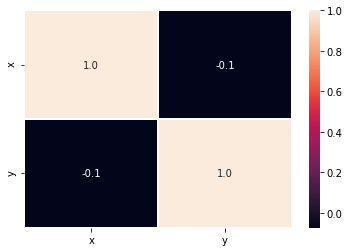

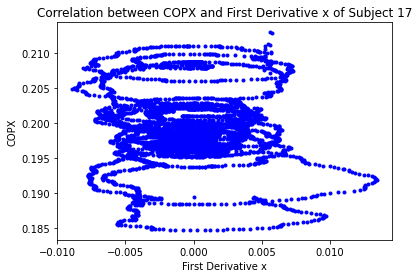

[[ 1.         -0.00172107]
 [-0.00172107  1.        ]]


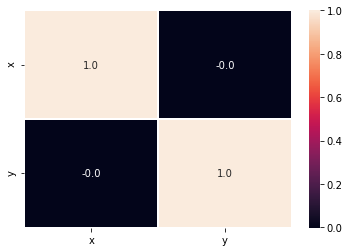

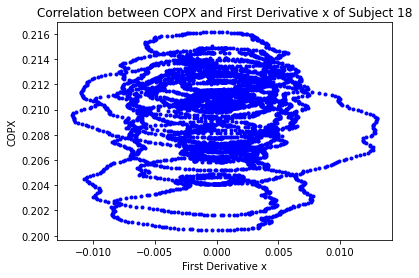

[[ 1.         -0.00780975]
 [-0.00780975  1.        ]]


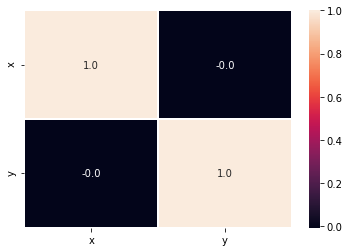

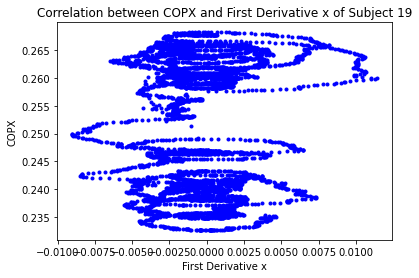

[[1.         0.05429743]
 [0.05429743 1.        ]]


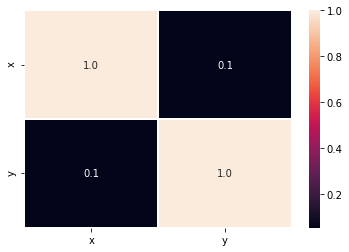

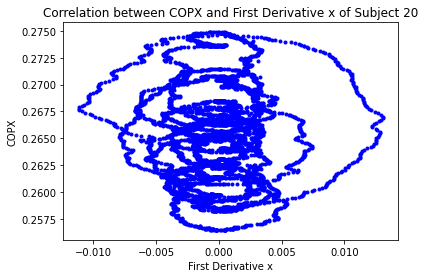

[[ 1.00000000e+00 -5.01605289e-04]
 [-5.01605289e-04  1.00000000e+00]]


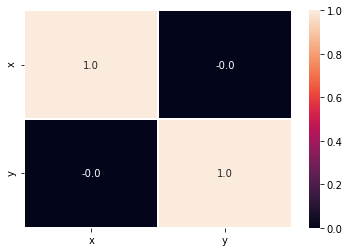

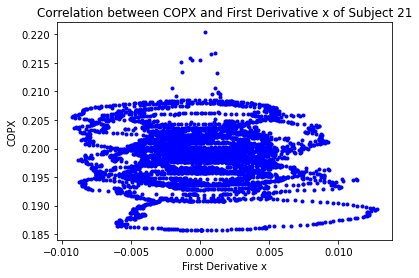

[[ 1.         -0.03431993]
 [-0.03431993  1.        ]]


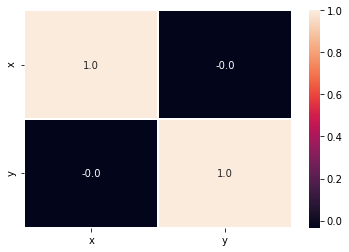

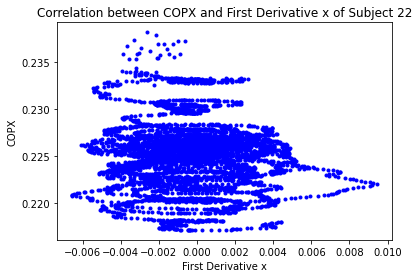

[[ 1.         -0.05157239]
 [-0.05157239  1.        ]]


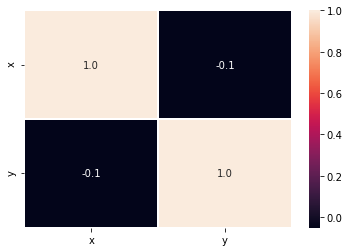

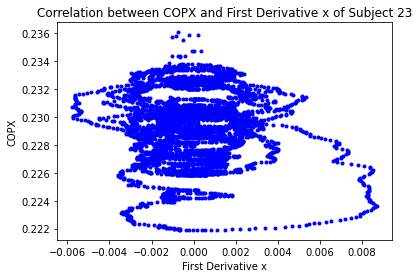

[[ 1.         -0.02626279]
 [-0.02626279  1.        ]]


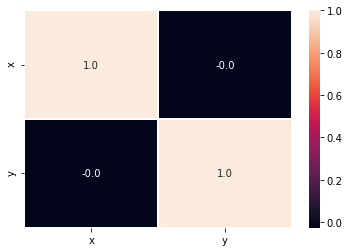

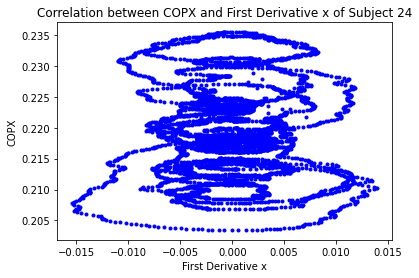

[[1.         0.00393995]
 [0.00393995 1.        ]]


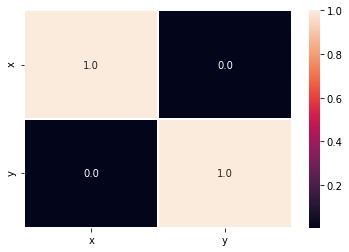

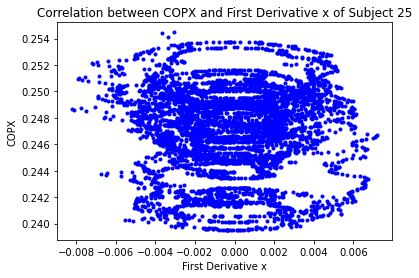

[[1.         0.01869223]
 [0.01869223 1.        ]]


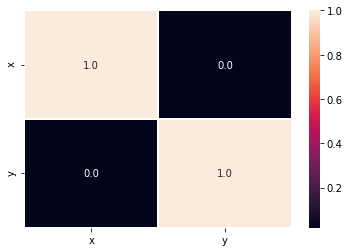

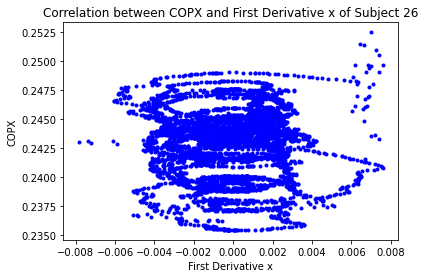

[[ 1.00000000e+00 -1.58384185e-04]
 [-1.58384185e-04  1.00000000e+00]]


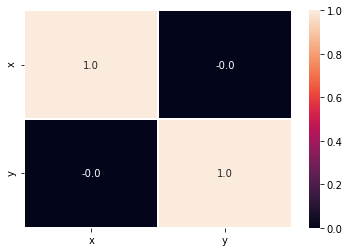

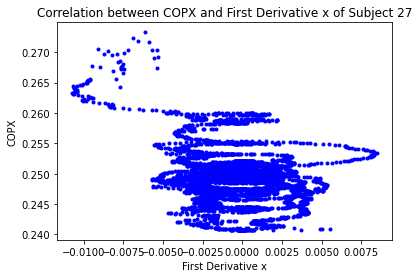

[[ 1.         -0.28177952]
 [-0.28177952  1.        ]]


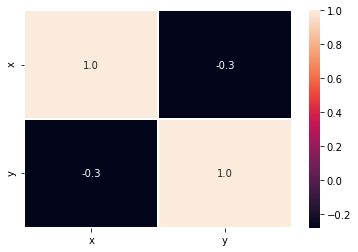

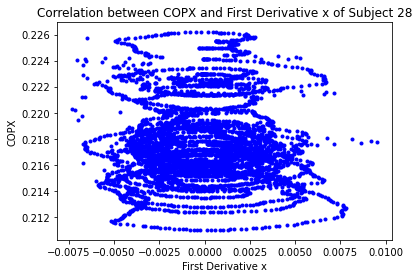

[[ 1.         -0.02676037]
 [-0.02676037  1.        ]]


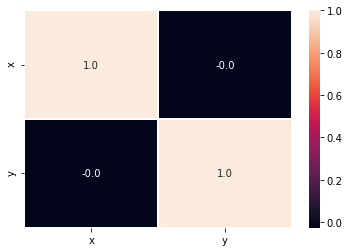

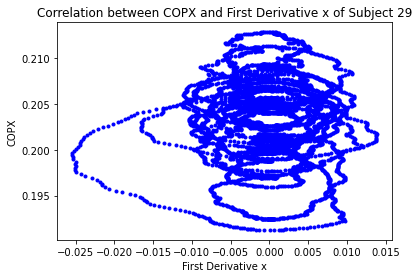

[[ 1.         -0.01642008]
 [-0.01642008  1.        ]]


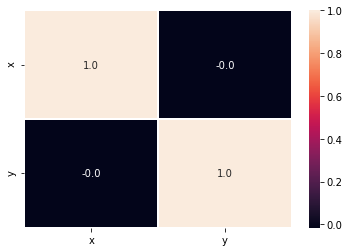

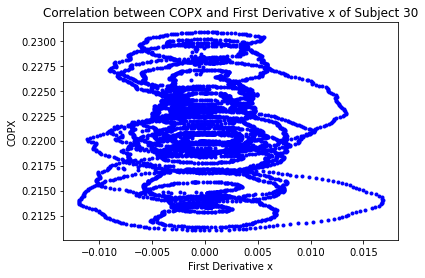

[[ 1.        -0.0309042]
 [-0.0309042  1.       ]]


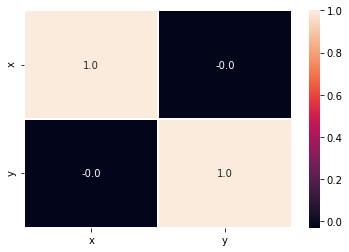

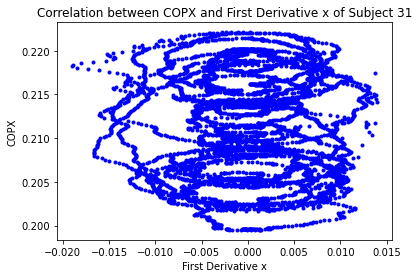

[[ 1.         -0.00661204]
 [-0.00661204  1.        ]]


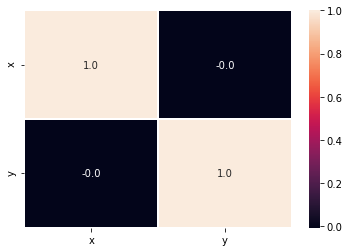

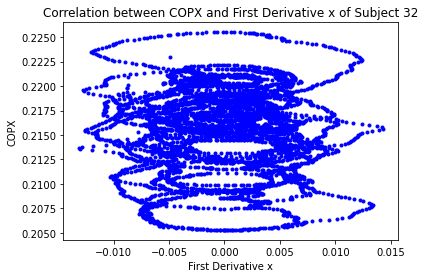

[[ 1.        -0.0133315]
 [-0.0133315  1.       ]]


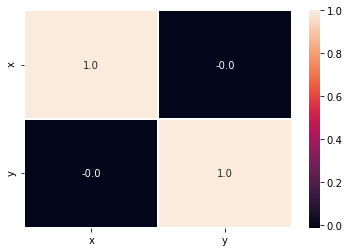

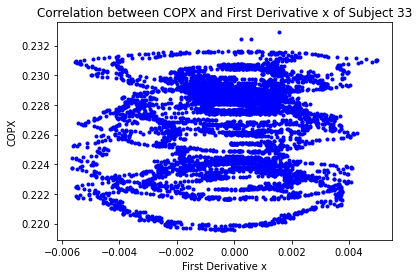

[[1.         0.06570511]
 [0.06570511 1.        ]]


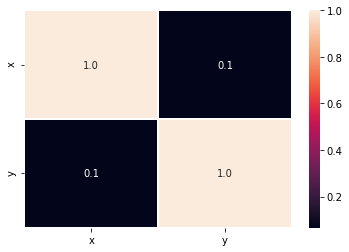

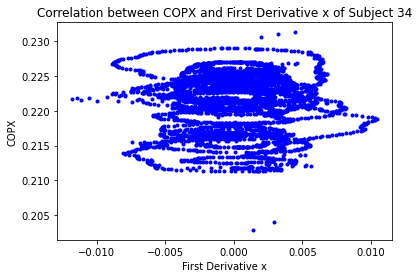

[[ 1.         -0.01604957]
 [-0.01604957  1.        ]]


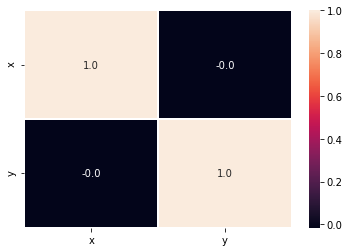

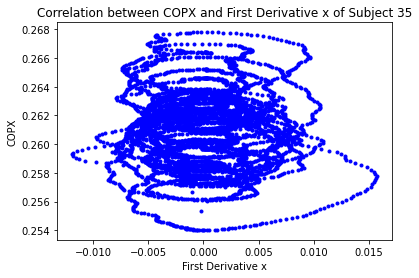

[[ 1.         -0.00942927]
 [-0.00942927  1.        ]]


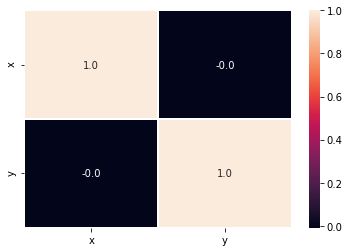

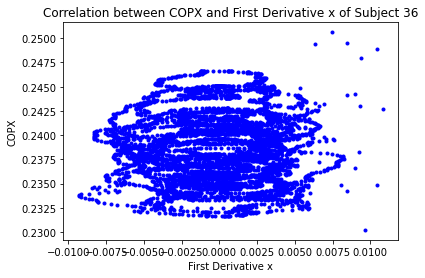

[[1.         0.00109444]
 [0.00109444 1.        ]]


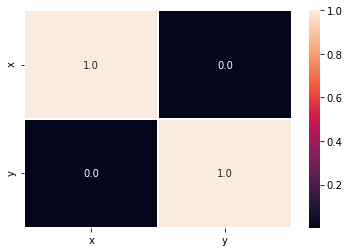

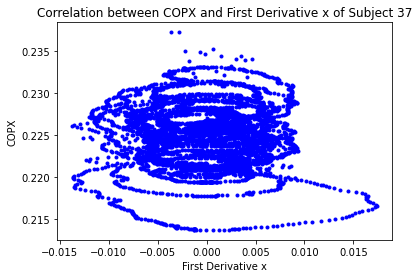

[[ 1.         -0.01429486]
 [-0.01429486  1.        ]]


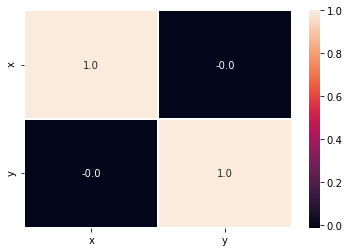

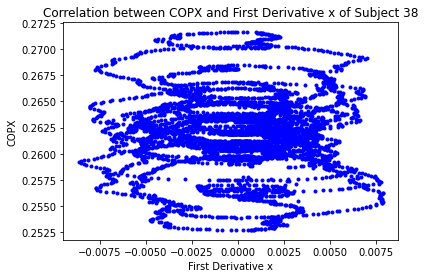

[[1.         0.00287086]
 [0.00287086 1.        ]]


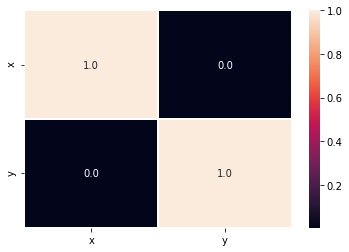

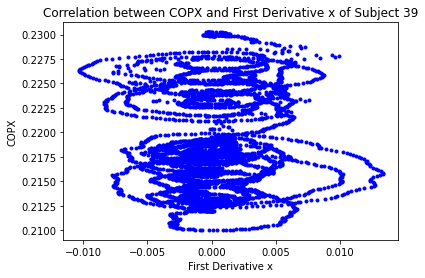

[[1.         0.07537755]
 [0.07537755 1.        ]]


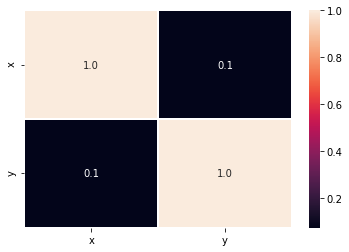

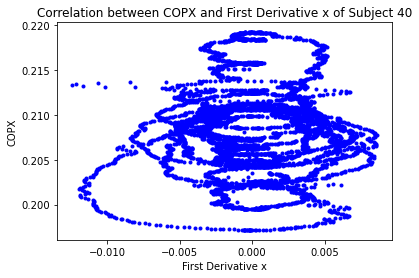

[[1.         0.00748867]
 [0.00748867 1.        ]]


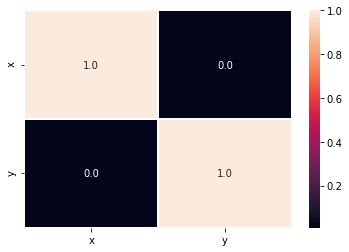

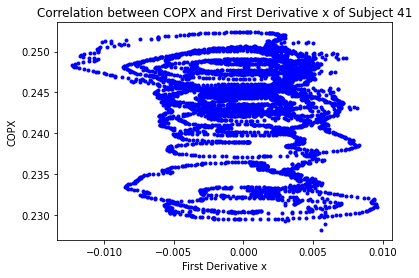

[[ 1.         -0.09311939]
 [-0.09311939  1.        ]]


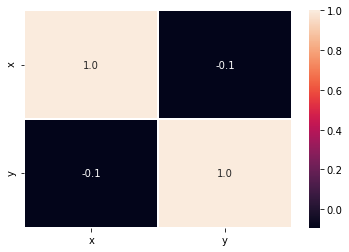

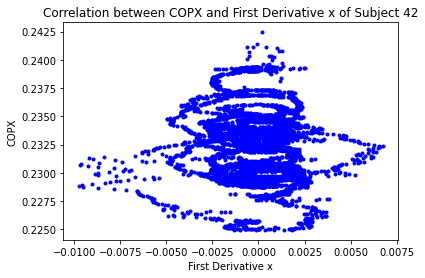

[[ 1.         -0.06686704]
 [-0.06686704  1.        ]]


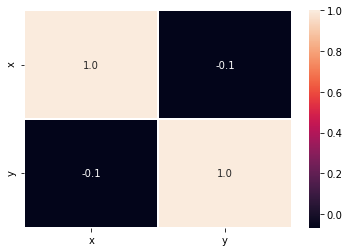

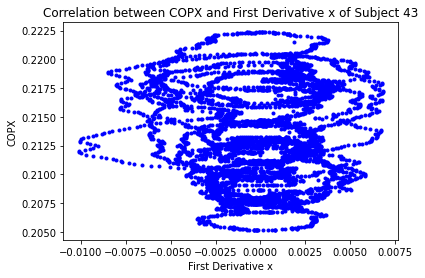

[[ 1.         -0.01120034]
 [-0.01120034  1.        ]]


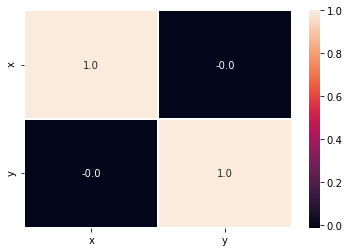

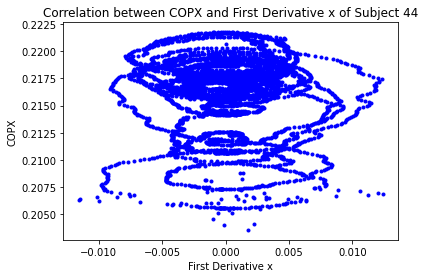

[[ 1.        -0.0271328]
 [-0.0271328  1.       ]]


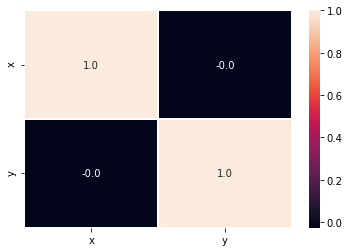

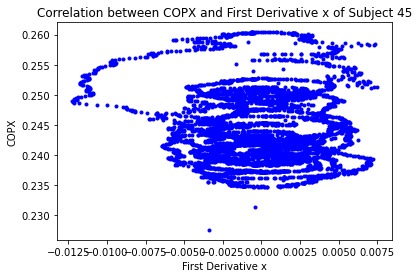

[[ 1.        -0.0191554]
 [-0.0191554  1.       ]]


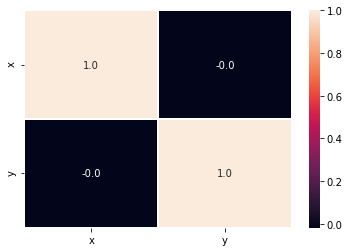

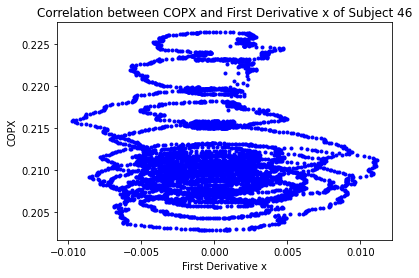

[[ 1.         -0.03279778]
 [-0.03279778  1.        ]]


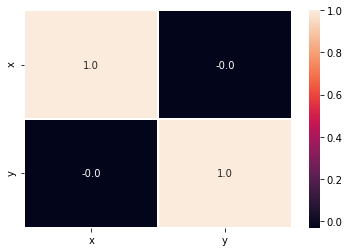

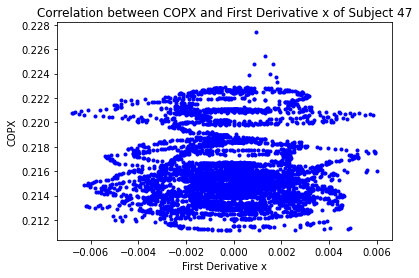

[[ 1.         -0.02607109]
 [-0.02607109  1.        ]]


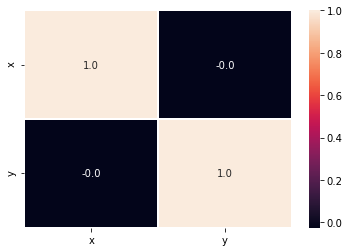

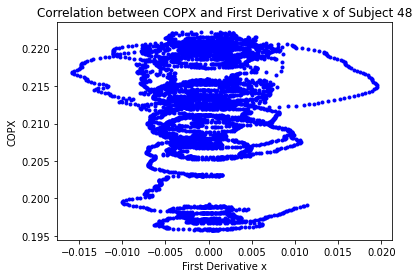

[[1.        0.0486985]
 [0.0486985 1.       ]]


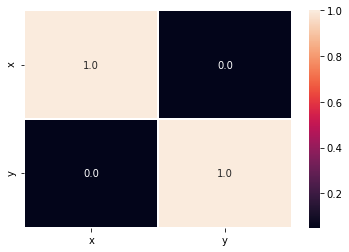

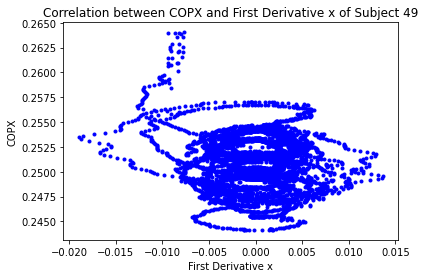

[[ 1.         -0.11912765]
 [-0.11912765  1.        ]]


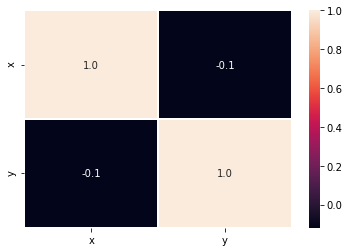

In [37]:
import pandas as pd 
import seaborn as sns
for s in range (1,50):
    a=PDSinfo[PDSinfo['Subject']==s].index.tolist()[2]
    fname_grf = os.path.join(path2, PDSinfo.Trial[a] + 'grf' + '.txt') 
    fname_mkr = os.path.join(path2, PDSinfo.Trial[a] + 'mkr' + '.txt')
    grf = pd.read_csv(fname_grf, delimiter='\t', header=0, engine='c')
    mkr = pd.read_csv(fname_mkr, delimiter='\t', header=0, engine='c')
    COGX=mkr['COG_X']
    COGY=mkr['COG_Y']
    COGZ=mkr['COG_Z']
    d=(COGX**2+COGY**2+COGZ**2)**0.5
    angulox = np.arcsin(COGX/d)
    anguloz= np.arcsin(COGZ/d)
    matrizangx=np.array(angulox[30:])
    matrizangz=np.array(anguloz[30:])
    t=grf['Time']
    dt=t[1]-t[0]
    d1x=np.zeros(len(matrizangx))
    d1z=np.zeros(len(matrizangz))
    for i in range(0, len(matrizangx)-1):
        next=i+1
        d1x[i]=(matrizangx[next]-matrizangx[i])/dt
        d1z[i]=(matrizangz[next]-matrizangz[i])/dt
    d2x=np.zeros(len(d1x))
    d2z=np.zeros(len(d1z))
    for i in range(0, 30):
        next=i+1
        d2x[i]=(d1x[next]-d1x[i])/dt
        d2z[i]=(d1z[next]-d1z[i])/dt
    COPX=COGX[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2x
    COPZ=COGZ[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2z
    COPXreal=grf['COPNET_X']
    COPZreal=grf['COPNET_Z']
    COPXmatrix=np.array(COPX)
    COPXrealmatrix=np.array(COPXreal[30:])
    COPZmatrix=np.array(COPZ)
    COPZrealmatrix=np.array(COPZreal[30:])
    errorx=np.subtract(COPXmatrix,COPXrealmatrix)
    errorz=np.subtract(COPZmatrix,COPZrealmatrix)
    data={'x':d1x,
         'y': COPXmatrix
         }
    df=pd.DataFrame(data)
    plt.plot('x','y','bo',data= df, marker='.')
    plt.xlabel("First Derivative x")
    plt.ylabel("COPX")
    plt.title("Correlation between COPX and First Derivative x of Subject {}".format(s))
    plt.show()
    r=np.corrcoef(d1x,COPXmatrix)
    print(r)
    plt.figure()
    data={'x':d1x,
          'y': COPXmatrix
         }
    df=pd.DataFrame(data)
    correlation=df.corr()
    plot=sns.heatmap(correlation,annot= True, fmt='.1f',linewidths=.6)
    plt.show()

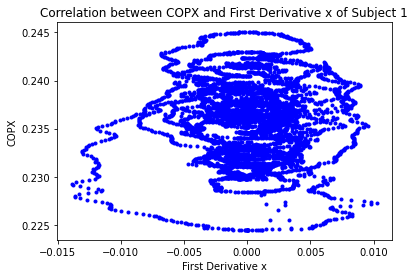

[[1.         0.00575093]
 [0.00575093 1.        ]]


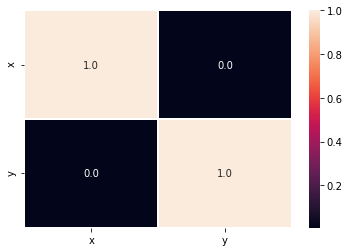

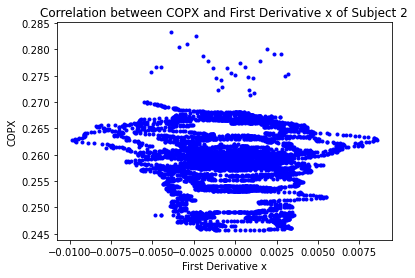

[[ 1.         -0.06019288]
 [-0.06019288  1.        ]]


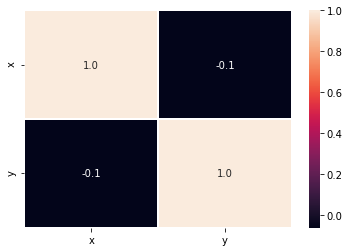

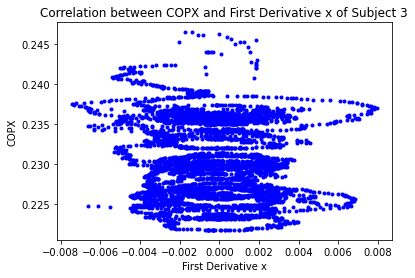

[[ 1.         -0.08316466]
 [-0.08316466  1.        ]]


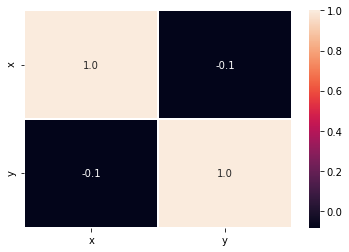

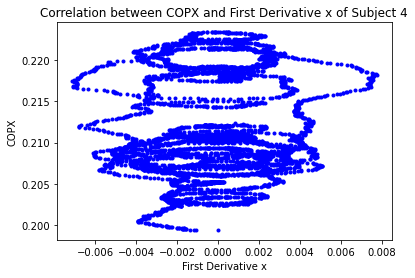

[[1.         0.07482018]
 [0.07482018 1.        ]]


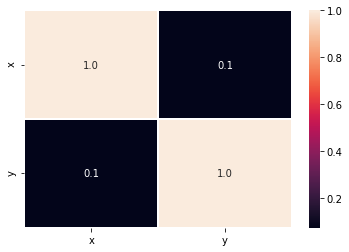

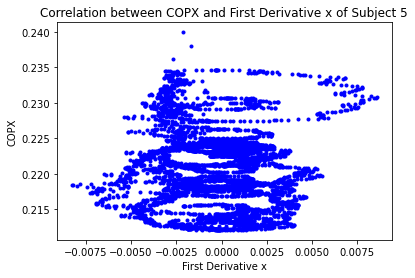

[[ 1.         -0.03315114]
 [-0.03315114  1.        ]]


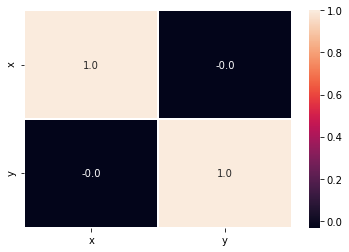

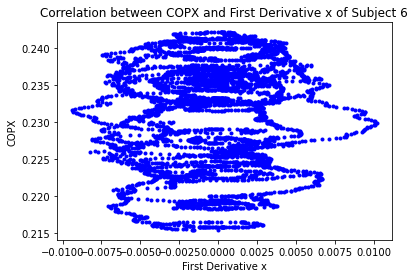

[[1.         0.07577445]
 [0.07577445 1.        ]]


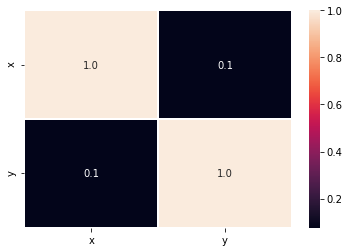

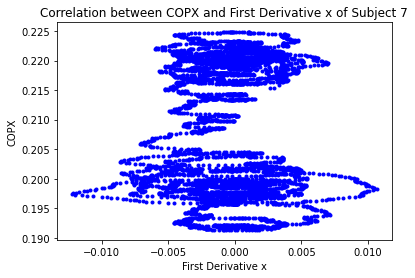

[[1.         0.02168919]
 [0.02168919 1.        ]]


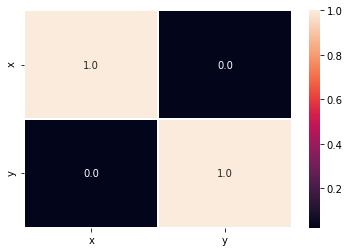

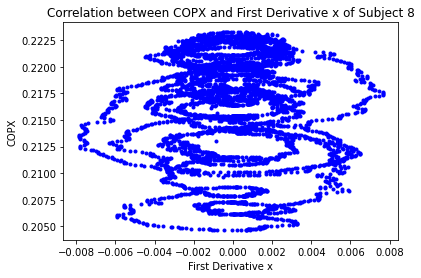

[[ 1.00000000e+00 -3.20139785e-04]
 [-3.20139785e-04  1.00000000e+00]]


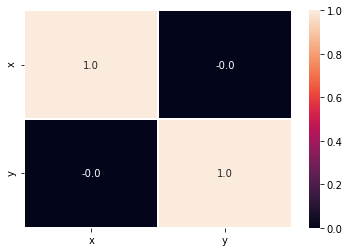

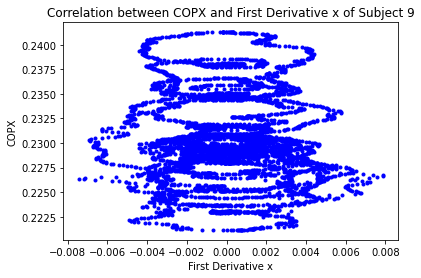

[[ 1.         -0.03105646]
 [-0.03105646  1.        ]]


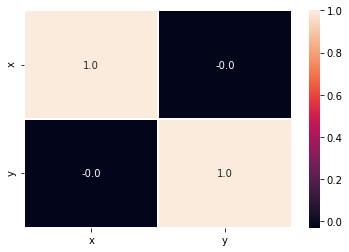

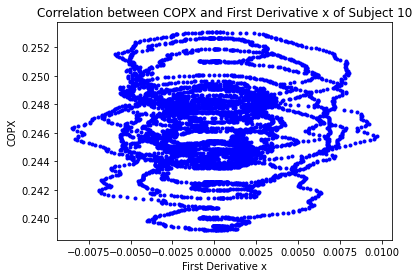

[[ 1.         -0.00408307]
 [-0.00408307  1.        ]]


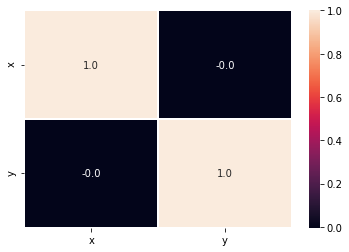

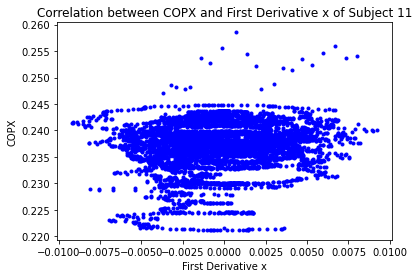

[[1.         0.13531246]
 [0.13531246 1.        ]]


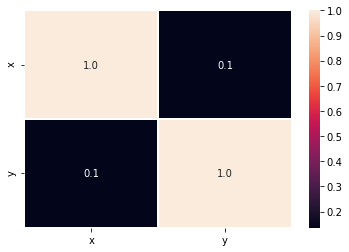

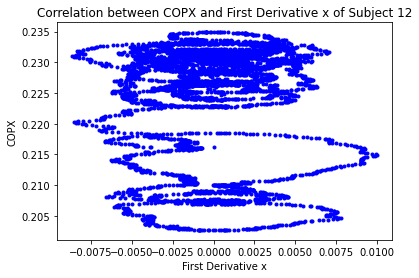

[[1.         0.02202994]
 [0.02202994 1.        ]]


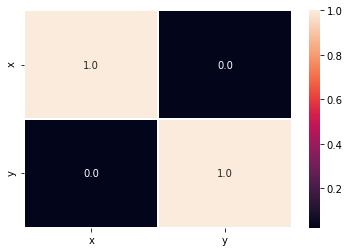

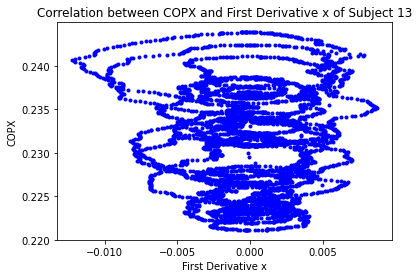

[[ 1.         -0.00467689]
 [-0.00467689  1.        ]]


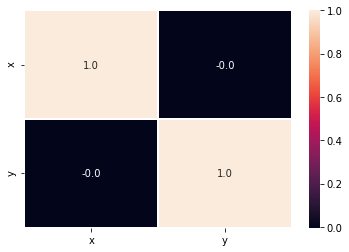

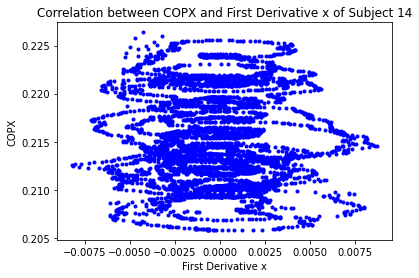

[[ 1.        -0.0290085]
 [-0.0290085  1.       ]]


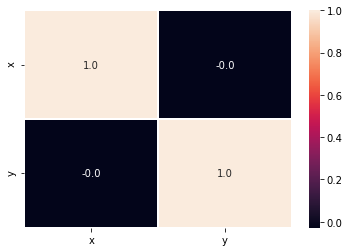

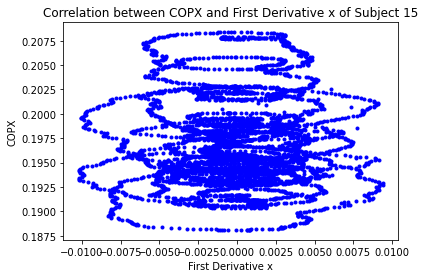

[[1.         0.01856805]
 [0.01856805 1.        ]]


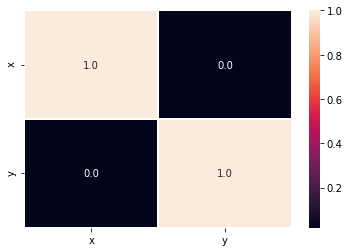

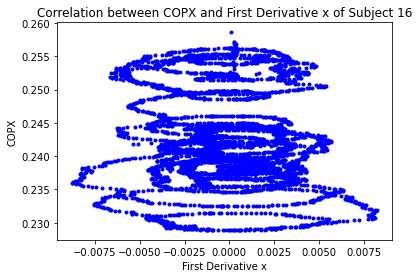

[[ 1.         -0.07297306]
 [-0.07297306  1.        ]]


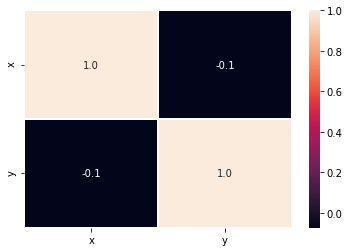

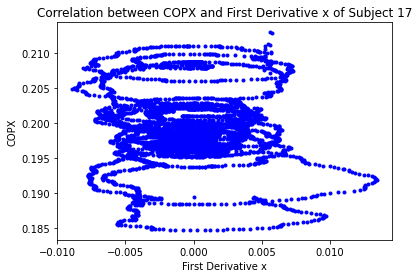

[[ 1.         -0.00172107]
 [-0.00172107  1.        ]]


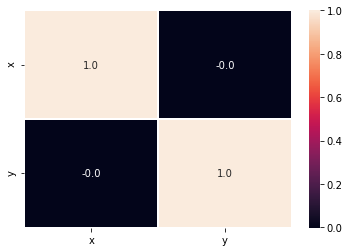

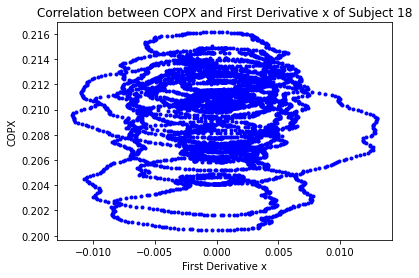

[[ 1.         -0.00780975]
 [-0.00780975  1.        ]]


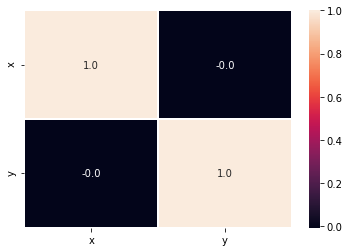

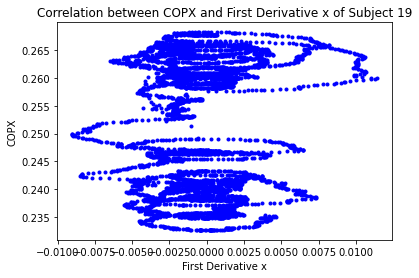

[[1.         0.05429743]
 [0.05429743 1.        ]]


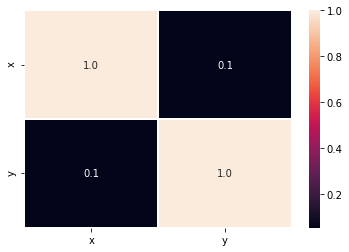

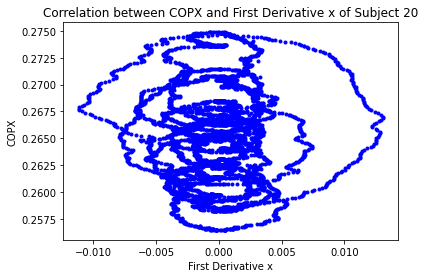

[[ 1.00000000e+00 -5.01605289e-04]
 [-5.01605289e-04  1.00000000e+00]]


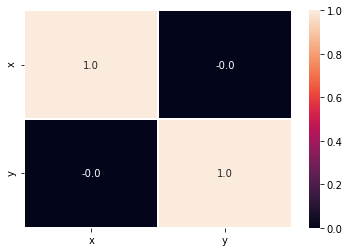

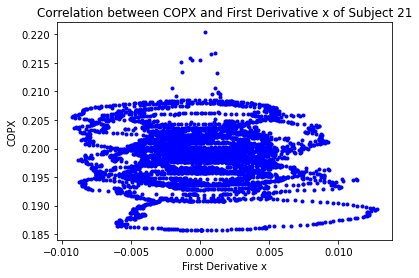

[[ 1.         -0.03431993]
 [-0.03431993  1.        ]]


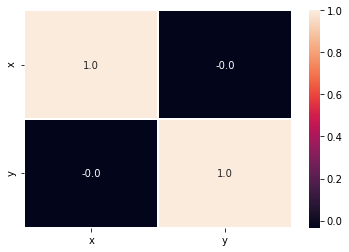

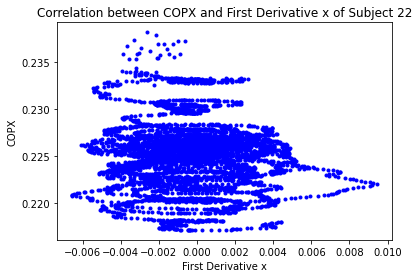

[[ 1.         -0.05157239]
 [-0.05157239  1.        ]]


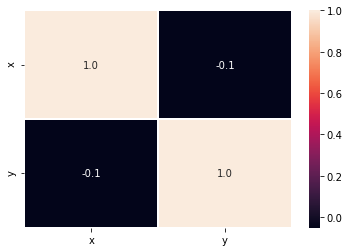

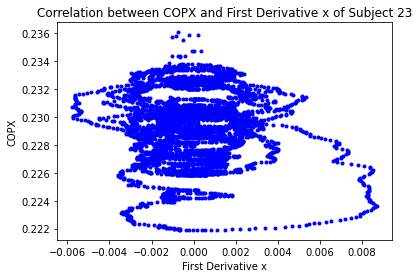

[[ 1.         -0.02626279]
 [-0.02626279  1.        ]]


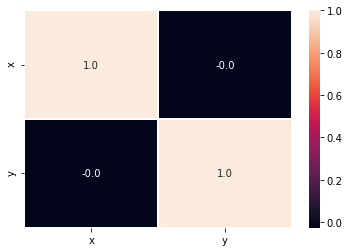

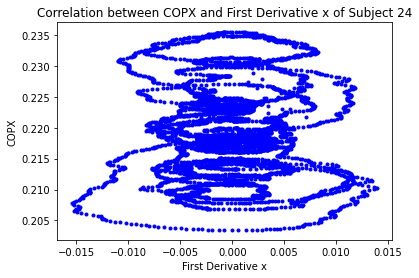

[[1.         0.00393995]
 [0.00393995 1.        ]]


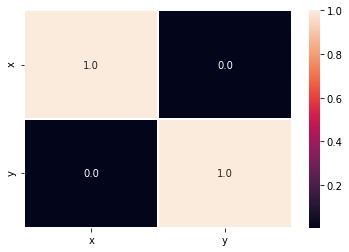

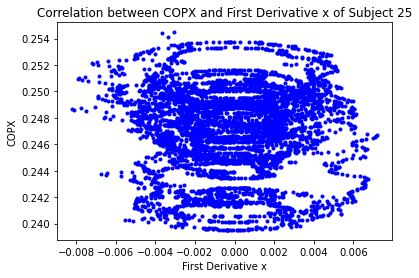

[[1.         0.01869223]
 [0.01869223 1.        ]]


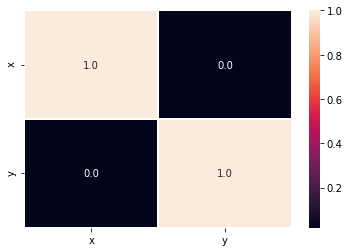

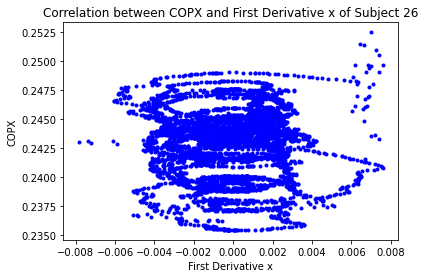

[[ 1.00000000e+00 -1.58384185e-04]
 [-1.58384185e-04  1.00000000e+00]]


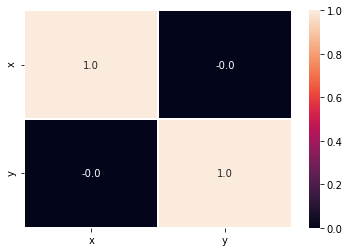

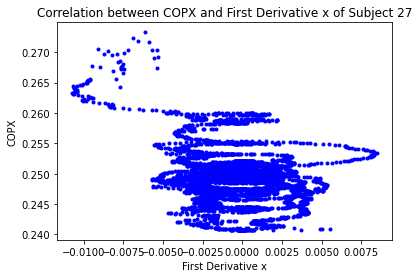

[[ 1.         -0.28177952]
 [-0.28177952  1.        ]]


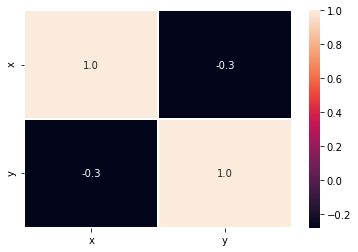

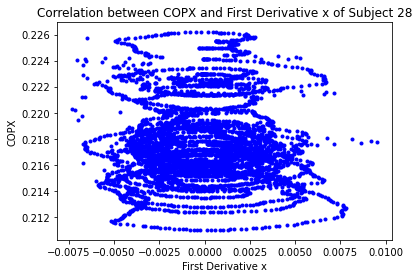

[[ 1.         -0.02676037]
 [-0.02676037  1.        ]]


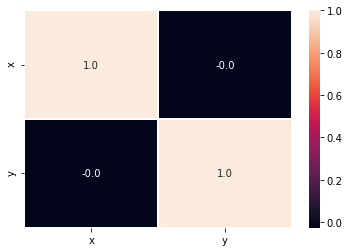

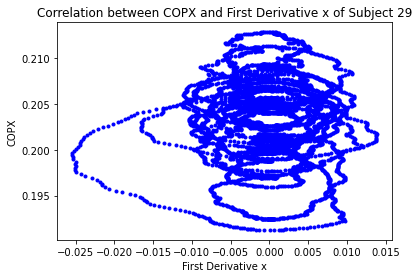

[[ 1.         -0.01642008]
 [-0.01642008  1.        ]]


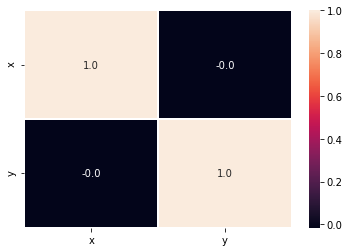

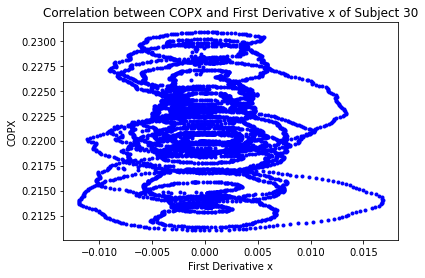

[[ 1.        -0.0309042]
 [-0.0309042  1.       ]]


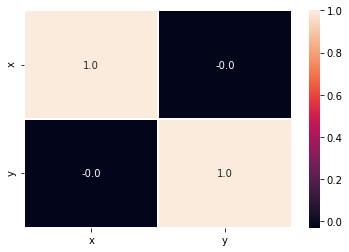

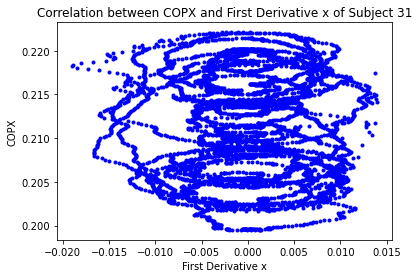

[[ 1.         -0.00661204]
 [-0.00661204  1.        ]]


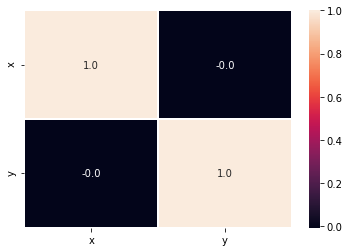

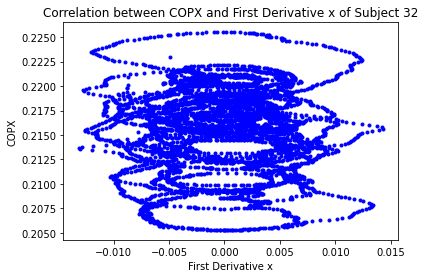

[[ 1.        -0.0133315]
 [-0.0133315  1.       ]]


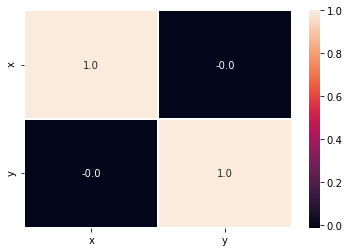

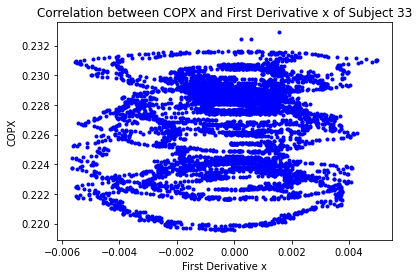

[[1.         0.06570511]
 [0.06570511 1.        ]]


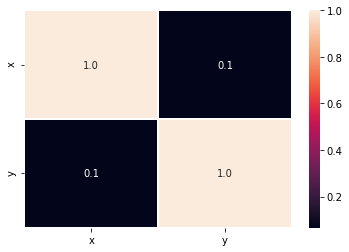

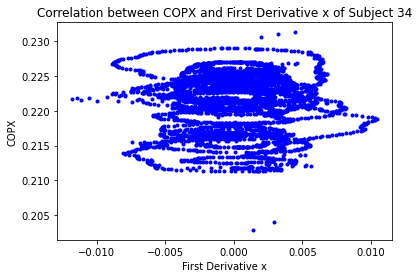

[[ 1.         -0.01604957]
 [-0.01604957  1.        ]]


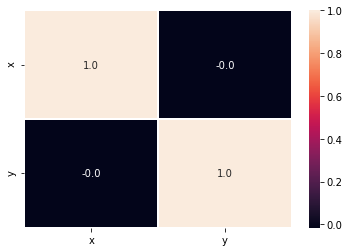

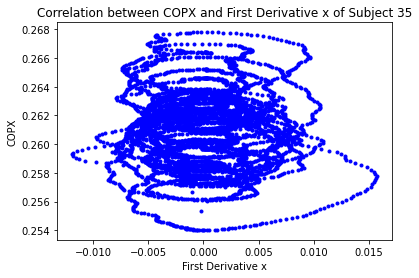

[[ 1.         -0.00942927]
 [-0.00942927  1.        ]]


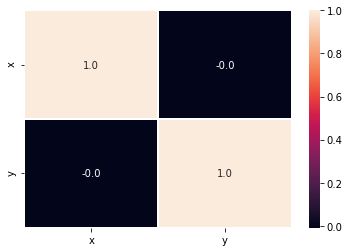

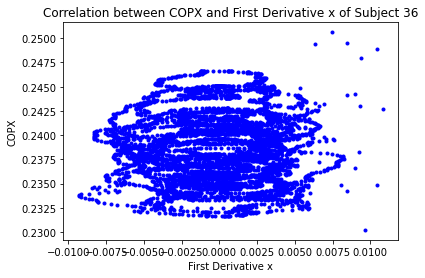

[[1.         0.00109444]
 [0.00109444 1.        ]]


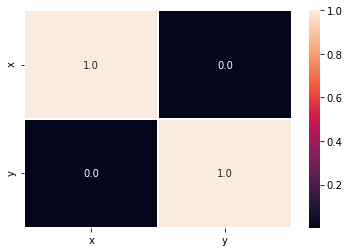

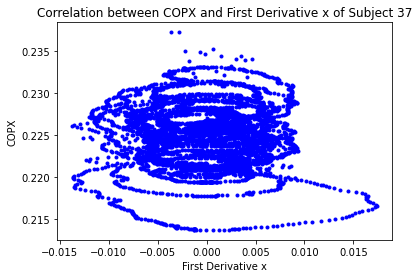

[[ 1.         -0.01429486]
 [-0.01429486  1.        ]]


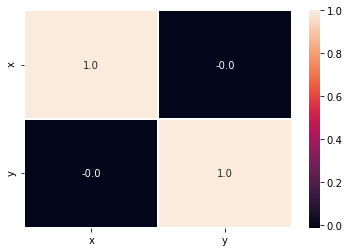

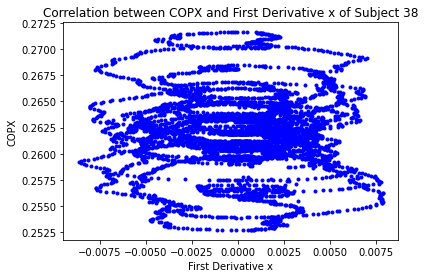

[[1.         0.00287086]
 [0.00287086 1.        ]]


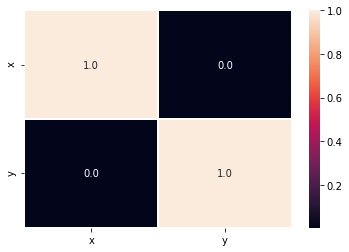

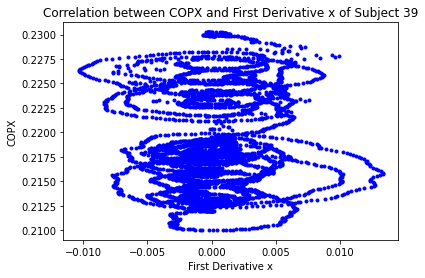

[[1.         0.07537755]
 [0.07537755 1.        ]]


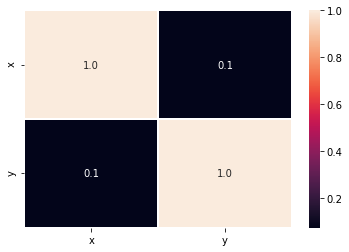

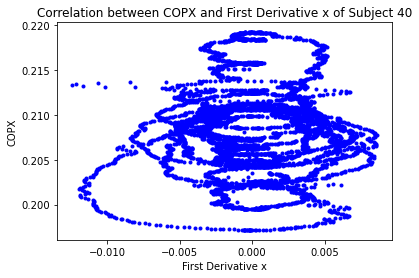

[[1.         0.00748867]
 [0.00748867 1.        ]]


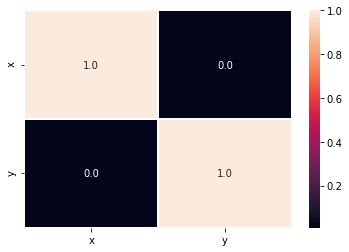

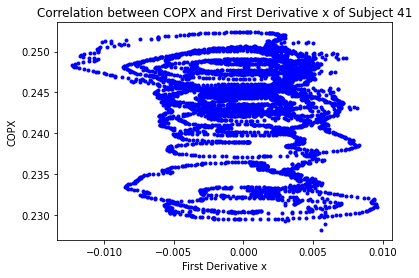

[[ 1.         -0.09311939]
 [-0.09311939  1.        ]]


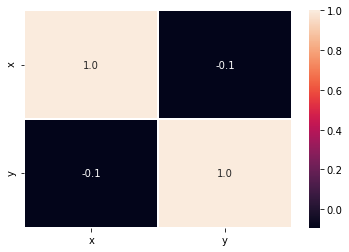

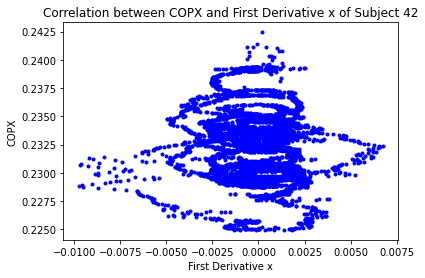

[[ 1.         -0.06686704]
 [-0.06686704  1.        ]]


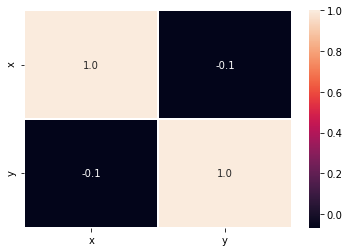

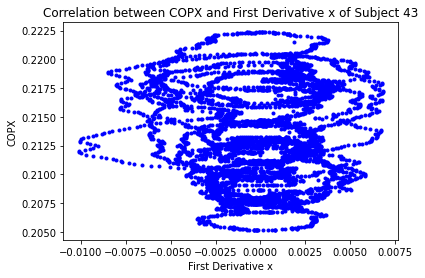

[[ 1.         -0.01120034]
 [-0.01120034  1.        ]]


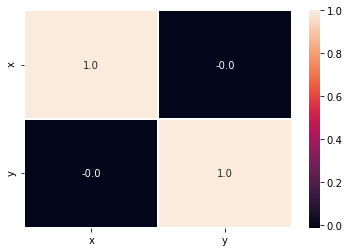

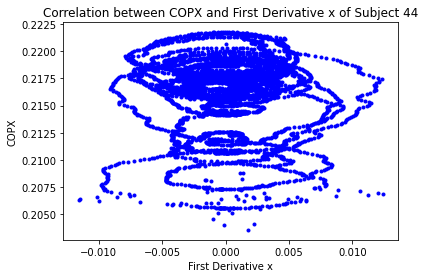

[[ 1.        -0.0271328]
 [-0.0271328  1.       ]]


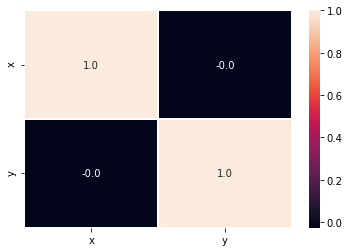

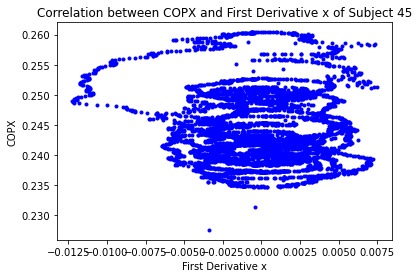

[[ 1.        -0.0191554]
 [-0.0191554  1.       ]]


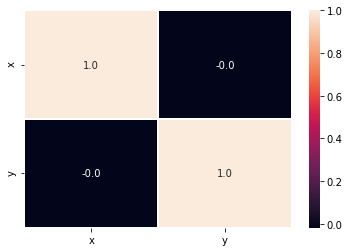

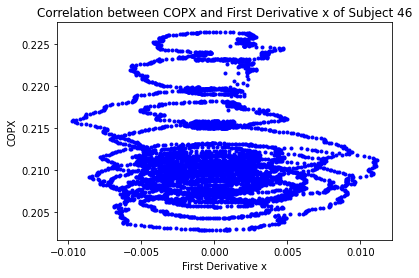

[[ 1.         -0.03279778]
 [-0.03279778  1.        ]]


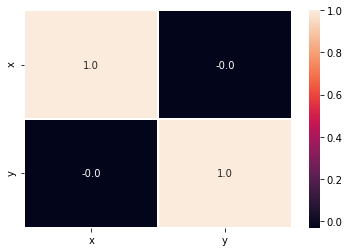

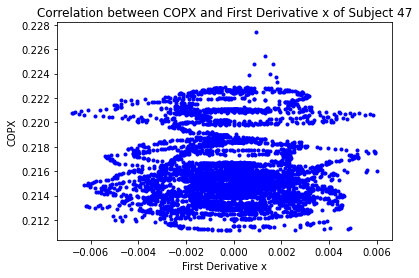

[[ 1.         -0.02607109]
 [-0.02607109  1.        ]]


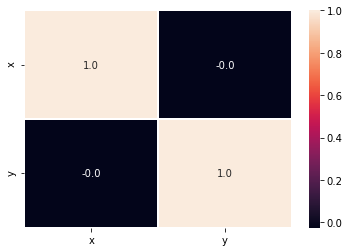

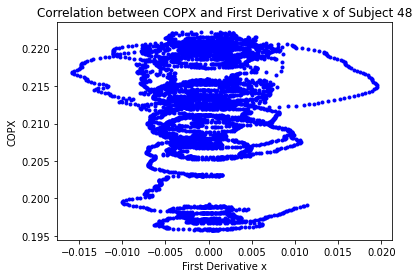

[[1.        0.0486985]
 [0.0486985 1.       ]]


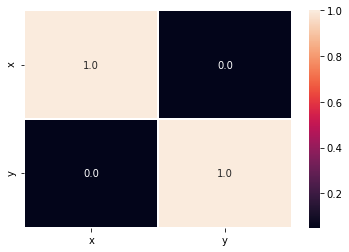

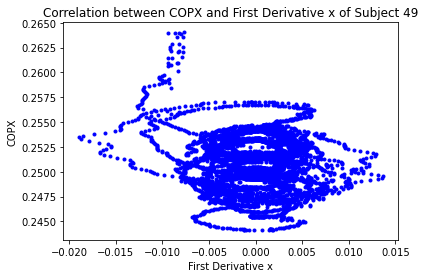

[[ 1.         -0.11912765]
 [-0.11912765  1.        ]]


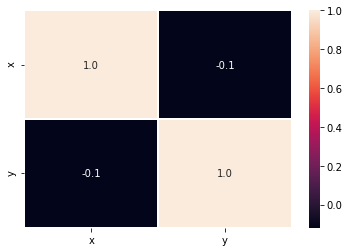

In [37]:
import pandas as pd 
import seaborn as sns
for s in range (1,50):
    a=PDSinfo[PDSinfo['Subject']==s].index.tolist()[2]
    fname_grf = os.path.join(path2, PDSinfo.Trial[a] + 'grf' + '.txt') 
    fname_mkr = os.path.join(path2, PDSinfo.Trial[a] + 'mkr' + '.txt')
    grf = pd.read_csv(fname_grf, delimiter='\t', header=0, engine='c')
    mkr = pd.read_csv(fname_mkr, delimiter='\t', header=0, engine='c')
    COGX=mkr['COG_X']
    COGY=mkr['COG_Y']
    COGZ=mkr['COG_Z']
    d=(COGX**2+COGY**2+COGZ**2)**0.5
    angulox = np.arcsin(COGX/d)
    anguloz= np.arcsin(COGZ/d)
    matrizangx=np.array(angulox[30:])
    matrizangz=np.array(anguloz[30:])
    t=grf['Time']
    dt=t[1]-t[0]
    d1x=np.zeros(len(matrizangx))
    d1z=np.zeros(len(matrizangz))
    for i in range(0, len(matrizangx)-1):
        next=i+1
        d1x[i]=(matrizangx[next]-matrizangx[i])/dt
        d1z[i]=(matrizangz[next]-matrizangz[i])/dt
    d2x=np.zeros(len(d1x))
    d2z=np.zeros(len(d1z))
    for i in range(0, 30):
        next=i+1
        d2x[i]=(d1x[next]-d1x[i])/dt
        d2z[i]=(d1z[next]-d1z[i])/dt
    COPX=COGX[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2x
    COPZ=COGZ[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2z
    COPXreal=grf['COPNET_X']
    COPZreal=grf['COPNET_Z']
    COPXmatrix=np.array(COPX)
    COPXrealmatrix=np.array(COPXreal[30:])
    COPZmatrix=np.array(COPZ)
    COPZrealmatrix=np.array(COPZreal[30:])
    errorx=np.subtract(COPXmatrix,COPXrealmatrix)
    errorz=np.subtract(COPZmatrix,COPZrealmatrix)
    data={'x':d1x,
         'y': COPXmatrix
         }
    df=pd.DataFrame(data)
    plt.plot('x','y','bo',data= df, marker='.')
    plt.xlabel("First Derivative x")
    plt.ylabel("COPX")
    plt.title("Correlation between COPX and First Derivative x of Subject {}".format(s))
    plt.show()
    r=np.corrcoef(d1x,COPXmatrix)
    print(r)
    plt.figure()
    data={'x':d1x,
          'y': COPXmatrix
         }
    df=pd.DataFrame(data)
    correlation=df.corr()
    plot=sns.heatmap(correlation,annot= True, fmt='.1f',linewidths=.6)
    plt.show()

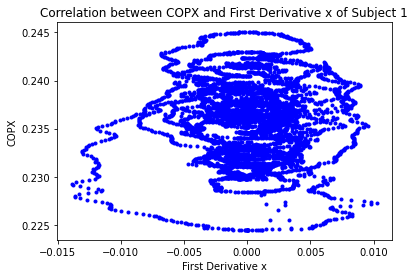

[[1.         0.00575093]
 [0.00575093 1.        ]]


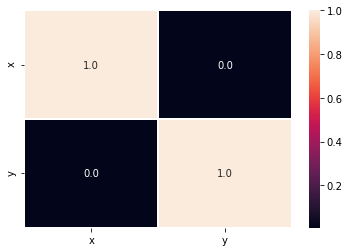

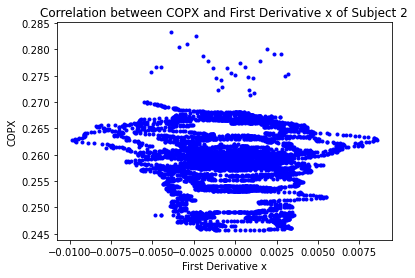

[[ 1.         -0.06019288]
 [-0.06019288  1.        ]]


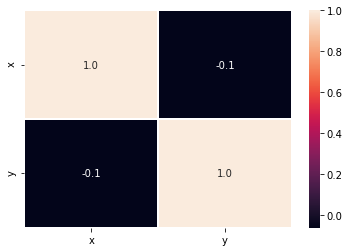

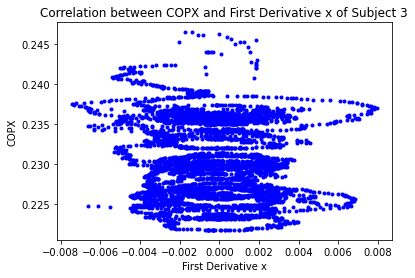

[[ 1.         -0.08316466]
 [-0.08316466  1.        ]]


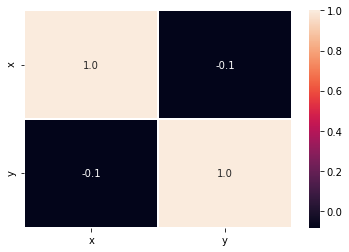

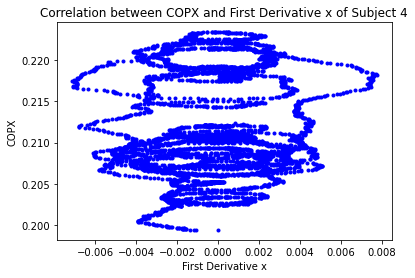

[[1.         0.07482018]
 [0.07482018 1.        ]]


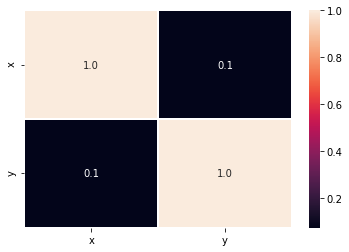

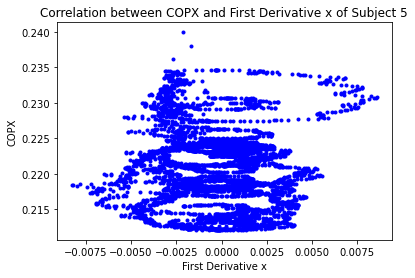

[[ 1.         -0.03315114]
 [-0.03315114  1.        ]]


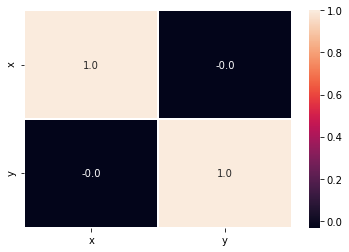

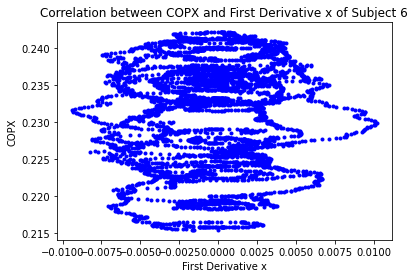

[[1.         0.07577445]
 [0.07577445 1.        ]]


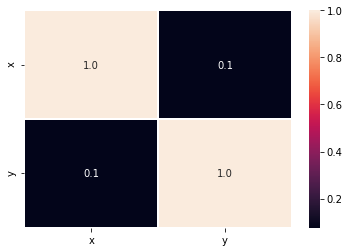

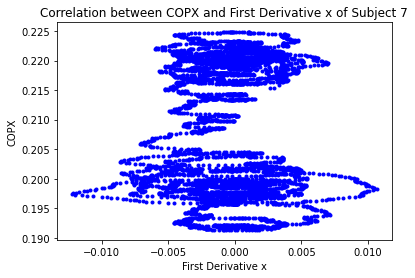

[[1.         0.02168919]
 [0.02168919 1.        ]]


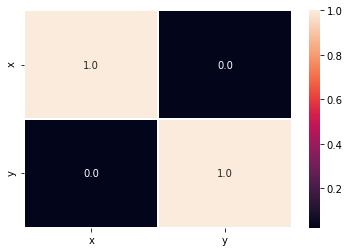

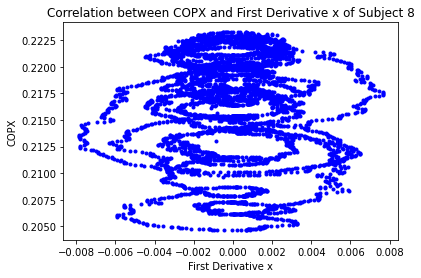

[[ 1.00000000e+00 -3.20139785e-04]
 [-3.20139785e-04  1.00000000e+00]]


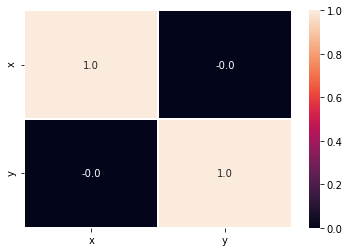

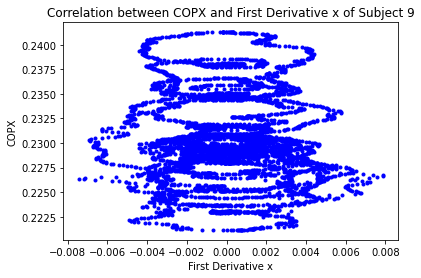

[[ 1.         -0.03105646]
 [-0.03105646  1.        ]]


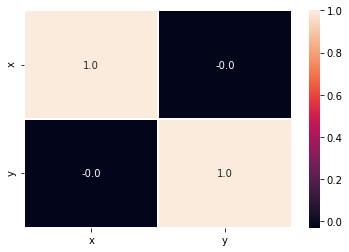

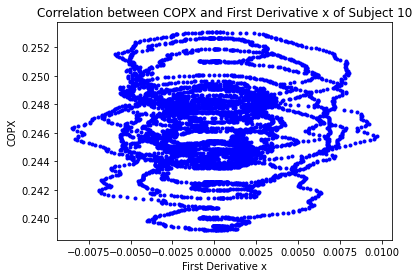

[[ 1.         -0.00408307]
 [-0.00408307  1.        ]]


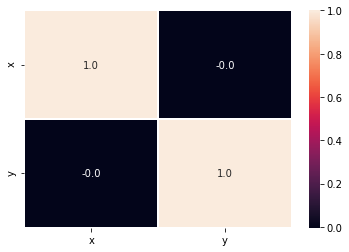

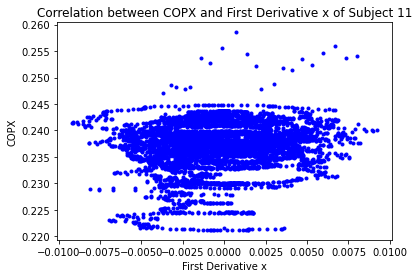

[[1.         0.13531246]
 [0.13531246 1.        ]]


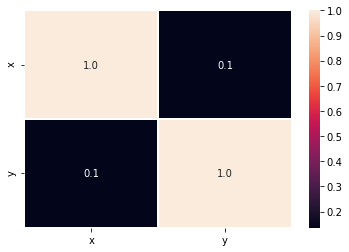

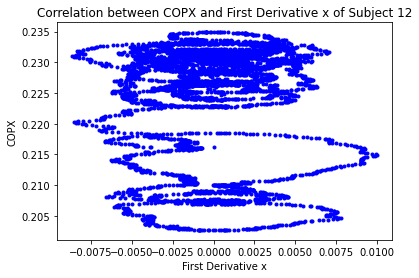

[[1.         0.02202994]
 [0.02202994 1.        ]]


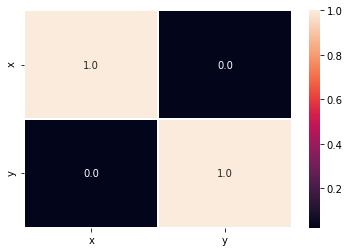

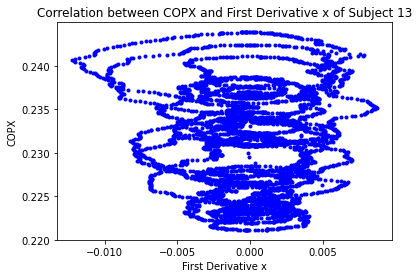

[[ 1.         -0.00467689]
 [-0.00467689  1.        ]]


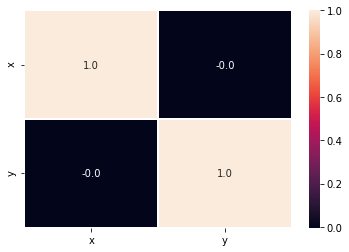

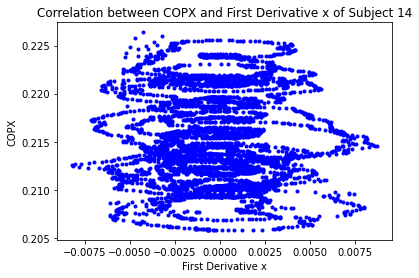

[[ 1.        -0.0290085]
 [-0.0290085  1.       ]]


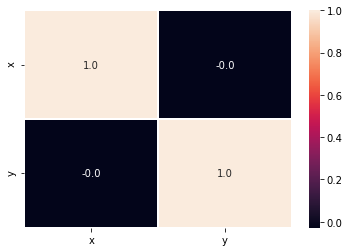

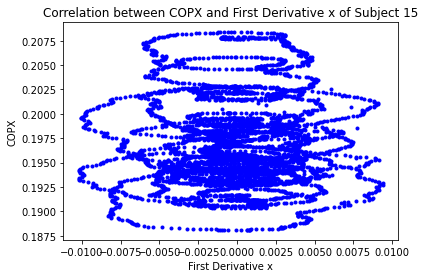

[[1.         0.01856805]
 [0.01856805 1.        ]]


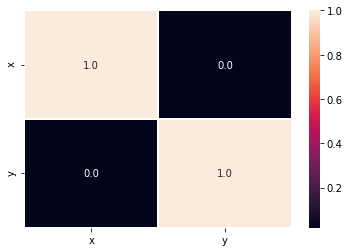

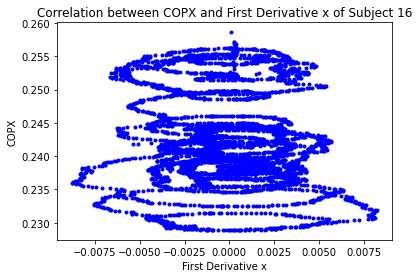

[[ 1.         -0.07297306]
 [-0.07297306  1.        ]]


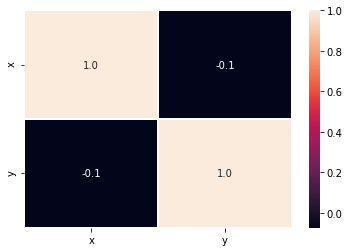

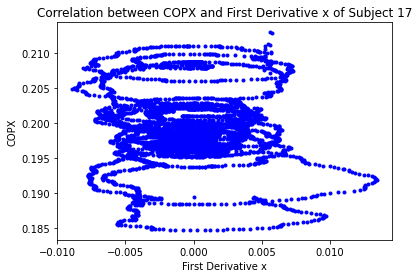

[[ 1.         -0.00172107]
 [-0.00172107  1.        ]]


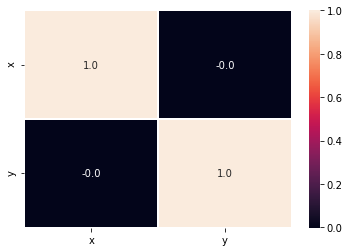

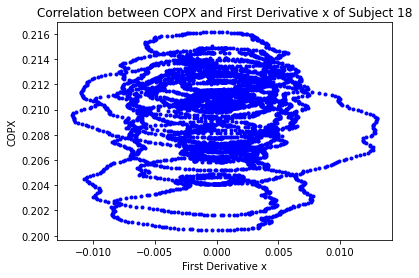

[[ 1.         -0.00780975]
 [-0.00780975  1.        ]]


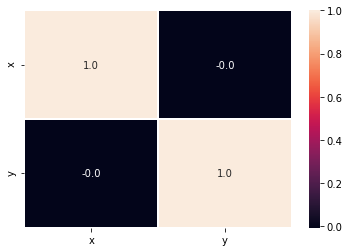

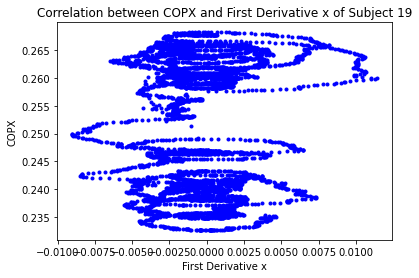

[[1.         0.05429743]
 [0.05429743 1.        ]]


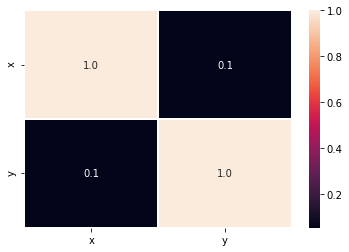

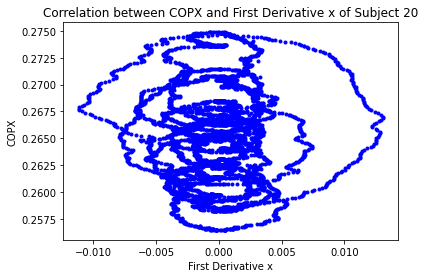

[[ 1.00000000e+00 -5.01605289e-04]
 [-5.01605289e-04  1.00000000e+00]]


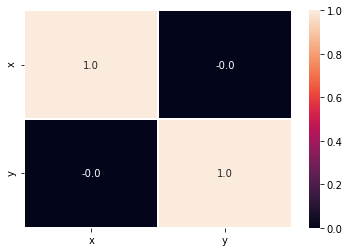

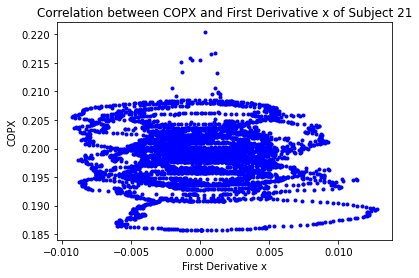

[[ 1.         -0.03431993]
 [-0.03431993  1.        ]]


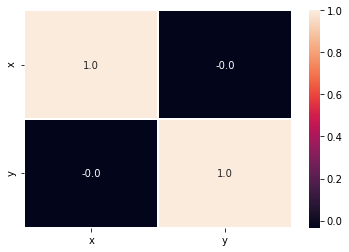

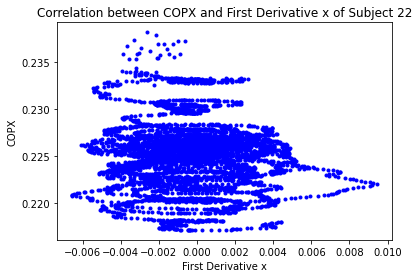

[[ 1.         -0.05157239]
 [-0.05157239  1.        ]]


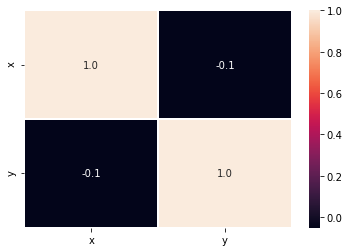

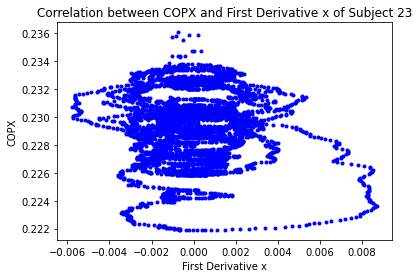

[[ 1.         -0.02626279]
 [-0.02626279  1.        ]]


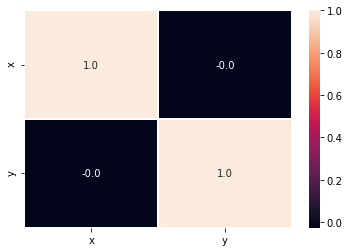

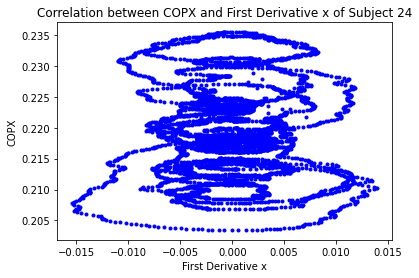

[[1.         0.00393995]
 [0.00393995 1.        ]]


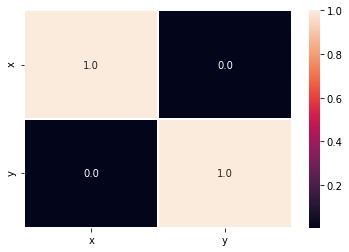

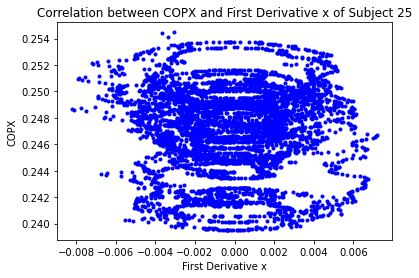

[[1.         0.01869223]
 [0.01869223 1.        ]]


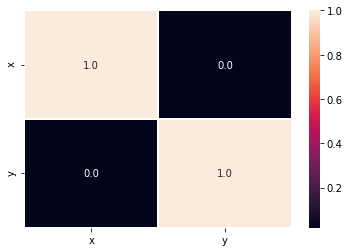

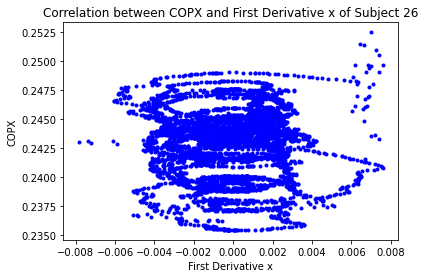

[[ 1.00000000e+00 -1.58384185e-04]
 [-1.58384185e-04  1.00000000e+00]]


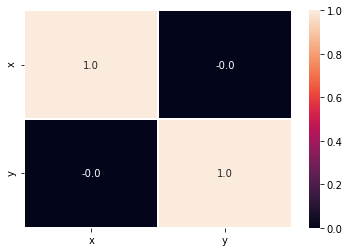

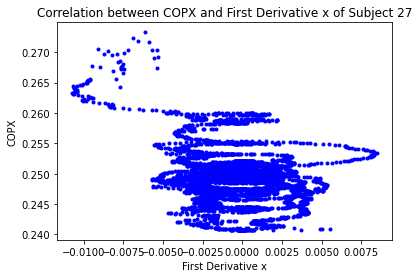

[[ 1.         -0.28177952]
 [-0.28177952  1.        ]]


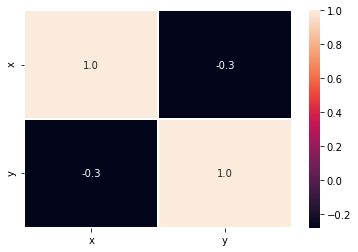

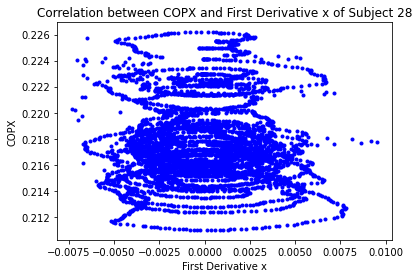

[[ 1.         -0.02676037]
 [-0.02676037  1.        ]]


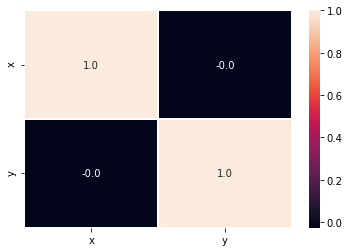

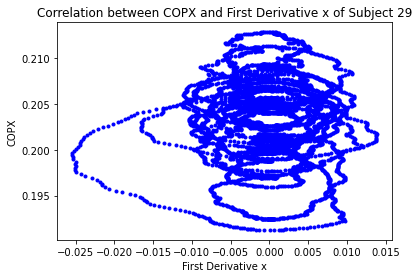

[[ 1.         -0.01642008]
 [-0.01642008  1.        ]]


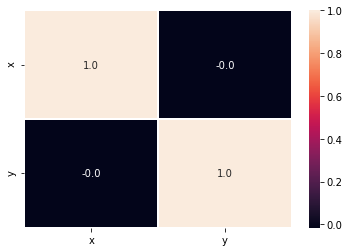

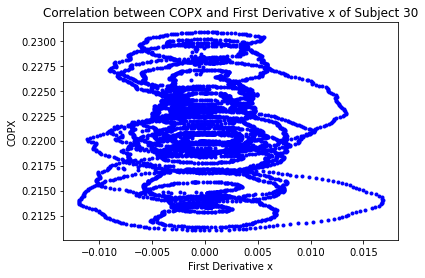

[[ 1.        -0.0309042]
 [-0.0309042  1.       ]]


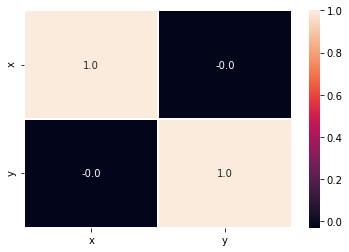

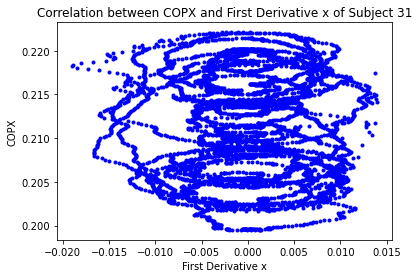

[[ 1.         -0.00661204]
 [-0.00661204  1.        ]]


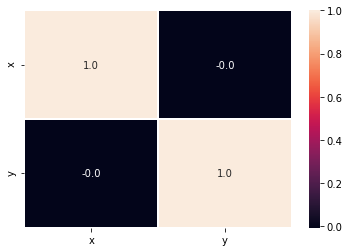

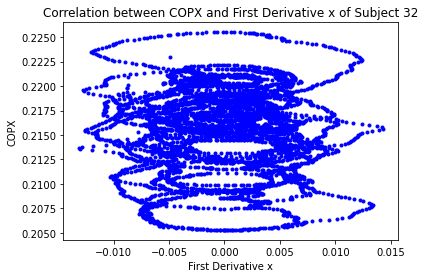

[[ 1.        -0.0133315]
 [-0.0133315  1.       ]]


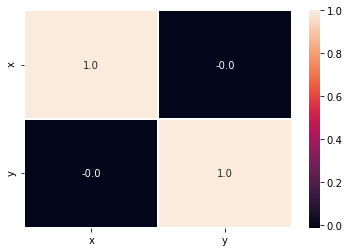

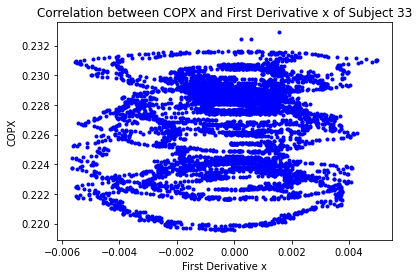

[[1.         0.06570511]
 [0.06570511 1.        ]]


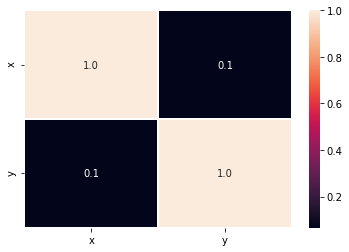

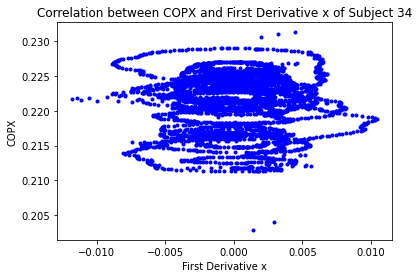

[[ 1.         -0.01604957]
 [-0.01604957  1.        ]]


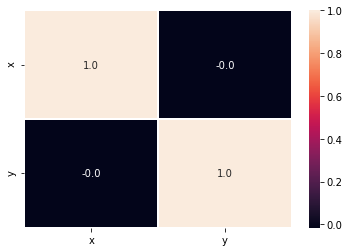

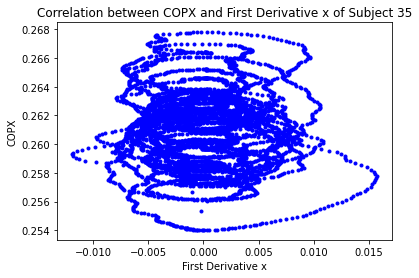

[[ 1.         -0.00942927]
 [-0.00942927  1.        ]]


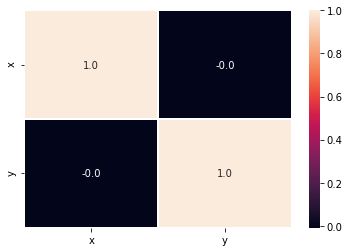

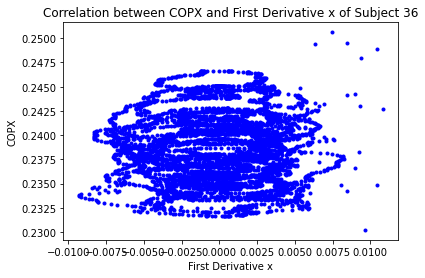

[[1.         0.00109444]
 [0.00109444 1.        ]]


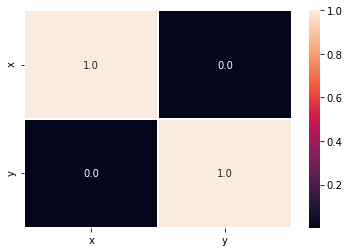

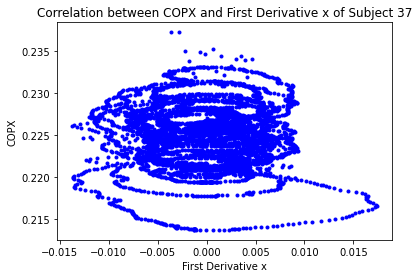

[[ 1.         -0.01429486]
 [-0.01429486  1.        ]]


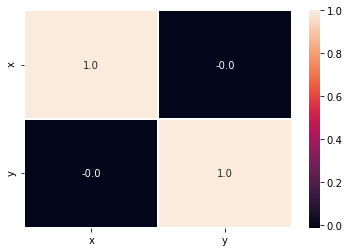

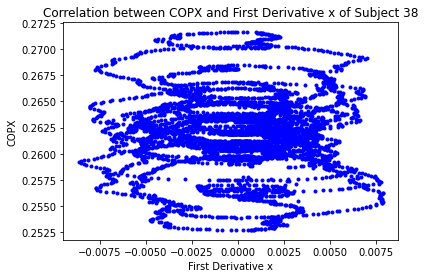

[[1.         0.00287086]
 [0.00287086 1.        ]]


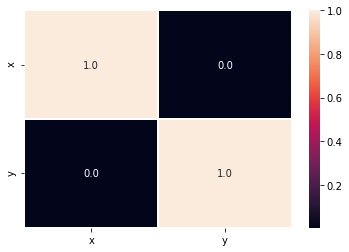

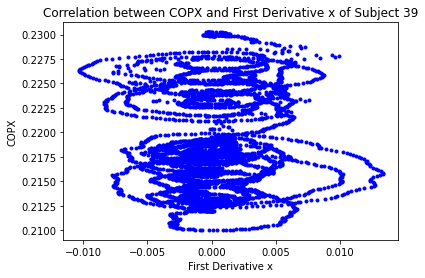

[[1.         0.07537755]
 [0.07537755 1.        ]]


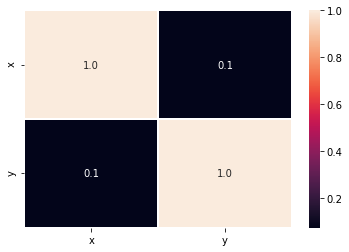

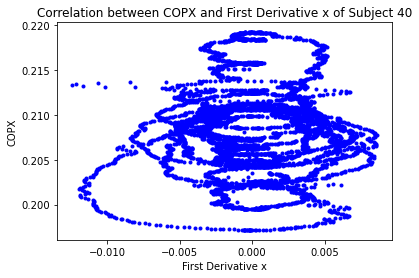

[[1.         0.00748867]
 [0.00748867 1.        ]]


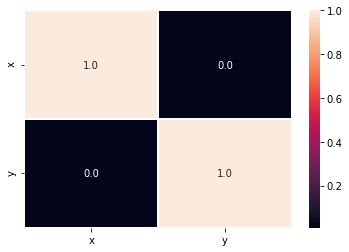

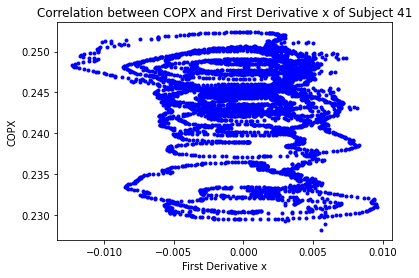

[[ 1.         -0.09311939]
 [-0.09311939  1.        ]]


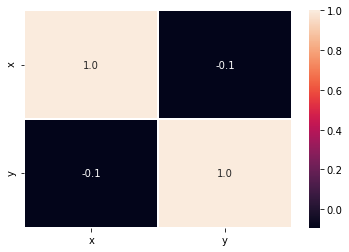

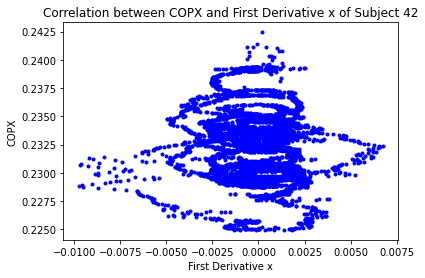

[[ 1.         -0.06686704]
 [-0.06686704  1.        ]]


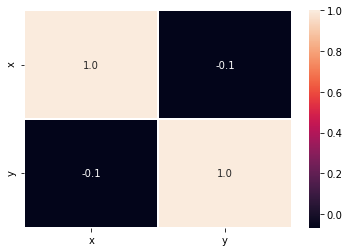

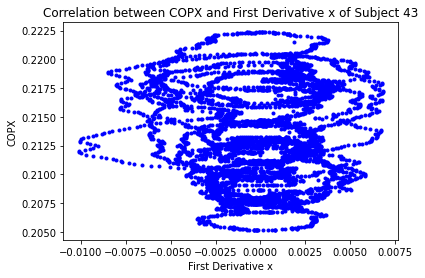

[[ 1.         -0.01120034]
 [-0.01120034  1.        ]]


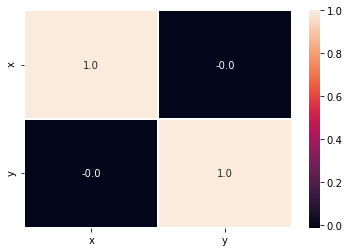

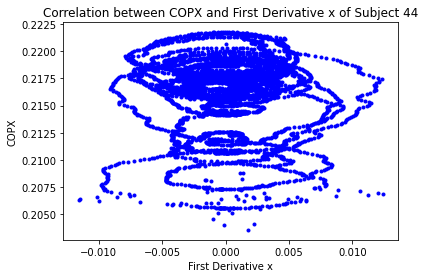

[[ 1.        -0.0271328]
 [-0.0271328  1.       ]]


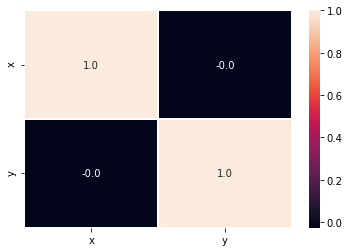

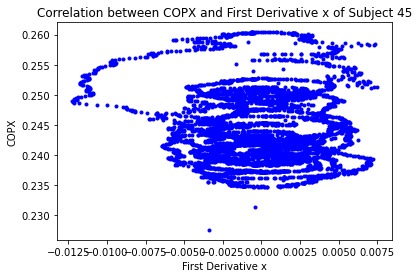

[[ 1.        -0.0191554]
 [-0.0191554  1.       ]]


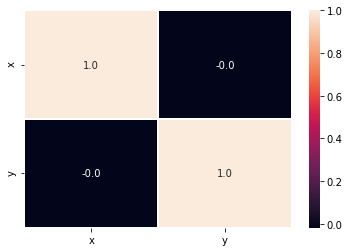

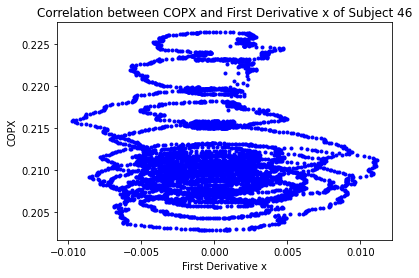

[[ 1.         -0.03279778]
 [-0.03279778  1.        ]]


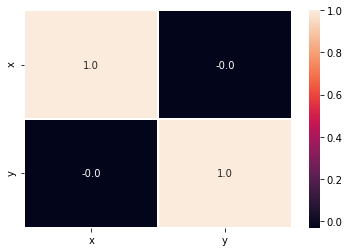

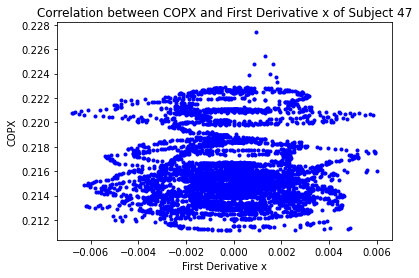

[[ 1.         -0.02607109]
 [-0.02607109  1.        ]]


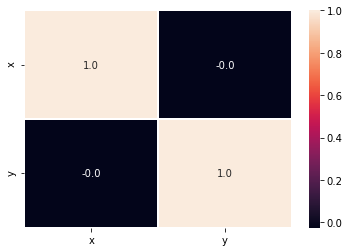

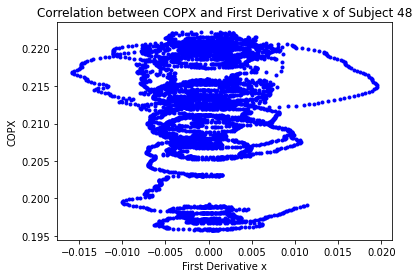

[[1.        0.0486985]
 [0.0486985 1.       ]]


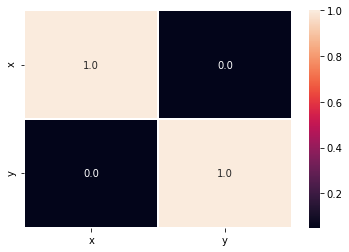

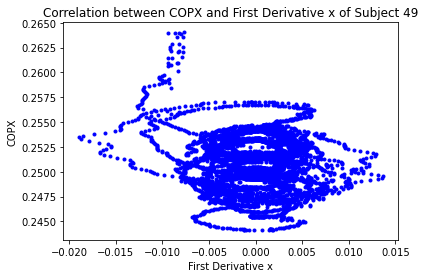

[[ 1.         -0.11912765]
 [-0.11912765  1.        ]]


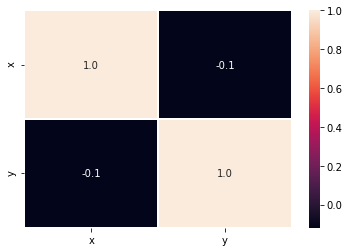

In [37]:
import pandas as pd 
import seaborn as sns
for s in range (1,50):
    a=PDSinfo[PDSinfo['Subject']==s].index.tolist()[2]
    fname_grf = os.path.join(path2, PDSinfo.Trial[a] + 'grf' + '.txt') 
    fname_mkr = os.path.join(path2, PDSinfo.Trial[a] + 'mkr' + '.txt')
    grf = pd.read_csv(fname_grf, delimiter='\t', header=0, engine='c')
    mkr = pd.read_csv(fname_mkr, delimiter='\t', header=0, engine='c')
    COGX=mkr['COG_X']
    COGY=mkr['COG_Y']
    COGZ=mkr['COG_Z']
    d=(COGX**2+COGY**2+COGZ**2)**0.5
    angulox = np.arcsin(COGX/d)
    anguloz= np.arcsin(COGZ/d)
    matrizangx=np.array(angulox[30:])
    matrizangz=np.array(anguloz[30:])
    t=grf['Time']
    dt=t[1]-t[0]
    d1x=np.zeros(len(matrizangx))
    d1z=np.zeros(len(matrizangz))
    for i in range(0, len(matrizangx)-1):
        next=i+1
        d1x[i]=(matrizangx[next]-matrizangx[i])/dt
        d1z[i]=(matrizangz[next]-matrizangz[i])/dt
    d2x=np.zeros(len(d1x))
    d2z=np.zeros(len(d1z))
    for i in range(0, 30):
        next=i+1
        d2x[i]=(d1x[next]-d1x[i])/dt
        d2z[i]=(d1z[next]-d1z[i])/dt
    COPX=COGX[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2x
    COPZ=COGZ[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2z
    COPXreal=grf['COPNET_X']
    COPZreal=grf['COPNET_Z']
    COPXmatrix=np.array(COPX)
    COPXrealmatrix=np.array(COPXreal[30:])
    COPZmatrix=np.array(COPZ)
    COPZrealmatrix=np.array(COPZreal[30:])
    errorx=np.subtract(COPXmatrix,COPXrealmatrix)
    errorz=np.subtract(COPZmatrix,COPZrealmatrix)
    data={'x':d1x,
         'y': COPXmatrix
         }
    df=pd.DataFrame(data)
    plt.plot('x','y','bo',data= df, marker='.')
    plt.xlabel("First Derivative x")
    plt.ylabel("COPX")
    plt.title("Correlation between COPX and First Derivative x of Subject {}".format(s))
    plt.show()
    r=np.corrcoef(d1x,COPXmatrix)
    print(r)
    plt.figure()
    data={'x':d1x,
          'y': COPXmatrix
         }
    df=pd.DataFrame(data)
    correlation=df.corr()
    plot=sns.heatmap(correlation,annot= True, fmt='.1f',linewidths=.6)
    plt.show()

# Correlation between COPX and Second Derivative x

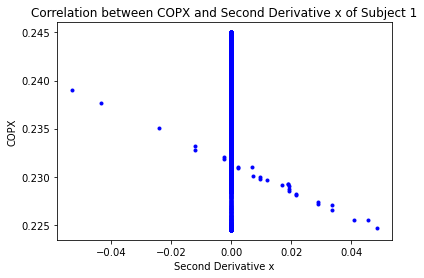

[[ 1.         -0.09580624]
 [-0.09580624  1.        ]]


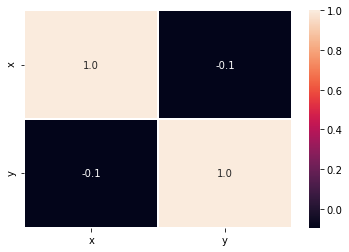

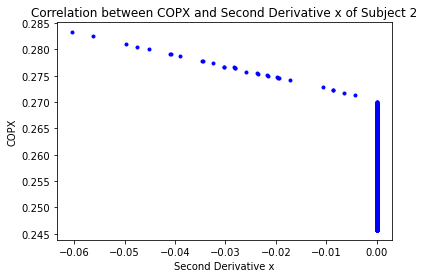

[[ 1.         -0.22668354]
 [-0.22668354  1.        ]]


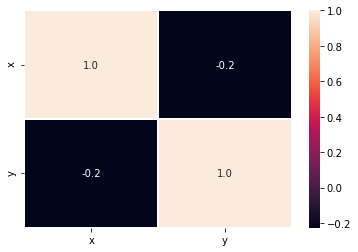

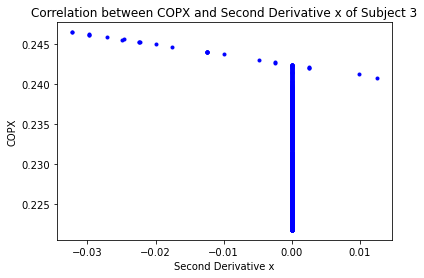

[[ 1.         -0.16194931]
 [-0.16194931  1.        ]]


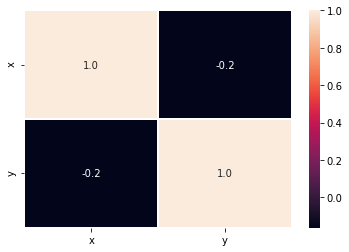

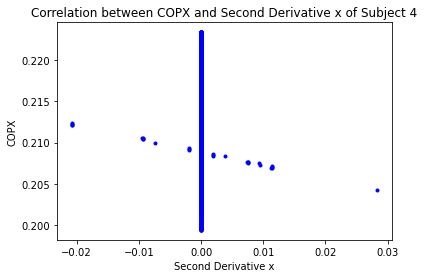

[[ 1.         -0.02182057]
 [-0.02182057  1.        ]]


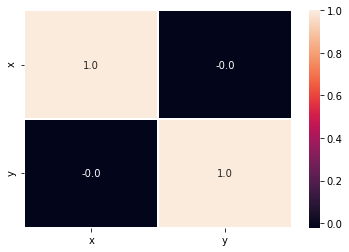

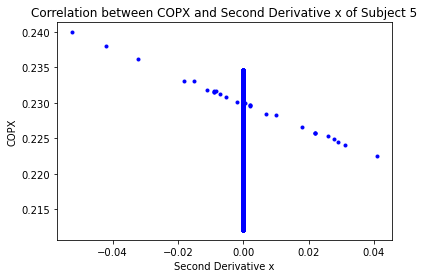

[[ 1.        -0.0473313]
 [-0.0473313  1.       ]]


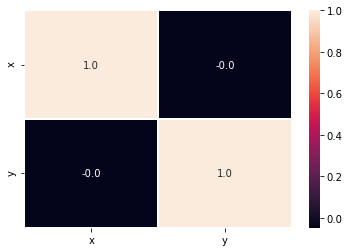

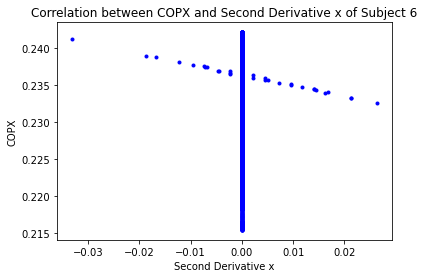

[[ 1.         -0.00951637]
 [-0.00951637  1.        ]]


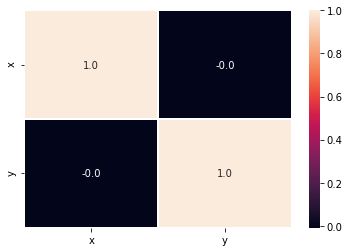

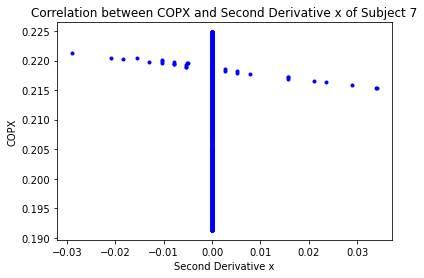

[[ 1.         -0.00587161]
 [-0.00587161  1.        ]]


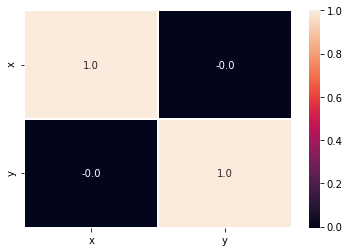

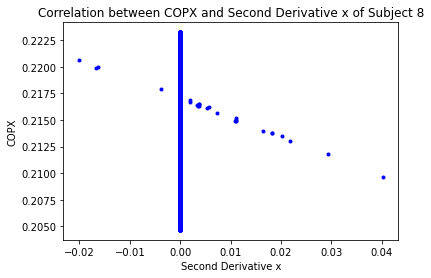

[[ 1.         -0.03255949]
 [-0.03255949  1.        ]]


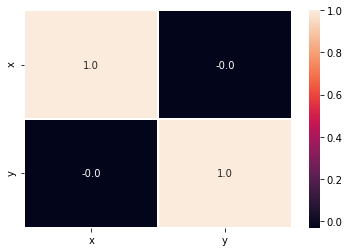

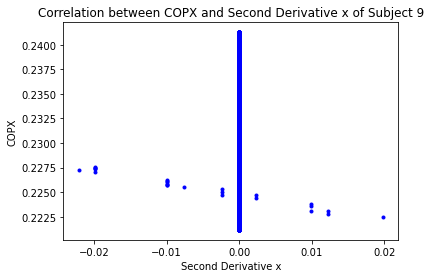

[[1.         0.00657613]
 [0.00657613 1.        ]]


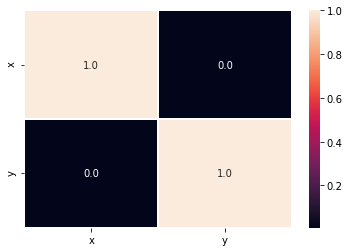

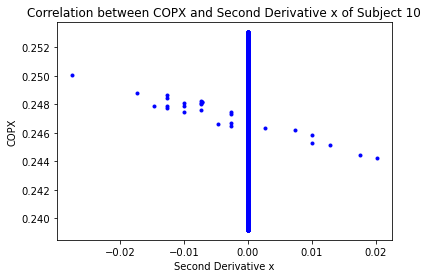

[[ 1.         -0.03617527]
 [-0.03617527  1.        ]]


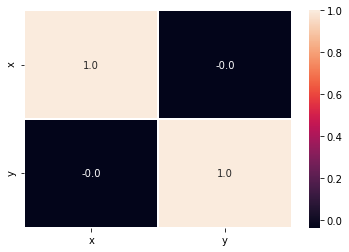

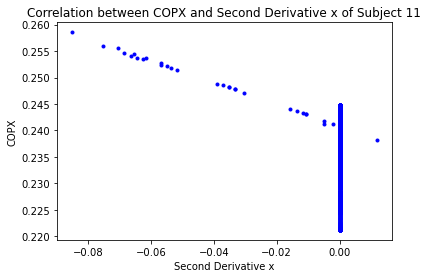

[[ 1.         -0.20329582]
 [-0.20329582  1.        ]]


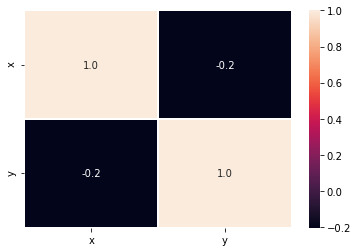

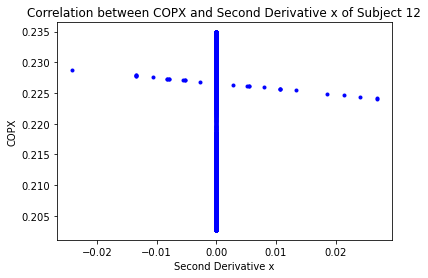

[[ 1.         -0.00771344]
 [-0.00771344  1.        ]]


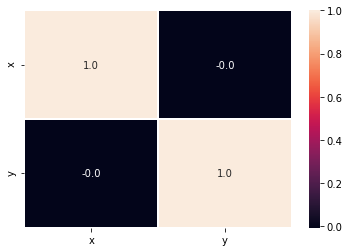

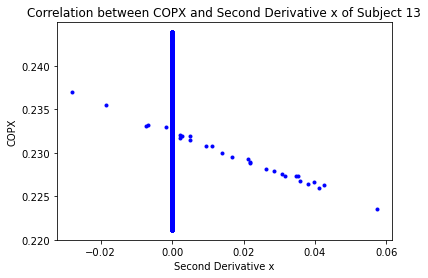

[[ 1.         -0.04125995]
 [-0.04125995  1.        ]]


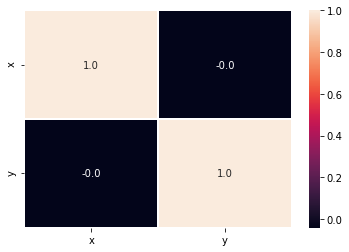

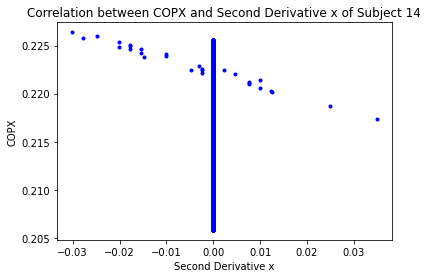

[[ 1.         -0.06172253]
 [-0.06172253  1.        ]]


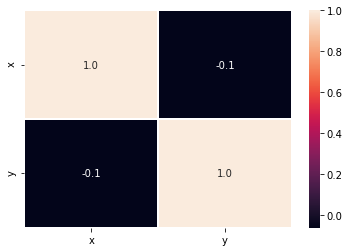

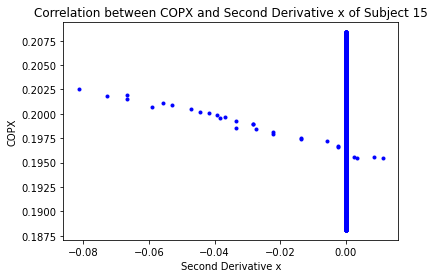

[[ 1.         -0.04928773]
 [-0.04928773  1.        ]]


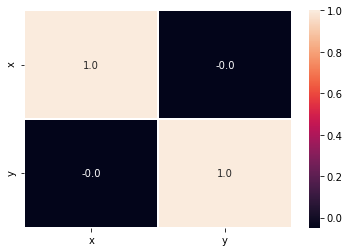

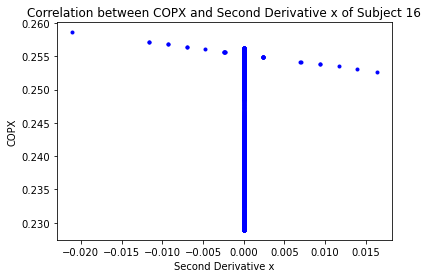

[[ 1.         -0.01525455]
 [-0.01525455  1.        ]]


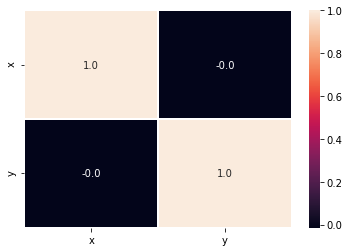

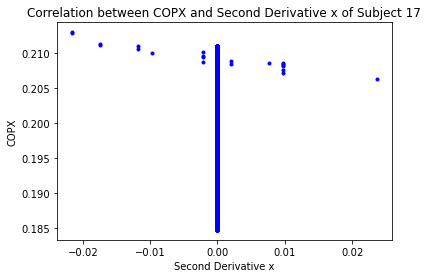

[[ 1.        -0.0339473]
 [-0.0339473  1.       ]]


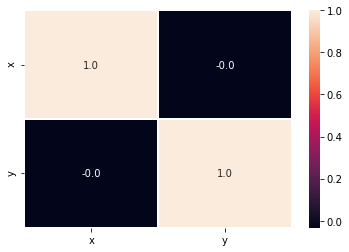

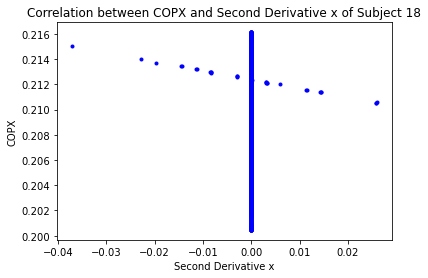

[[ 1.         -0.02406467]
 [-0.02406467  1.        ]]


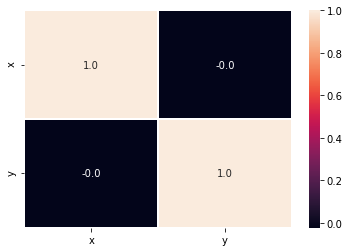

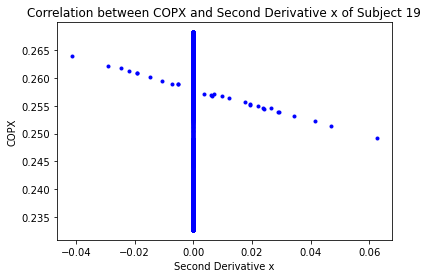

[[ 1.         -0.00915888]
 [-0.00915888  1.        ]]


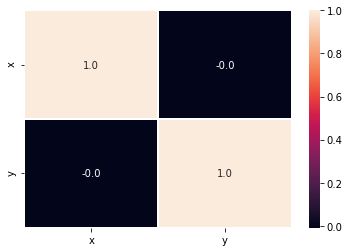

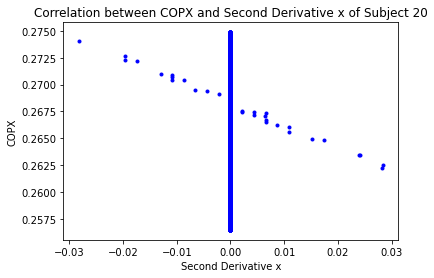

[[ 1.         -0.04466914]
 [-0.04466914  1.        ]]


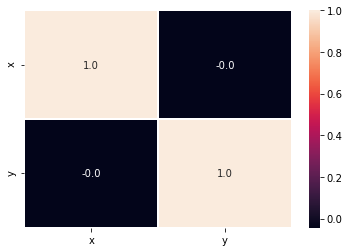

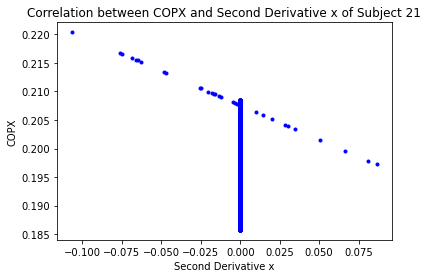

[[ 1.         -0.13111697]
 [-0.13111697  1.        ]]


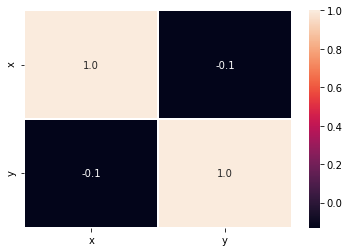

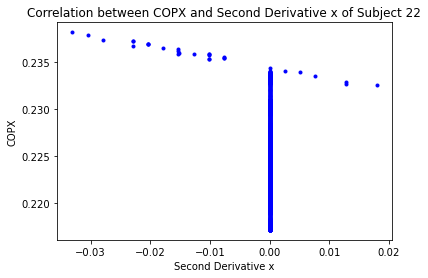

[[ 1.         -0.16658107]
 [-0.16658107  1.        ]]


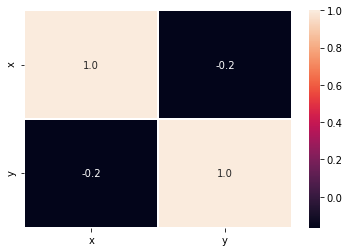

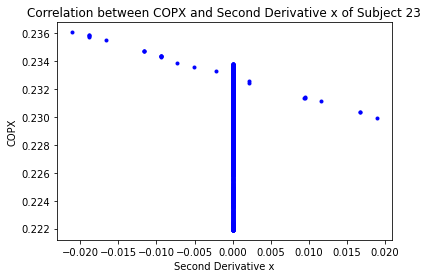

[[ 1.         -0.08680855]
 [-0.08680855  1.        ]]


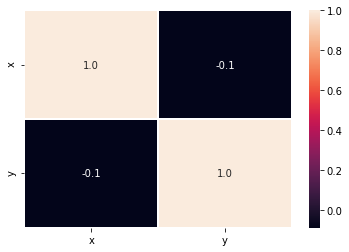

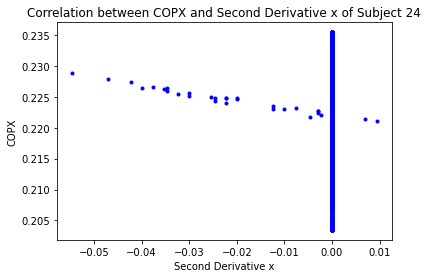

[[ 1.         -0.05352237]
 [-0.05352237  1.        ]]


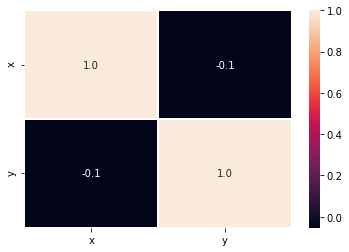

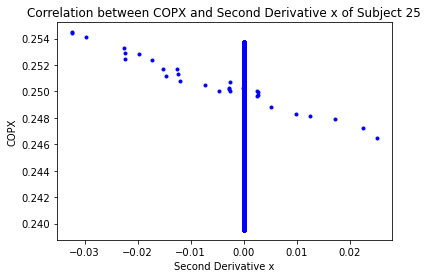

[[ 1.         -0.07317815]
 [-0.07317815  1.        ]]


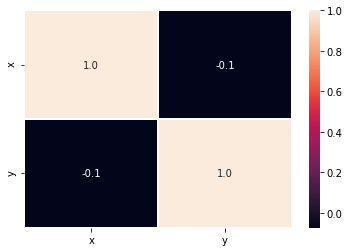

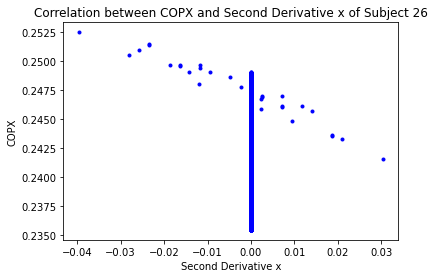

[[ 1.         -0.08608609]
 [-0.08608609  1.        ]]


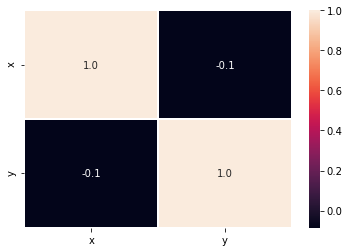

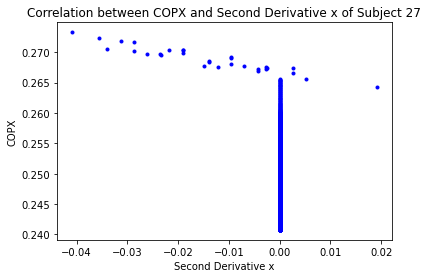

[[ 1.         -0.26231142]
 [-0.26231142  1.        ]]


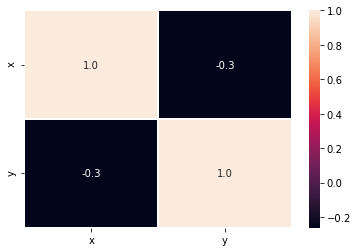

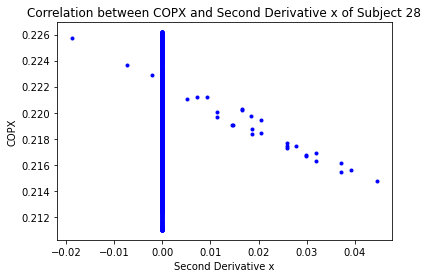

[[ 1.         -0.00749063]
 [-0.00749063  1.        ]]


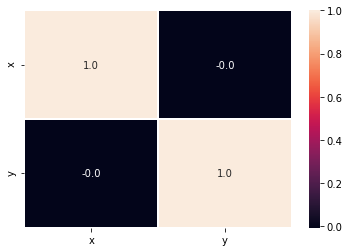

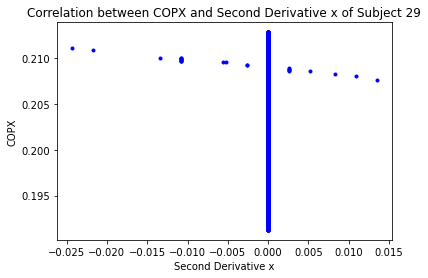

[[ 1.         -0.05291048]
 [-0.05291048  1.        ]]


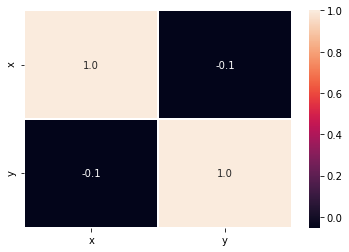

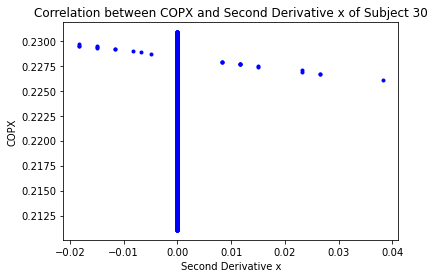

[[1.         0.00813167]
 [0.00813167 1.        ]]


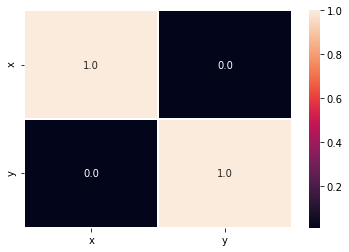

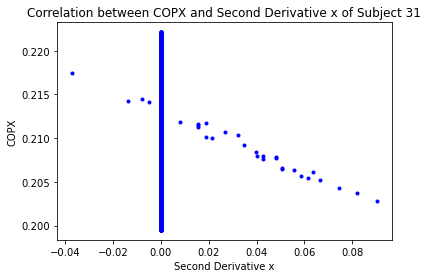

[[ 1.         -0.05001402]
 [-0.05001402  1.        ]]


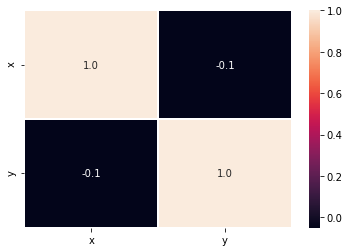

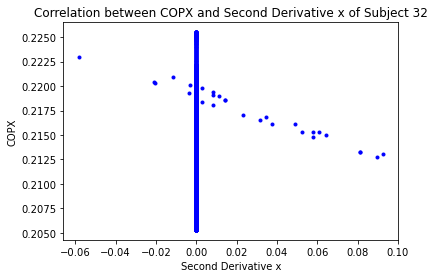

[[ 1.         -0.01846818]
 [-0.01846818  1.        ]]


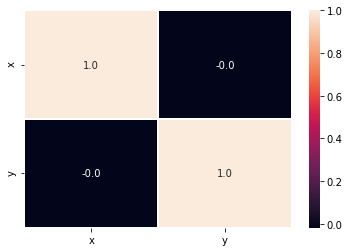

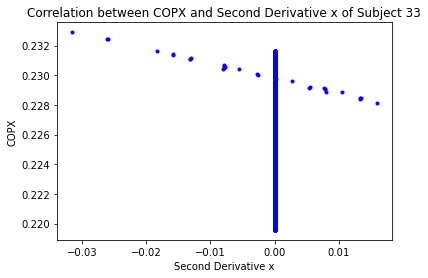

[[ 1.         -0.05498683]
 [-0.05498683  1.        ]]


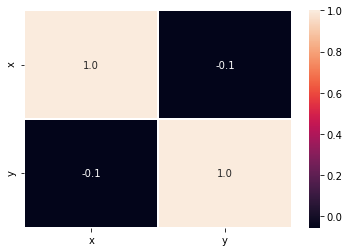

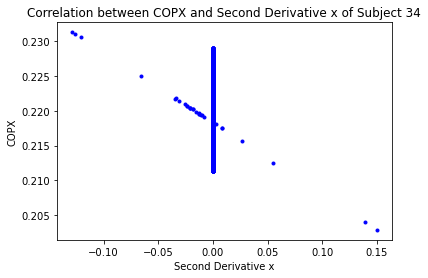

[[ 1.         -0.09733751]
 [-0.09733751  1.        ]]


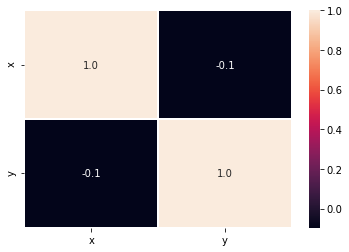

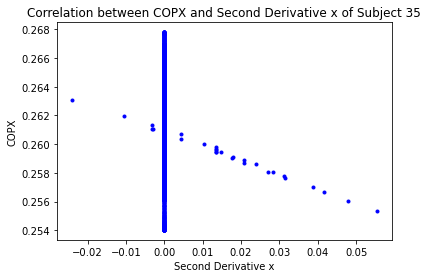

[[ 1.        -0.0658282]
 [-0.0658282  1.       ]]


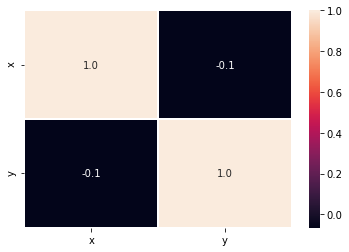

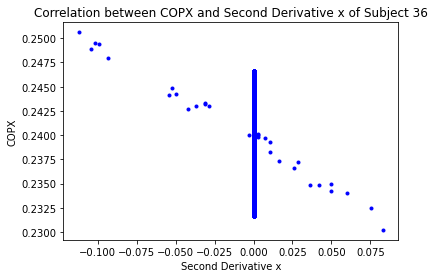

[[ 1.        -0.1143715]
 [-0.1143715  1.       ]]


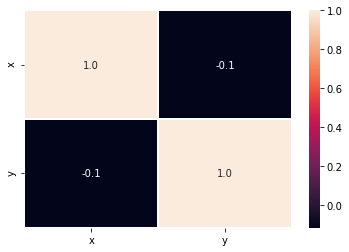

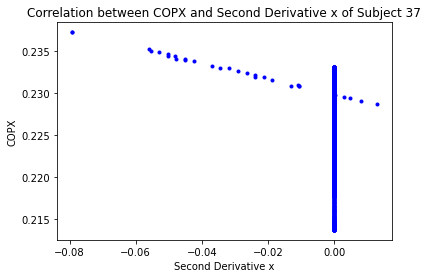

[[ 1.         -0.15653006]
 [-0.15653006  1.        ]]


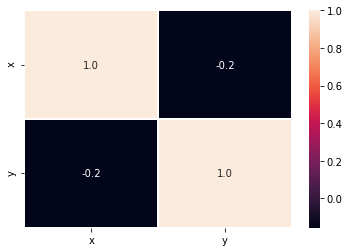

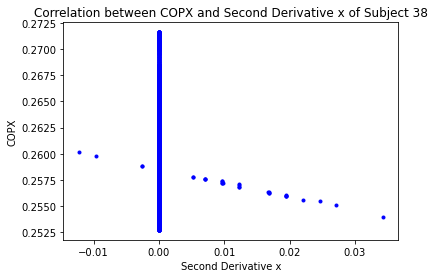

[[ 1.         -0.09053709]
 [-0.09053709  1.        ]]


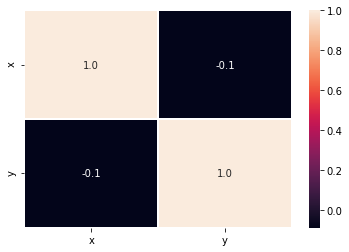

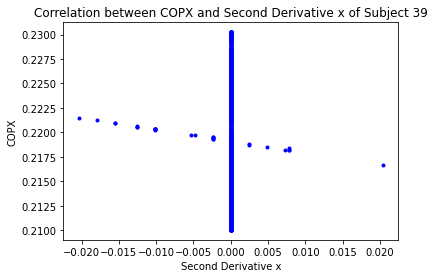

[[ 1.        -0.0220099]
 [-0.0220099  1.       ]]


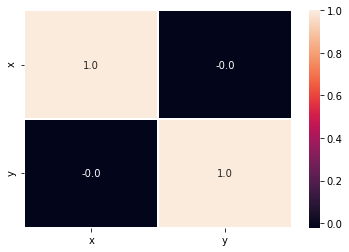

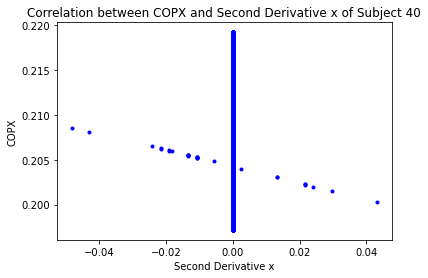

[[ 1.         -0.01503134]
 [-0.01503134  1.        ]]


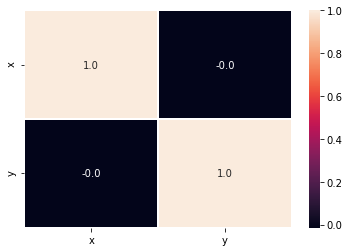

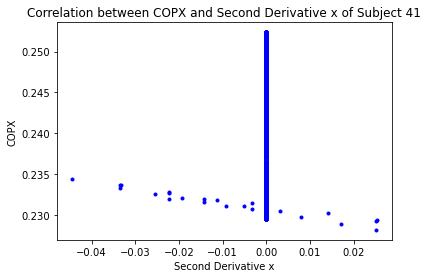

[[1.       0.038192]
 [0.038192 1.      ]]


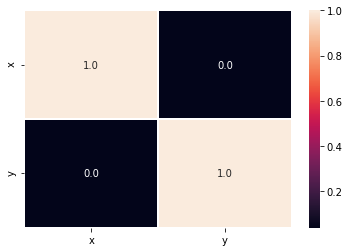

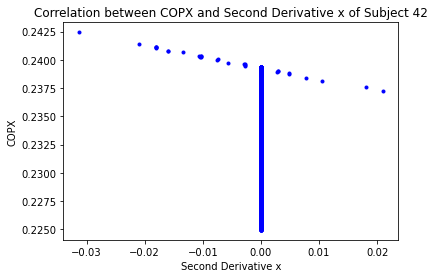

[[ 1.         -0.10611309]
 [-0.10611309  1.        ]]


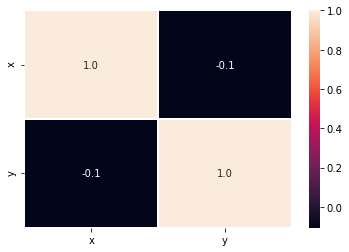

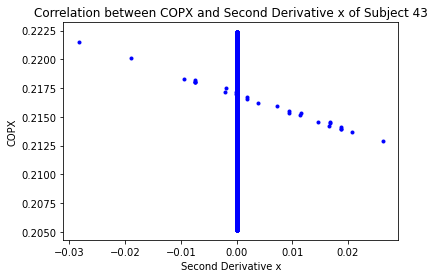

[[ 1.         -0.01314487]
 [-0.01314487  1.        ]]


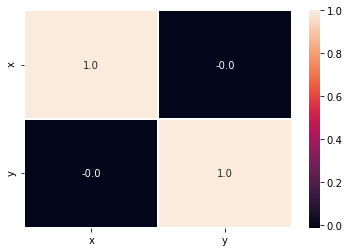

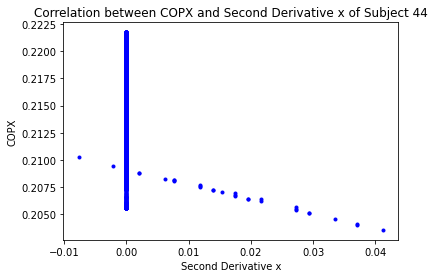

[[ 1.         -0.18975416]
 [-0.18975416  1.        ]]


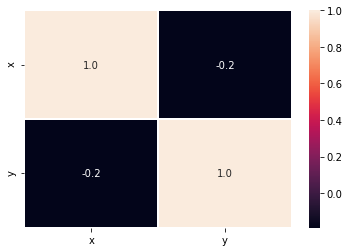

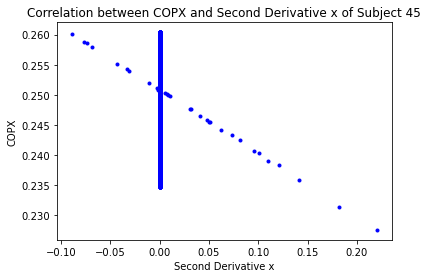

[[ 1.        -0.0733902]
 [-0.0733902  1.       ]]


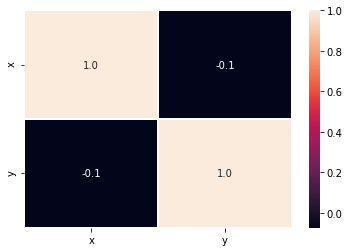

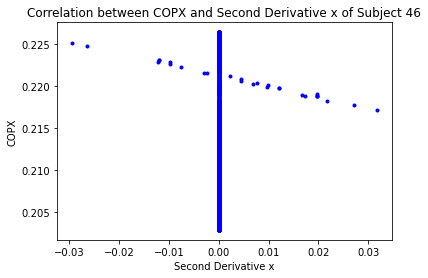

[[1.         0.01165908]
 [0.01165908 1.        ]]


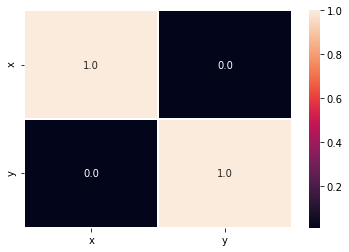

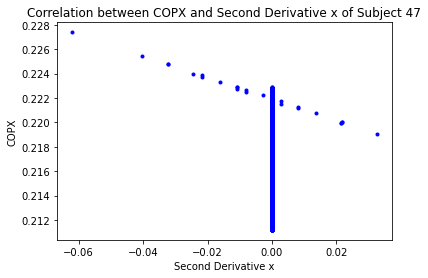

[[ 1.         -0.08612229]
 [-0.08612229  1.        ]]


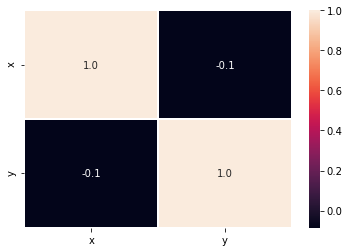

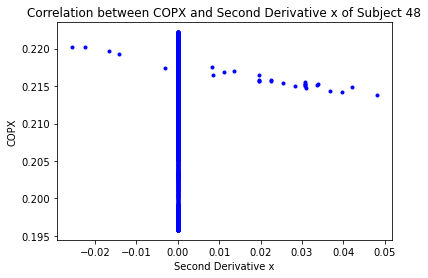

[[1.         0.01448718]
 [0.01448718 1.        ]]


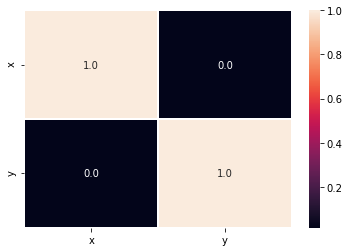

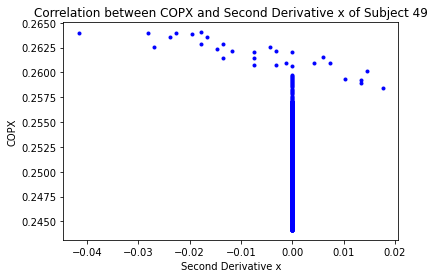

[[ 1.         -0.16434833]
 [-0.16434833  1.        ]]


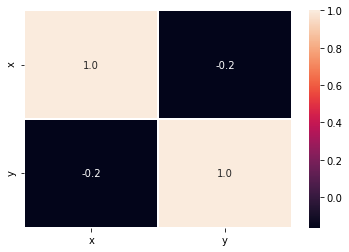

In [36]:
import pandas as pd 
import seaborn as sns
for s in range (1,50):
    a=PDSinfo[PDSinfo['Subject']==s].index.tolist()[2]
    fname_grf = os.path.join(path2, PDSinfo.Trial[a] + 'grf' + '.txt') 
    fname_mkr = os.path.join(path2, PDSinfo.Trial[a] + 'mkr' + '.txt')
    grf = pd.read_csv(fname_grf, delimiter='\t', header=0, engine='c')
    mkr = pd.read_csv(fname_mkr, delimiter='\t', header=0, engine='c')
    COGX=mkr['COG_X']
    COGY=mkr['COG_Y']
    COGZ=mkr['COG_Z']
    d=(COGX**2+COGY**2+COGZ**2)**0.5
    angulox = np.arcsin(COGX/d)
    anguloz= np.arcsin(COGZ/d)
    matrizangx=np.array(angulox[30:])
    matrizangz=np.array(anguloz[30:])
    t=grf['Time']
    dt=t[1]-t[0]
    d1x=np.zeros(len(matrizangx))
    d1z=np.zeros(len(matrizangz))
    for i in range(0, len(matrizangx)-1):
        next=i+1
        d1x[i]=(matrizangx[next]-matrizangx[i])/dt
        d1z[i]=(matrizangz[next]-matrizangz[i])/dt
    d2x=np.zeros(len(d1x))
    d2z=np.zeros(len(d1z))
    for i in range(0, 30):
        next=i+1
        d2x[i]=(d1x[next]-d1x[i])/dt
        d2z[i]=(d1z[next]-d1z[i])/dt
    COPX=COGX[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2x
    COPZ=COGZ[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2z
    COPXreal=grf['COPNET_X']
    COPZreal=grf['COPNET_Z']
    COPXmatrix=np.array(COPX)
    COPXrealmatrix=np.array(COPXreal[30:])
    COPZmatrix=np.array(COPZ)
    COPZrealmatrix=np.array(COPZreal[30:])
    errorx=np.subtract(COPXmatrix,COPXrealmatrix)
    errorz=np.subtract(COPZmatrix,COPZrealmatrix)
    data={'x':d2x,
         'y': COPXmatrix
         }
    df=pd.DataFrame(data)
    plt.plot('x','y','bo',data= df, marker='.')
    plt.xlabel("Second Derivative x")
    plt.ylabel("COPX")
    plt.title("Correlation between COPX and Second Derivative x of Subject {}".format(s))
    plt.show()
    r=np.corrcoef(d2x,COPXmatrix)
    print(r)
    plt.figure()
    data={'x':d2x,
          'y': COPXmatrix
         }
    df=pd.DataFrame(data)
    correlation=df.corr()
    plot=sns.heatmap(correlation,annot= True, fmt='.1f',linewidths=.6)
    plt.show()

# Correlation between COPZ and Angle z

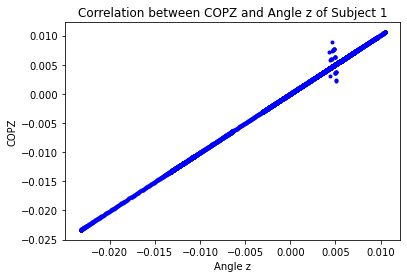

[[1.         0.99979093]
 [0.99979093 1.        ]]


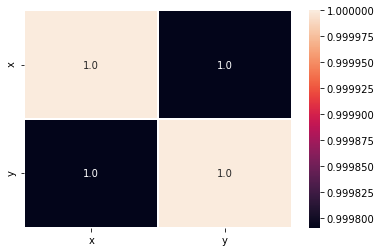

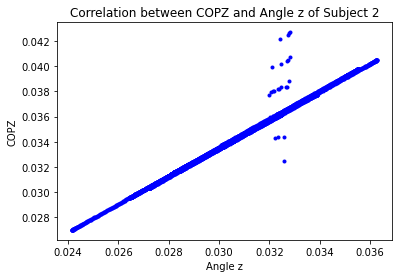

[[1.         0.99654791]
 [0.99654791 1.        ]]


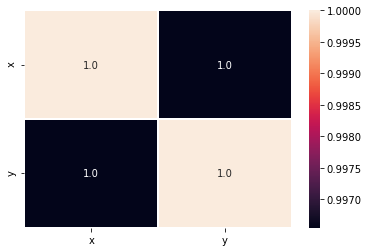

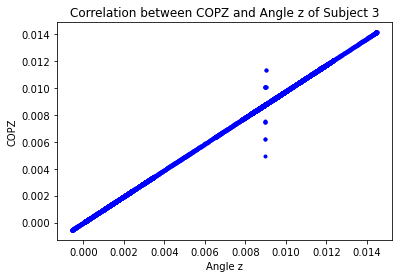

[[1.         0.99971546]
 [0.99971546 1.        ]]


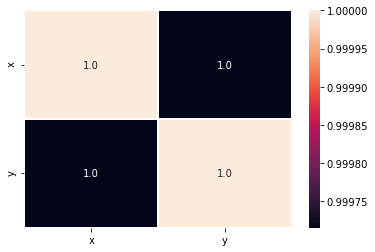

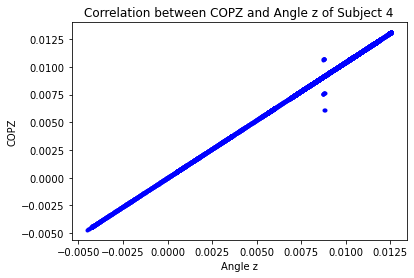

[[1.         0.99974037]
 [0.99974037 1.        ]]


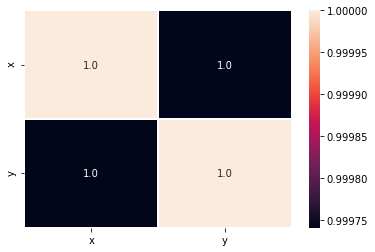

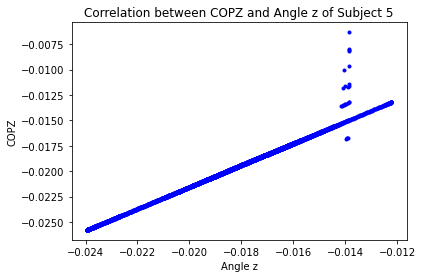

[[1.         0.99499634]
 [0.99499634 1.        ]]


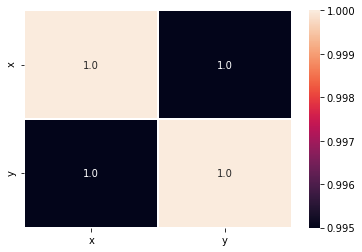

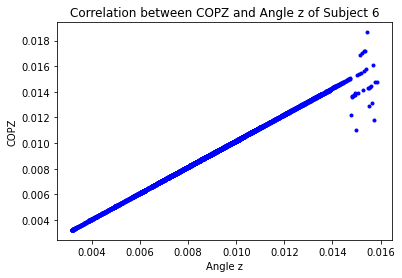

[[1.         0.99836547]
 [0.99836547 1.        ]]


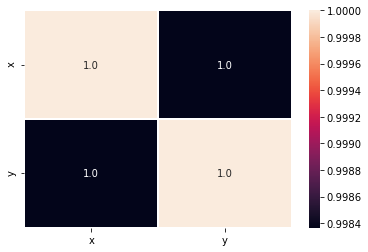

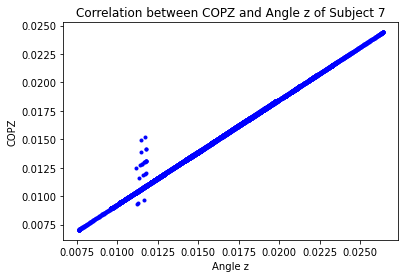

[[1.         0.99913608]
 [0.99913608 1.        ]]


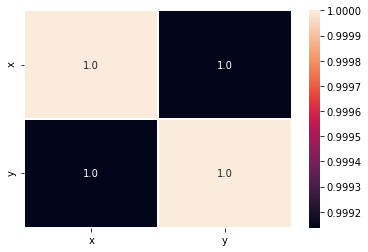

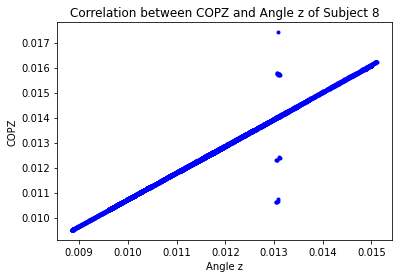

[[1.         0.99583446]
 [0.99583446 1.        ]]


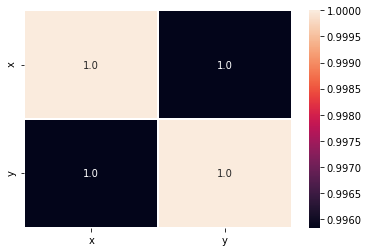

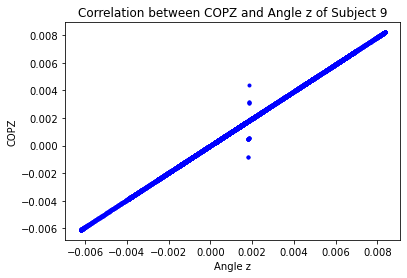

[[1.         0.99966008]
 [0.99966008 1.        ]]


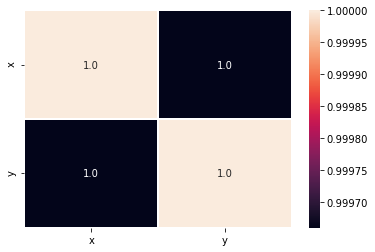

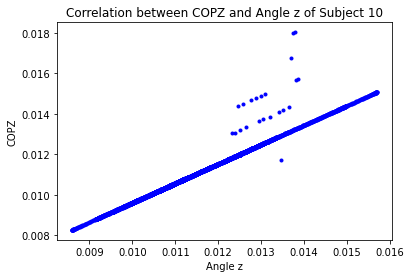

[[1.         0.99315662]
 [0.99315662 1.        ]]


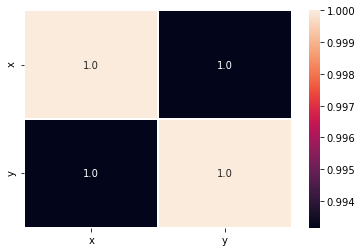

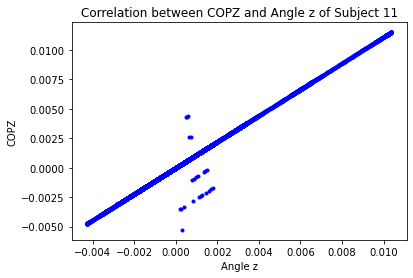

[[1.         0.99794793]
 [0.99794793 1.        ]]


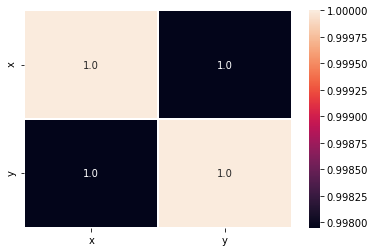

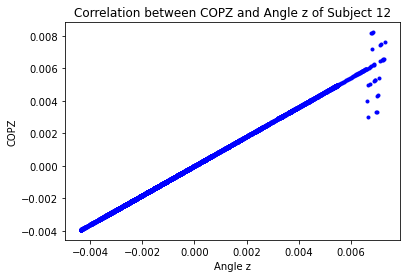

[[1.         0.99906447]
 [0.99906447 1.        ]]


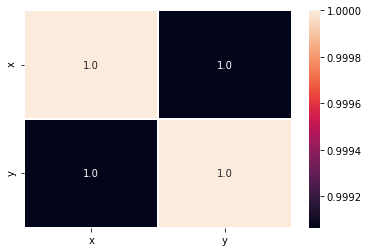

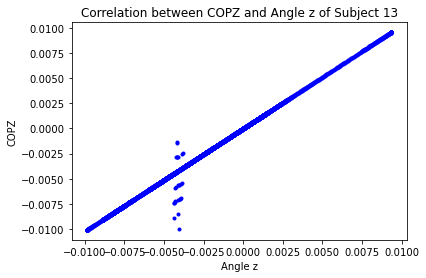

[[1.         0.99888583]
 [0.99888583 1.        ]]


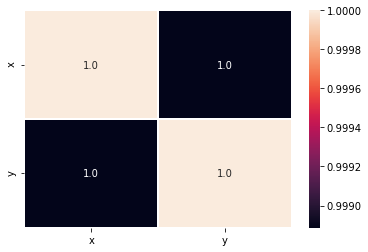

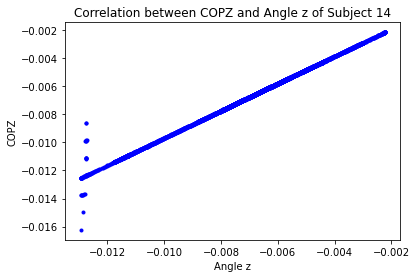

[[1.         0.99764359]
 [0.99764359 1.        ]]


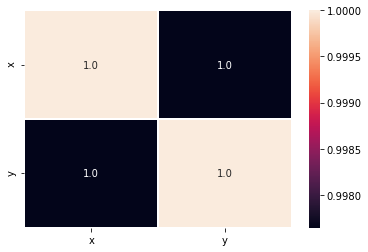

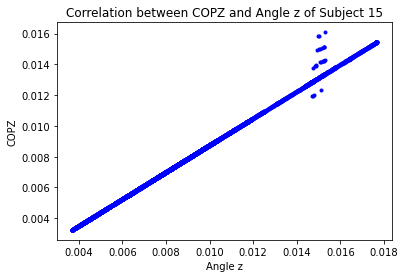

[[1.         0.99938375]
 [0.99938375 1.        ]]


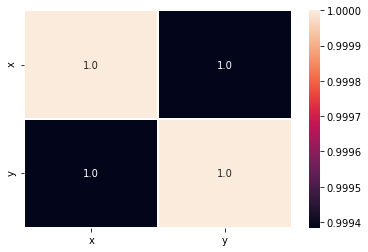

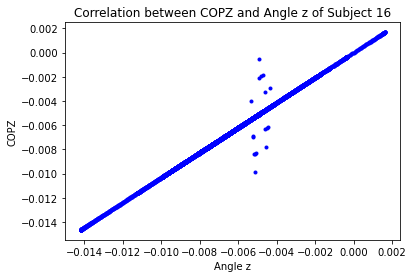

[[1.         0.99870408]
 [0.99870408 1.        ]]


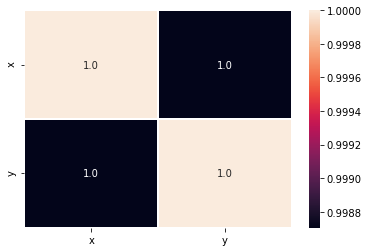

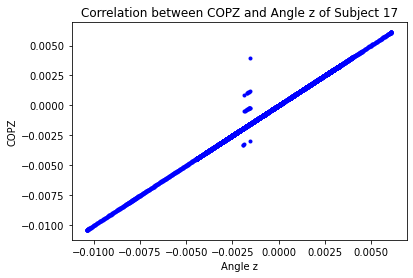

[[1.         0.99891115]
 [0.99891115 1.        ]]


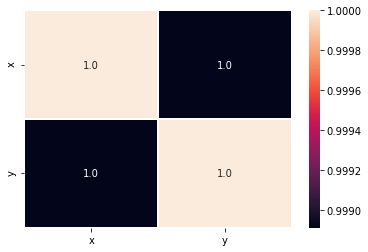

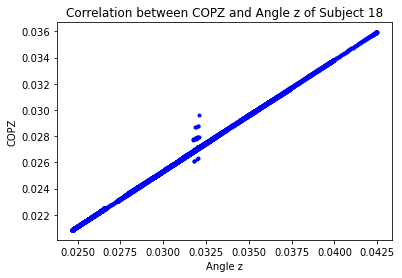

[[1.         0.99975777]
 [0.99975777 1.        ]]


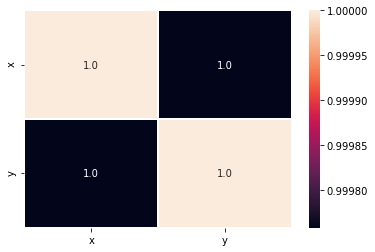

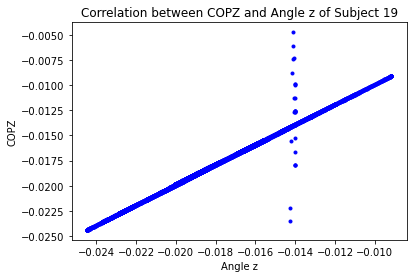

[[1.         0.99501437]
 [0.99501437 1.        ]]


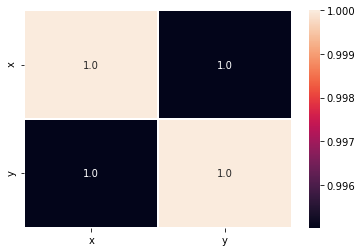

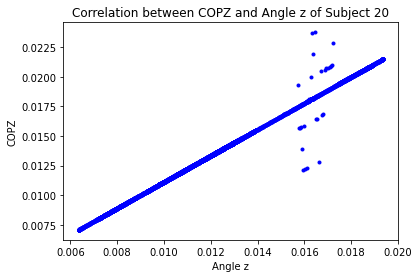

[[1.         0.99793206]
 [0.99793206 1.        ]]


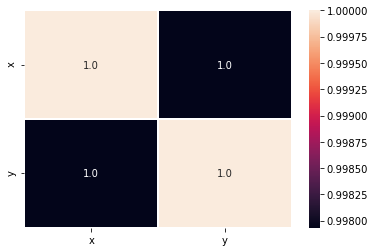

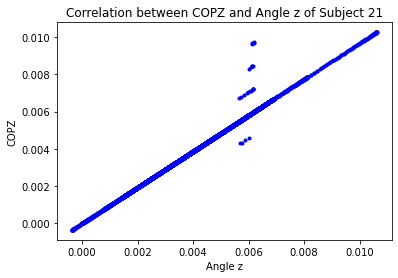

[[1.       0.997243]
 [0.997243 1.      ]]


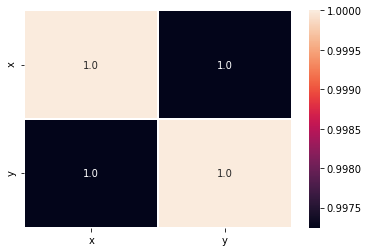

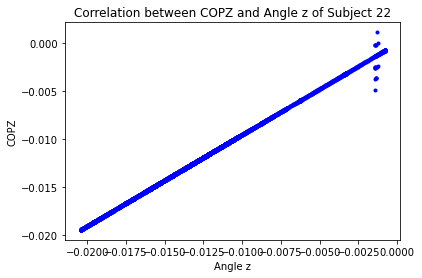

[[1.         0.99967342]
 [0.99967342 1.        ]]


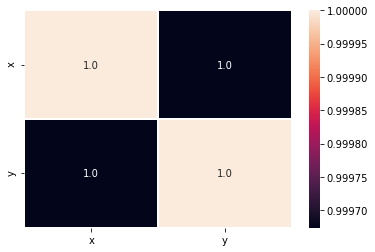

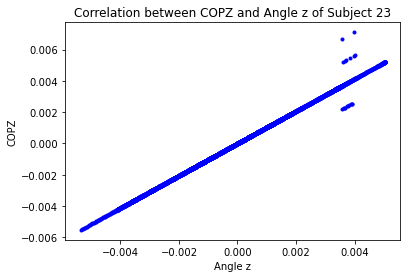

[[1.         0.99909164]
 [0.99909164 1.        ]]


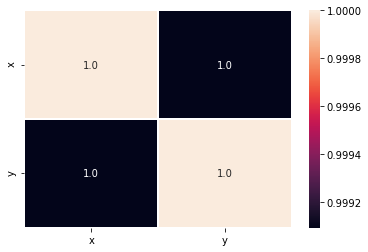

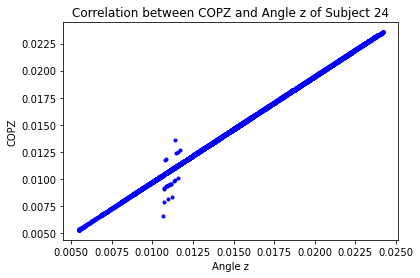

[[1.         0.99968694]
 [0.99968694 1.        ]]


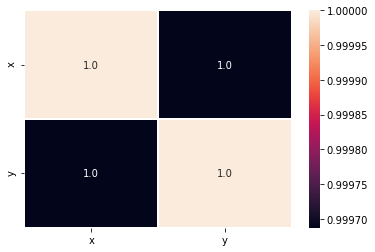

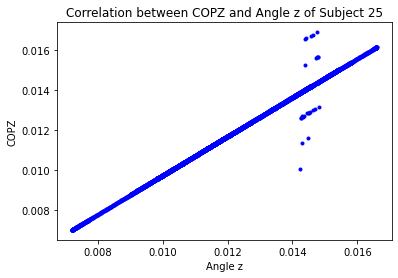

[[1.         0.99810977]
 [0.99810977 1.        ]]


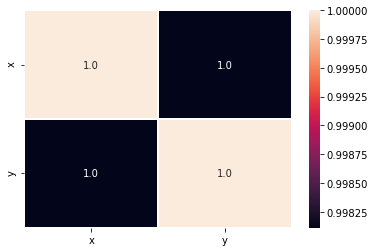

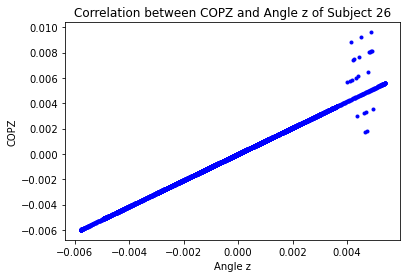

[[1.         0.99737927]
 [0.99737927 1.        ]]


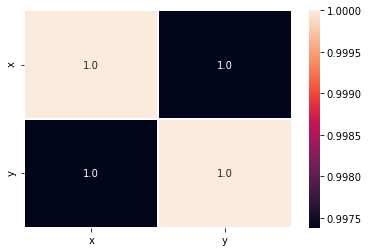

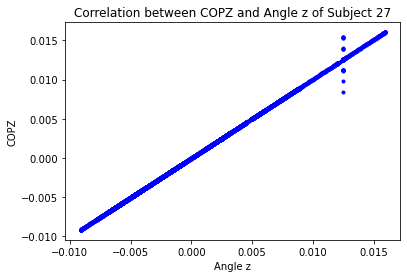

[[1.         0.99975518]
 [0.99975518 1.        ]]


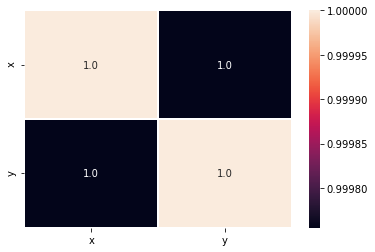

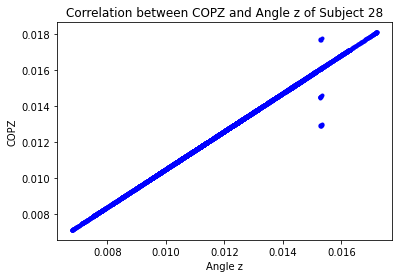

[[1.         0.99835555]
 [0.99835555 1.        ]]


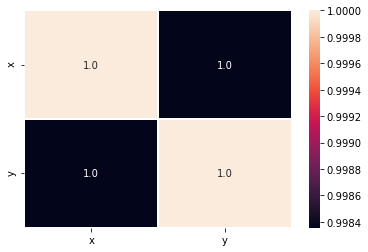

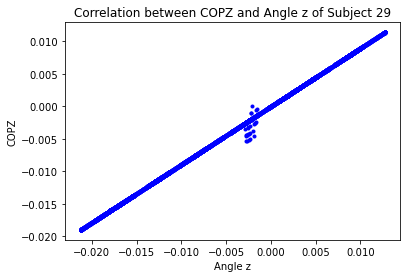

[[1.         0.99989944]
 [0.99989944 1.        ]]


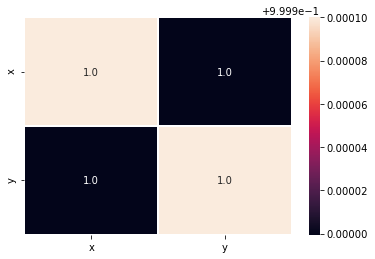

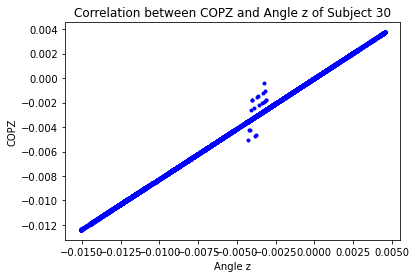

[[1.         0.99986389]
 [0.99986389 1.        ]]


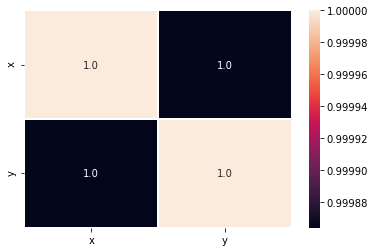

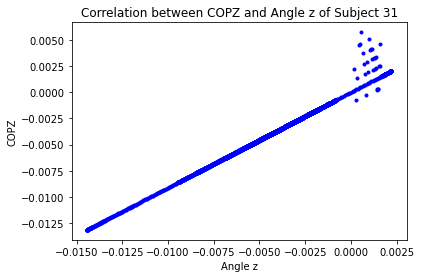

[[1.         0.99722616]
 [0.99722616 1.        ]]


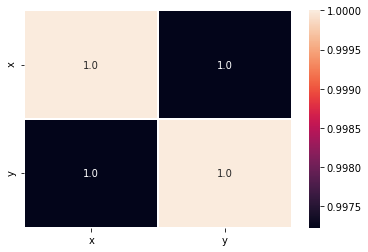

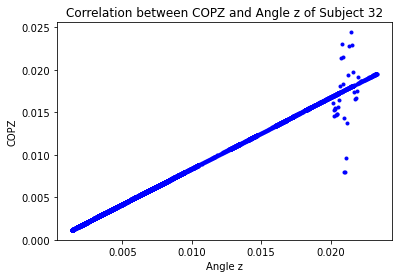

[[1.         0.99795014]
 [0.99795014 1.        ]]


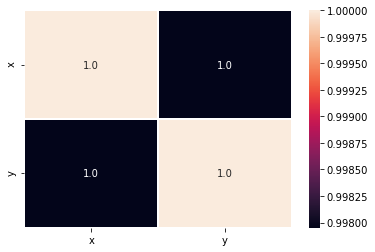

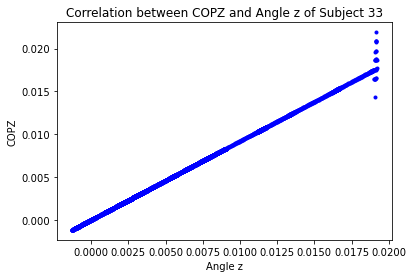

[[1.         0.99955506]
 [0.99955506 1.        ]]


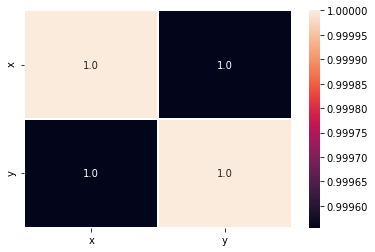

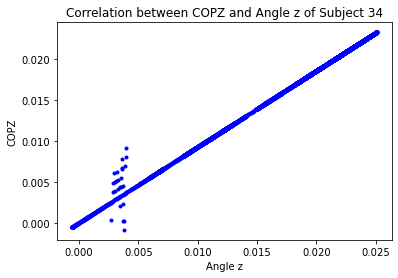

[[1.         0.99947878]
 [0.99947878 1.        ]]


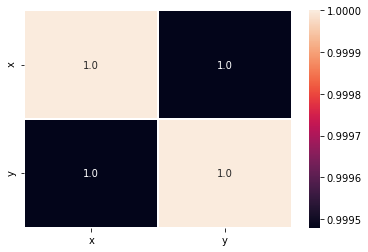

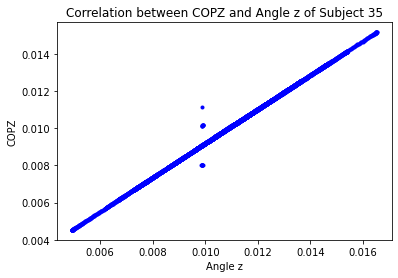

[[1.         0.99955024]
 [0.99955024 1.        ]]


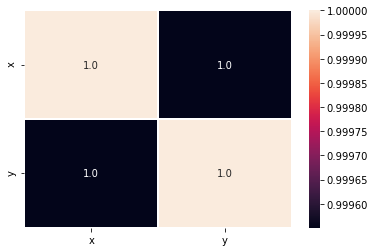

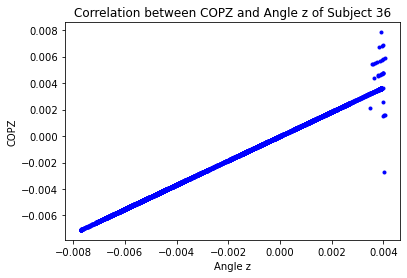

[[1.         0.99845702]
 [0.99845702 1.        ]]


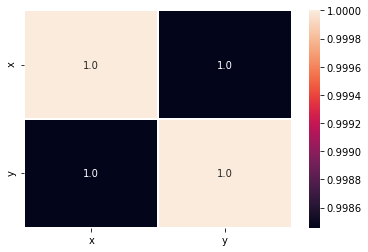

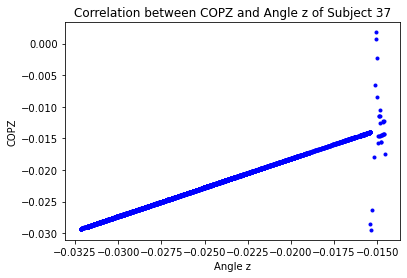

[[1.        0.9916387]
 [0.9916387 1.       ]]


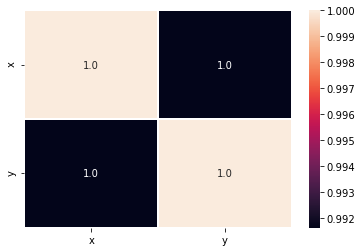

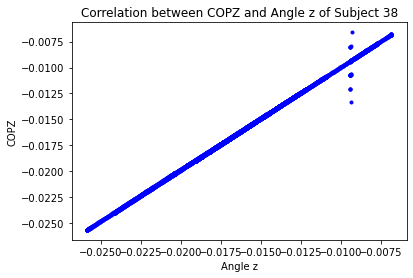

[[1.         0.99957689]
 [0.99957689 1.        ]]


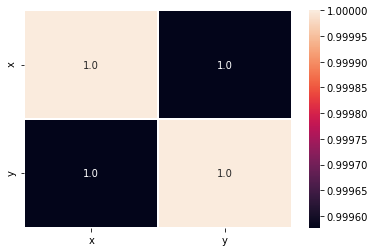

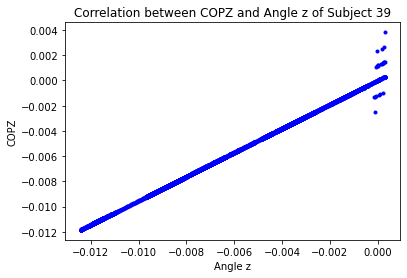

[[1.         0.99953389]
 [0.99953389 1.        ]]


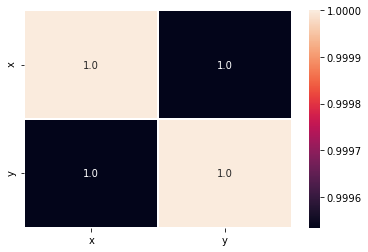

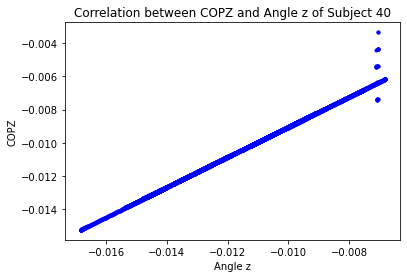

[[1.         0.99881175]
 [0.99881175 1.        ]]


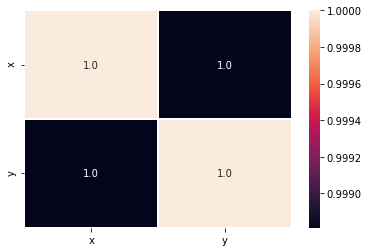

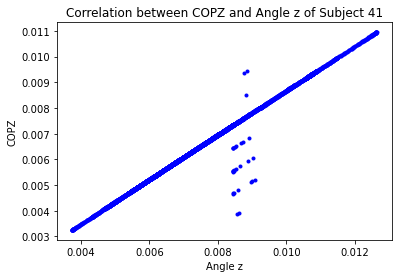

[[1.        0.9955944]
 [0.9955944 1.       ]]


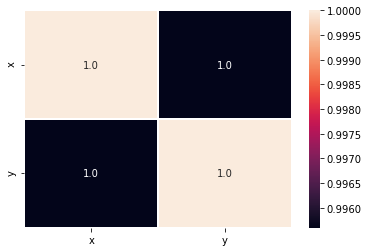

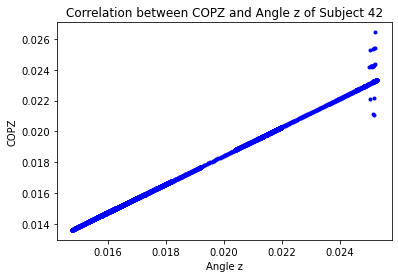

[[1.         0.99925997]
 [0.99925997 1.        ]]


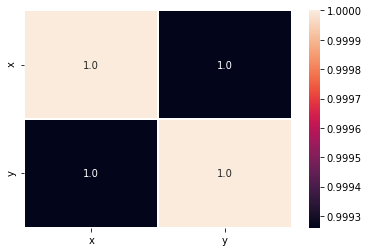

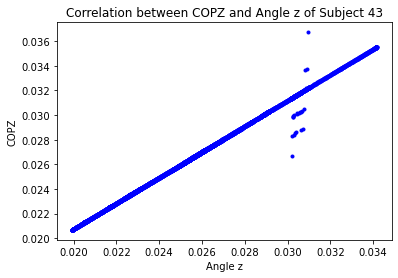

[[1.         0.99901939]
 [0.99901939 1.        ]]


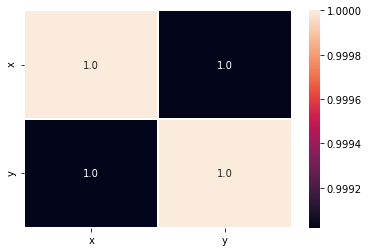

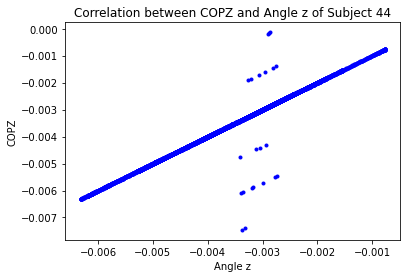

[[1.         0.99187589]
 [0.99187589 1.        ]]


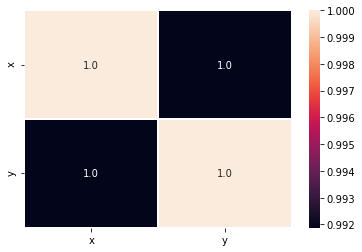

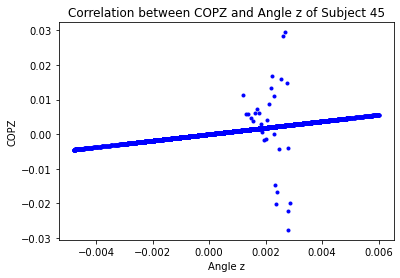

[[1.         0.90808499]
 [0.90808499 1.        ]]


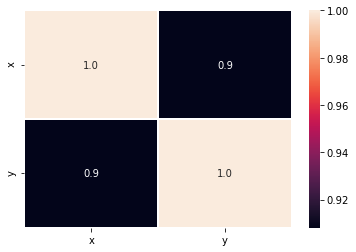

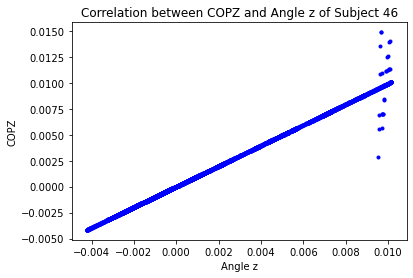

[[1.         0.99834702]
 [0.99834702 1.        ]]


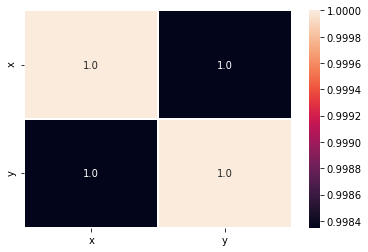

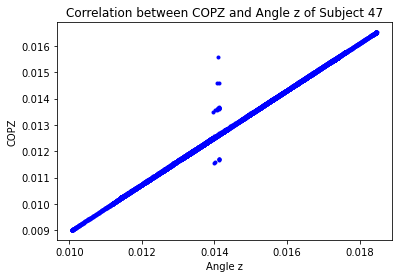

[[1.         0.99901952]
 [0.99901952 1.        ]]


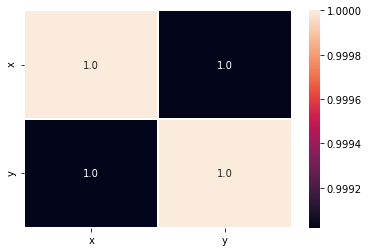

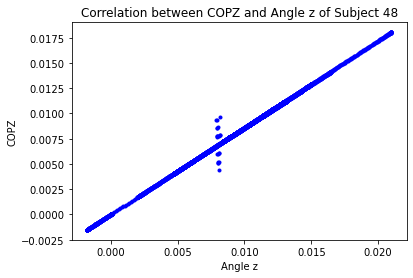

[[1.         0.99959733]
 [0.99959733 1.        ]]


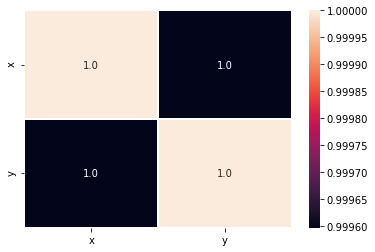

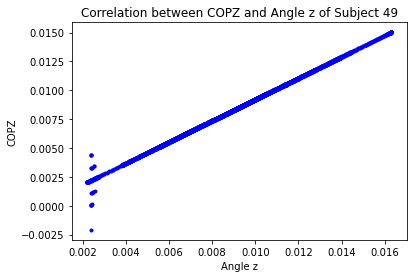

[[1.         0.99902103]
 [0.99902103 1.        ]]


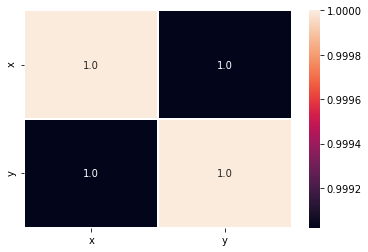

In [38]:
import pandas as pd 
import seaborn as sns
for s in range (1,50):
    a=PDSinfo[PDSinfo['Subject']==s].index.tolist()[2]
    fname_grf = os.path.join(path2, PDSinfo.Trial[a] + 'grf' + '.txt') 
    fname_mkr = os.path.join(path2, PDSinfo.Trial[a] + 'mkr' + '.txt')
    grf = pd.read_csv(fname_grf, delimiter='\t', header=0, engine='c')
    mkr = pd.read_csv(fname_mkr, delimiter='\t', header=0, engine='c')
    COGX=mkr['COG_X']
    COGY=mkr['COG_Y']
    COGZ=mkr['COG_Z']
    d=(COGX**2+COGY**2+COGZ**2)**0.5
    angulox = np.arcsin(COGX/d)
    anguloz= np.arcsin(COGZ/d)
    matrizangx=np.array(angulox[30:])
    matrizangz=np.array(anguloz[30:])
    t=grf['Time']
    dt=t[1]-t[0]
    d1x=np.zeros(len(matrizangx))
    d1z=np.zeros(len(matrizangz))
    for i in range(0, len(matrizangx)-1):
        next=i+1
        d1x[i]=(matrizangx[next]-matrizangx[i])/dt
        d1z[i]=(matrizangz[next]-matrizangz[i])/dt
    d2x=np.zeros(len(d1x))
    d2z=np.zeros(len(d1z))
    for i in range(0, 30):
        next=i+1
        d2x[i]=(d1x[next]-d1x[i])/dt
        d2z[i]=(d1z[next]-d1z[i])/dt
    COPX=COGX[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2x
    COPZ=COGZ[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2z
    COPXreal=grf['COPNET_X']
    COPZreal=grf['COPNET_Z']
    COPXmatrix=np.array(COPX)
    COPXrealmatrix=np.array(COPXreal[30:])
    COPZmatrix=np.array(COPZ)
    COPZrealmatrix=np.array(COPZreal[30:])
    errorx=np.subtract(COPXmatrix,COPXrealmatrix)
    errorz=np.subtract(COPZmatrix,COPZrealmatrix)
    data={'x':matrizangz,
         'y': COPZmatrix
         }
    df=pd.DataFrame(data)
    #ax=sns.lmplot(x=matrizangx, y=errorx, data= df)
    #ax
    plt.plot('x','y','bo',data= df, marker='.')
    plt.xlabel("Angle z")
    plt.ylabel("COPZ")
    plt.title("Correlation between COPZ and Angle z of Subject {}".format(s))
    plt.show()
    r=np.corrcoef(matrizangz,COPZmatrix)
    print(r)
    plt.figure()
    data={'x':matrizangz,
          'y': COPZmatrix
         }
    df=pd.DataFrame(data)
    correlation=df.corr()
    plot=sns.heatmap(correlation,annot= True, fmt='.1f',linewidths=.6)
    plt.show()

# Correlation between COPZ and First Derivative z

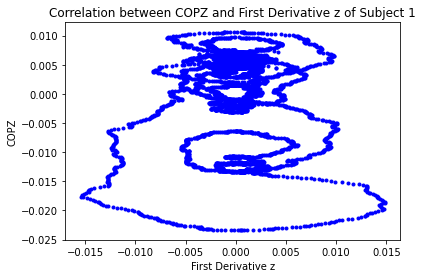

[[ 1.00000000e+00 -1.62047984e-04]
 [-1.62047984e-04  1.00000000e+00]]


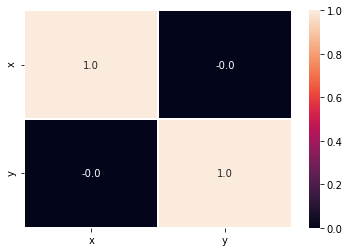

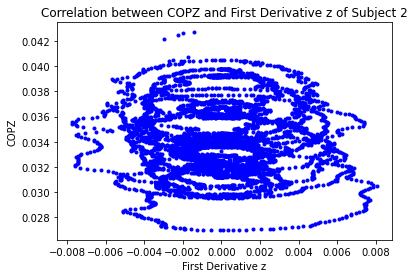

[[ 1.         -0.01444776]
 [-0.01444776  1.        ]]


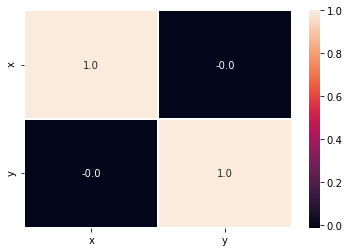

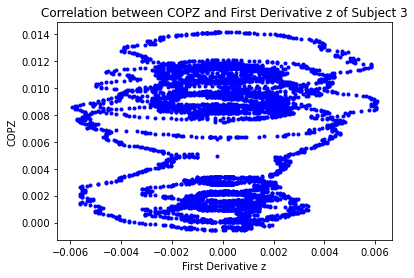

[[1.         0.01693109]
 [0.01693109 1.        ]]


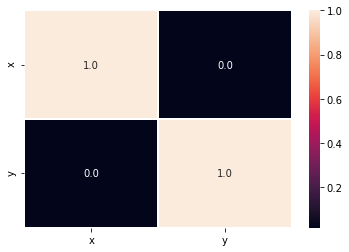

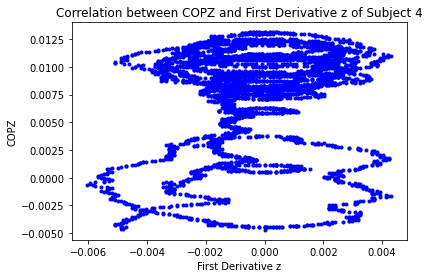

[[1.         0.15525903]
 [0.15525903 1.        ]]


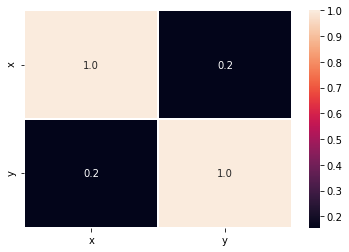

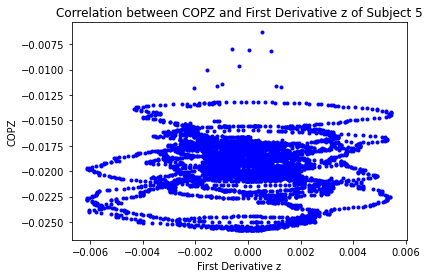

[[ 1.         -0.03710541]
 [-0.03710541  1.        ]]


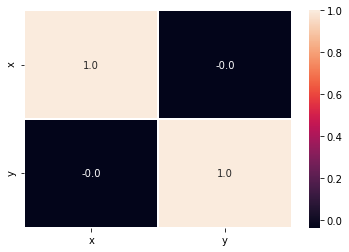

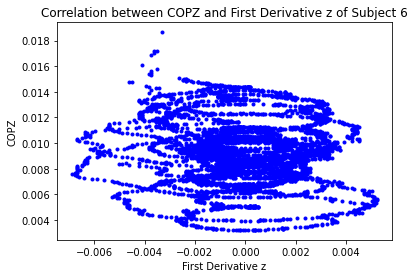

[[ 1.         -0.06950661]
 [-0.06950661  1.        ]]


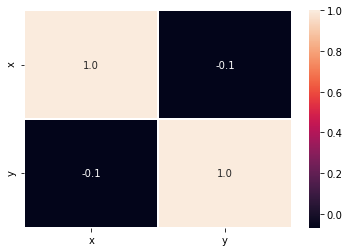

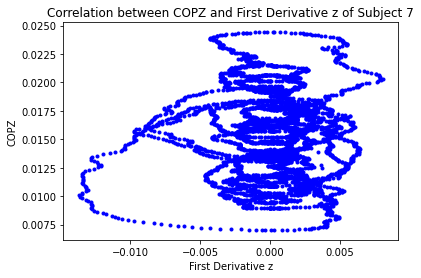

[[ 1.         -0.00895916]
 [-0.00895916  1.        ]]


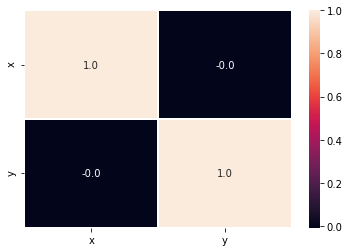

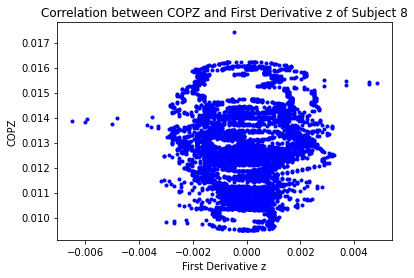

[[ 1.         -0.01165328]
 [-0.01165328  1.        ]]


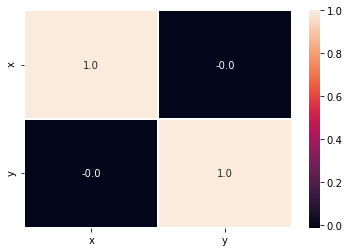

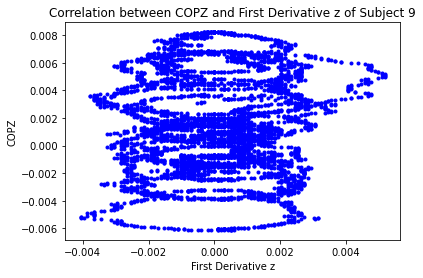

[[1.         0.04137695]
 [0.04137695 1.        ]]


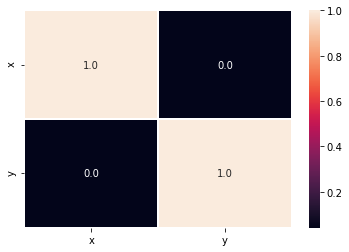

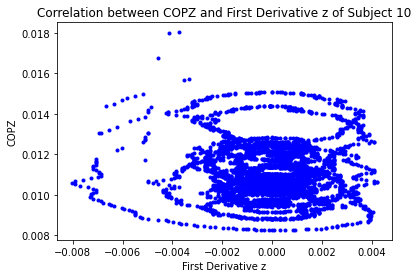

[[ 1.         -0.04193993]
 [-0.04193993  1.        ]]


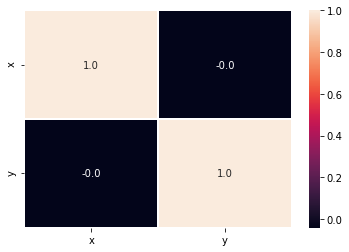

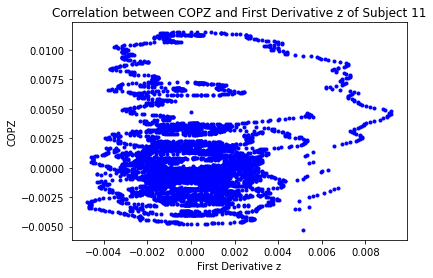

[[1.         0.00762542]
 [0.00762542 1.        ]]


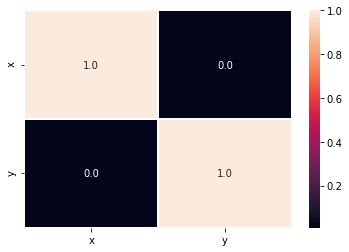

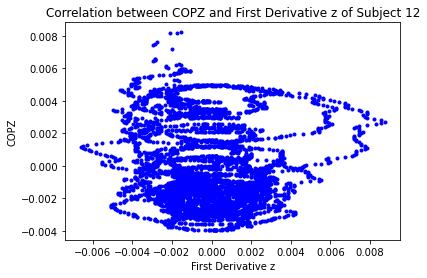

[[ 1.       -0.090411]
 [-0.090411  1.      ]]


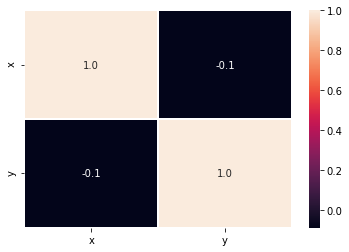

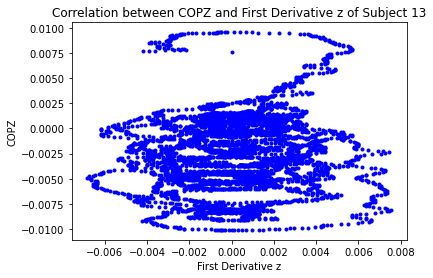

[[1.        0.0869879]
 [0.0869879 1.       ]]


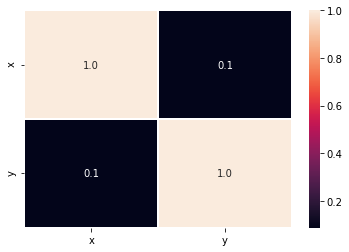

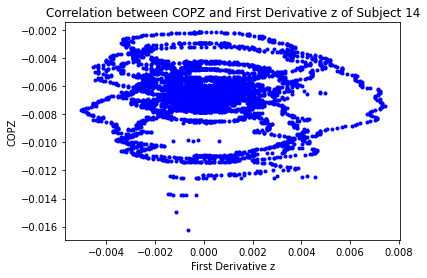

[[ 1.         -0.08301499]
 [-0.08301499  1.        ]]


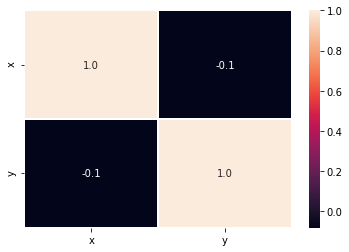

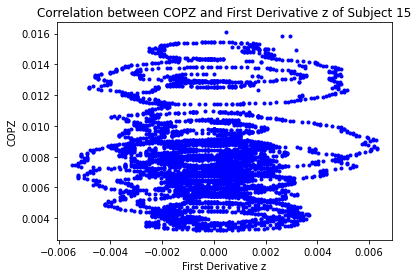

[[ 1.         -0.03516189]
 [-0.03516189  1.        ]]


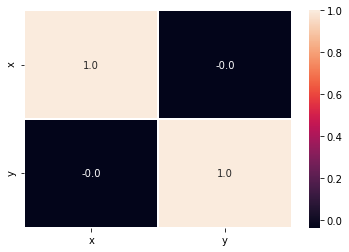

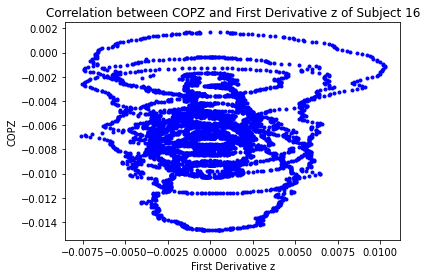

[[ 1.         -0.00372154]
 [-0.00372154  1.        ]]


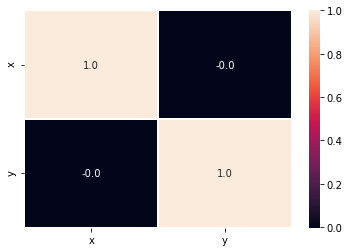

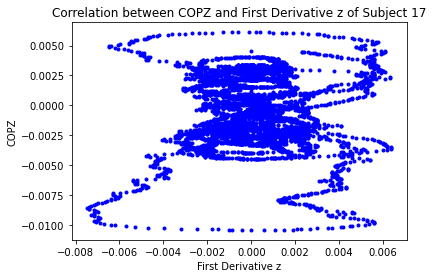

[[1.         0.02995214]
 [0.02995214 1.        ]]


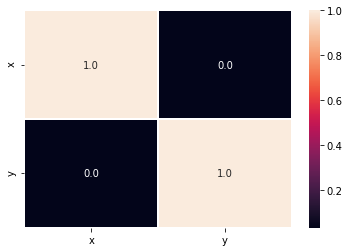

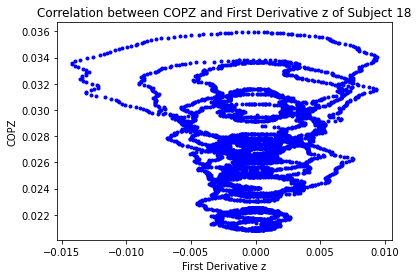

[[1.         0.02586661]
 [0.02586661 1.        ]]


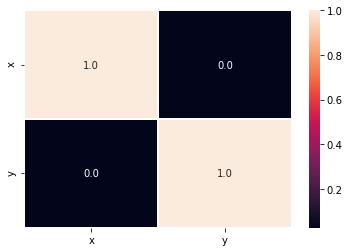

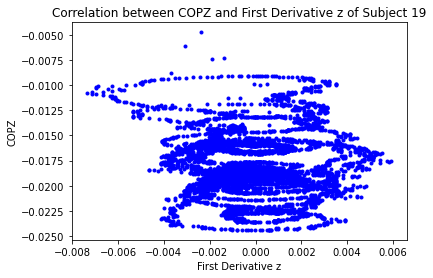

[[ 1.         -0.02684388]
 [-0.02684388  1.        ]]


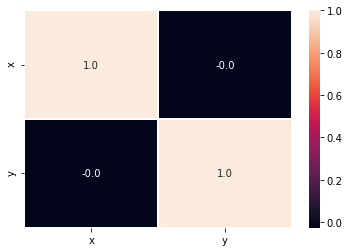

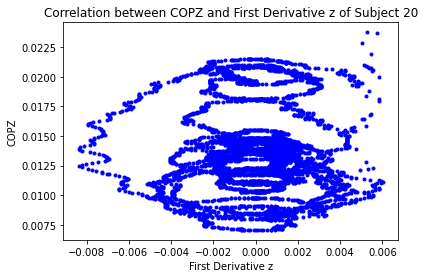

[[ 1.         -0.01853285]
 [-0.01853285  1.        ]]


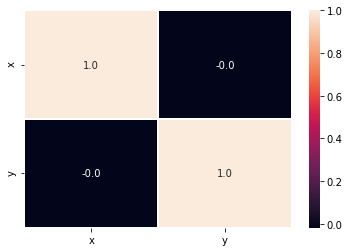

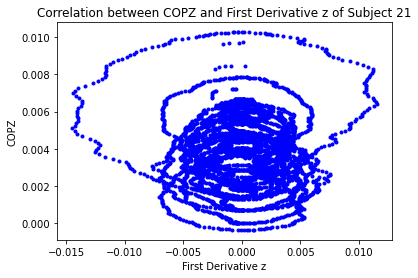

[[ 1.         -0.01316021]
 [-0.01316021  1.        ]]


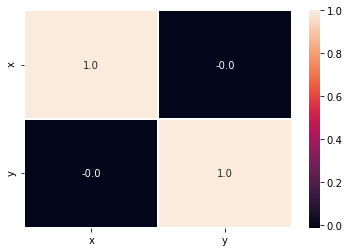

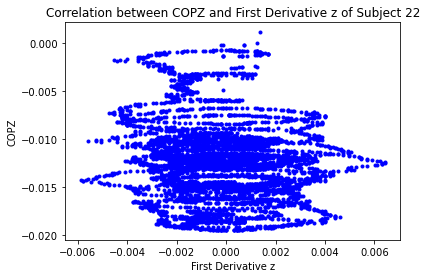

[[ 1.         -0.14161428]
 [-0.14161428  1.        ]]


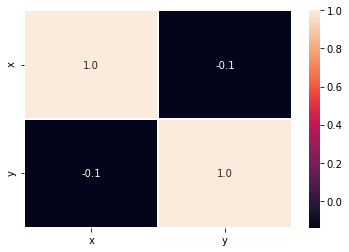

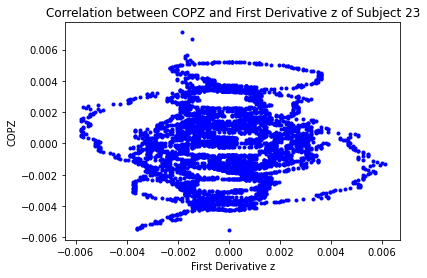

[[1.         0.02169886]
 [0.02169886 1.        ]]


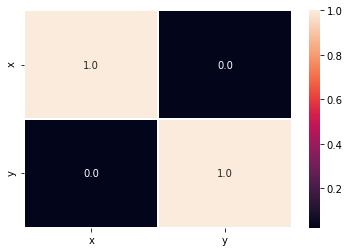

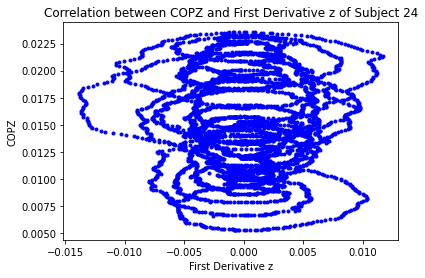

[[ 1.         -0.01069746]
 [-0.01069746  1.        ]]


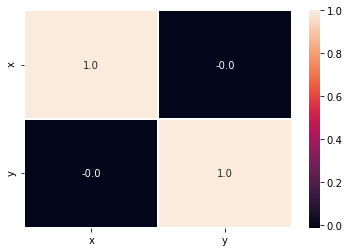

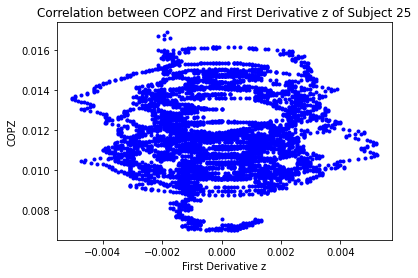

[[1.         0.02301238]
 [0.02301238 1.        ]]


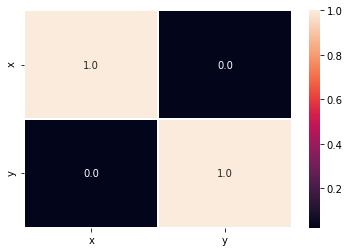

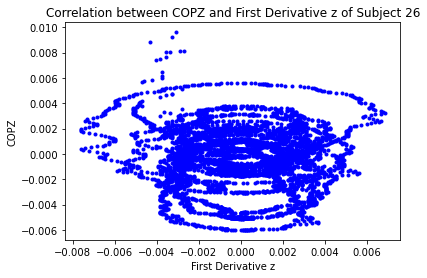

[[ 1.         -0.04854256]
 [-0.04854256  1.        ]]


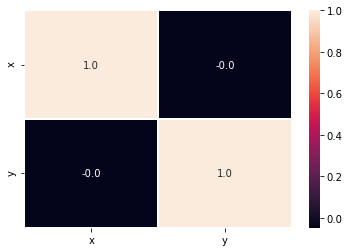

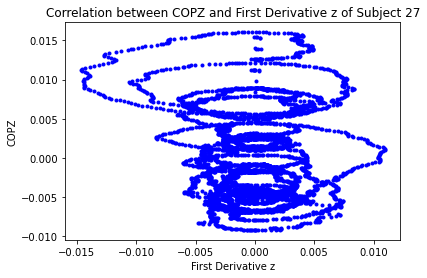

[[ 1.         -0.07729011]
 [-0.07729011  1.        ]]


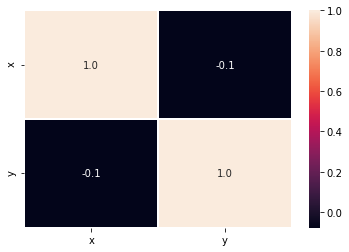

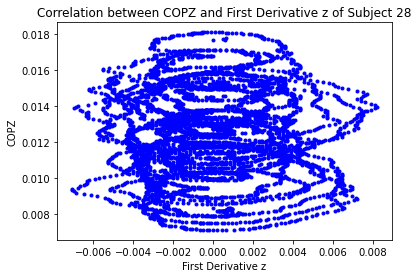

[[1.00000e+00 1.97115e-04]
 [1.97115e-04 1.00000e+00]]


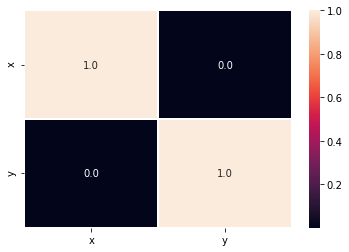

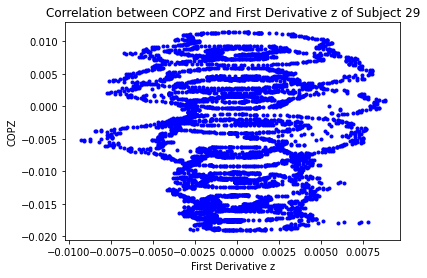

[[ 1.        -0.0034841]
 [-0.0034841  1.       ]]


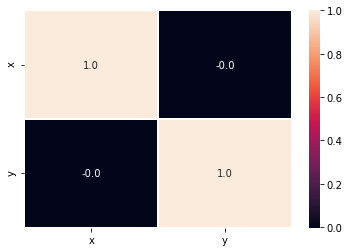

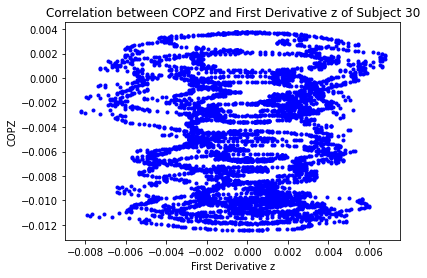

[[1.         0.00924236]
 [0.00924236 1.        ]]


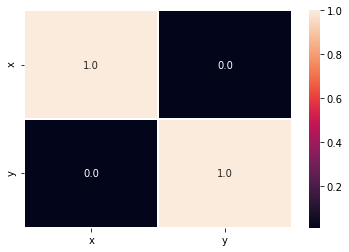

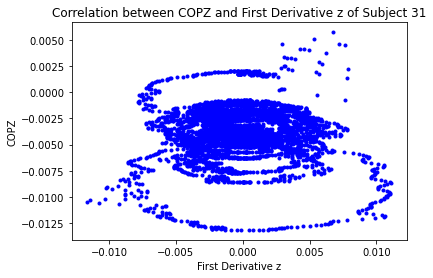

[[1.00000000e+00 7.65507591e-04]
 [7.65507591e-04 1.00000000e+00]]


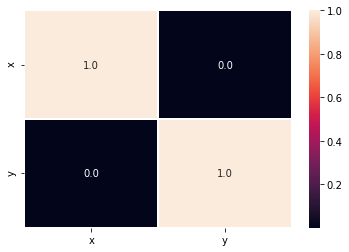

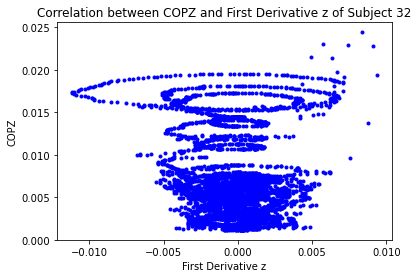

[[ 1.         -0.10823323]
 [-0.10823323  1.        ]]


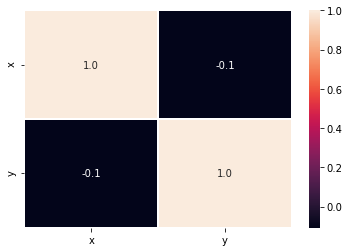

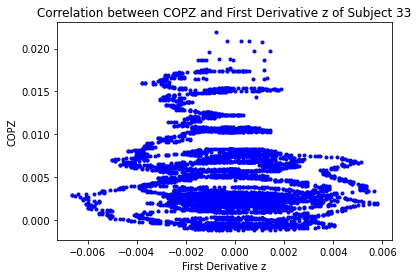

[[ 1.         -0.18370467]
 [-0.18370467  1.        ]]


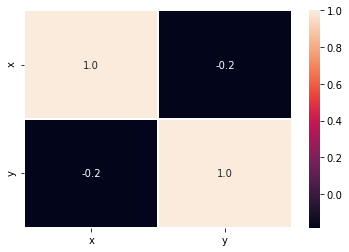

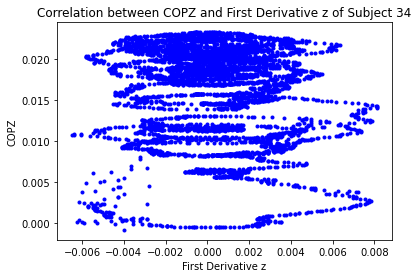

[[ 1.         -0.10026646]
 [-0.10026646  1.        ]]


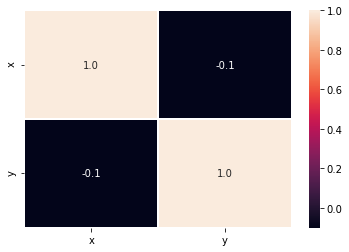

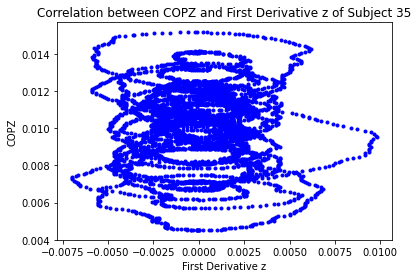

[[ 1.         -0.00115665]
 [-0.00115665  1.        ]]


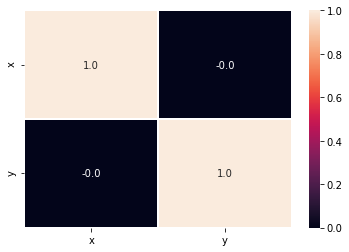

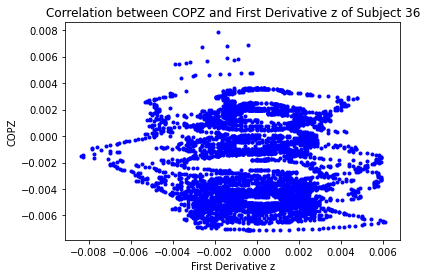

[[ 1.         -0.05983376]
 [-0.05983376  1.        ]]


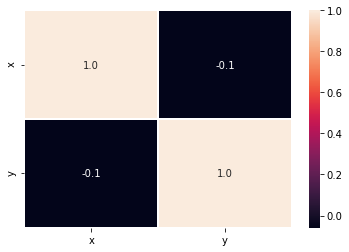

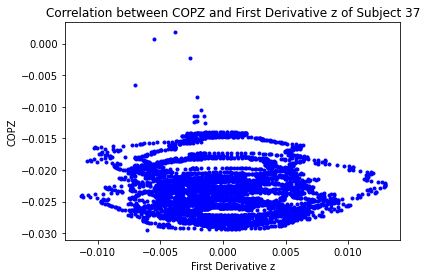

[[ 1.         -0.04971868]
 [-0.04971868  1.        ]]


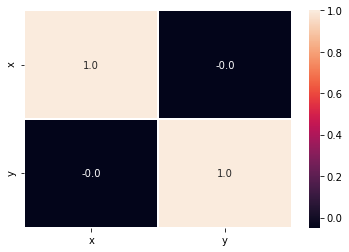

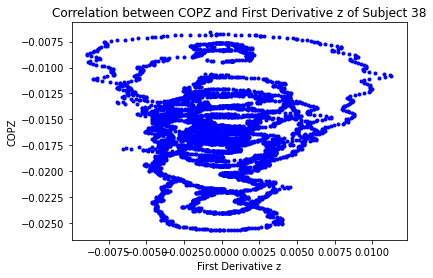

[[ 1.         -0.03783325]
 [-0.03783325  1.        ]]


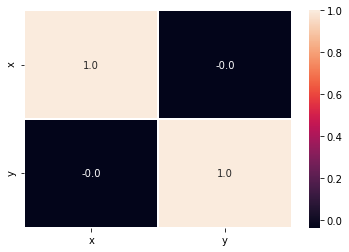

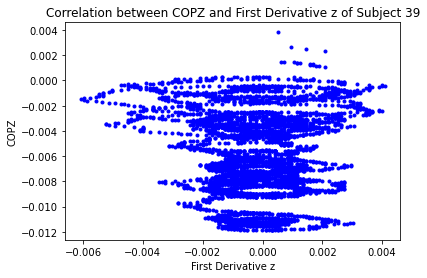

[[ 1.         -0.01644195]
 [-0.01644195  1.        ]]


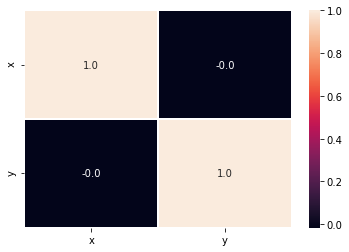

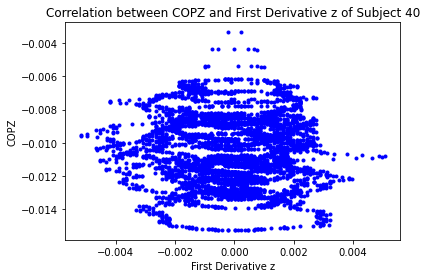

[[ 1.         -0.04594694]
 [-0.04594694  1.        ]]


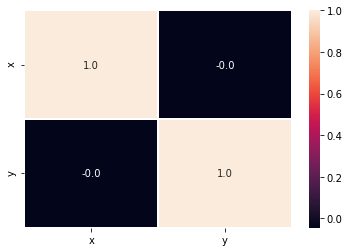

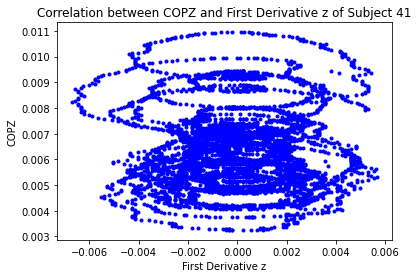

[[1.         0.00290746]
 [0.00290746 1.        ]]


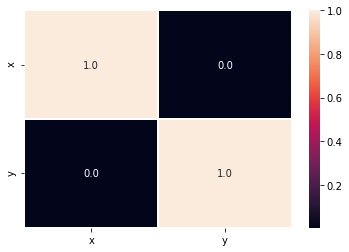

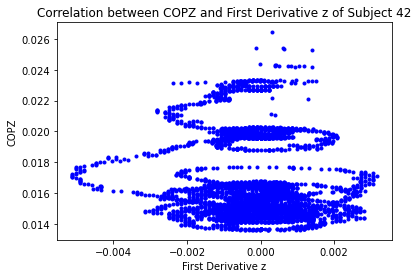

[[ 1.         -0.13501613]
 [-0.13501613  1.        ]]


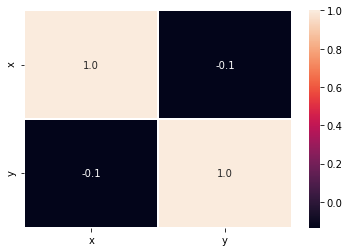

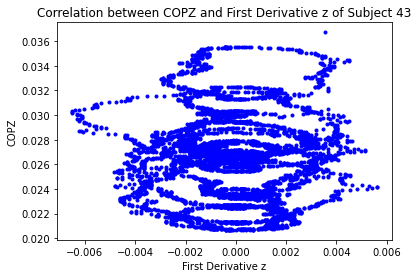

[[ 1.         -0.02186573]
 [-0.02186573  1.        ]]


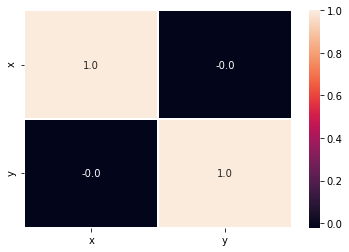

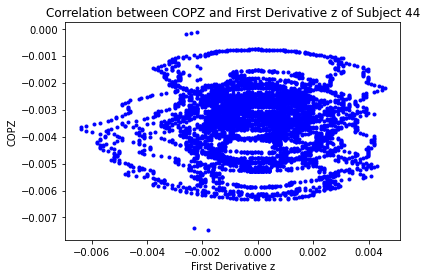

[[1.         0.00550558]
 [0.00550558 1.        ]]


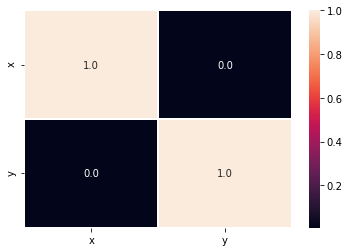

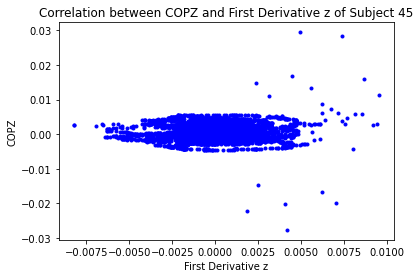

[[1.         0.00964638]
 [0.00964638 1.        ]]


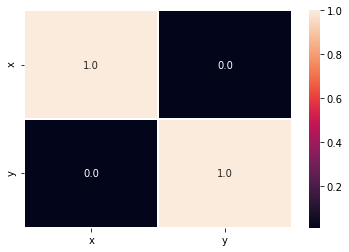

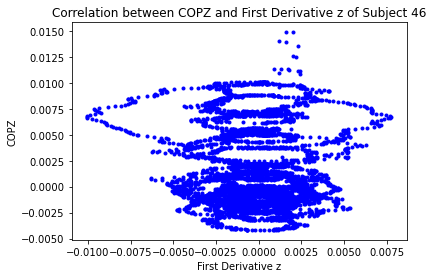

[[ 1.         -0.07077372]
 [-0.07077372  1.        ]]


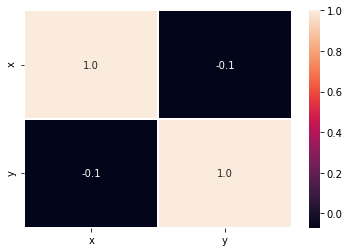

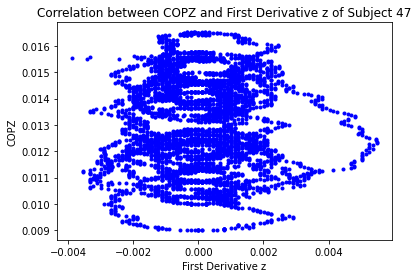

[[ 1.        -0.0039842]
 [-0.0039842  1.       ]]


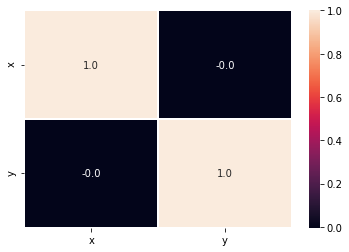

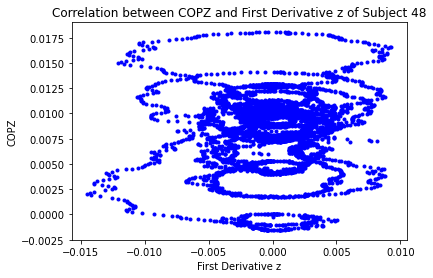

[[1.         0.05642114]
 [0.05642114 1.        ]]


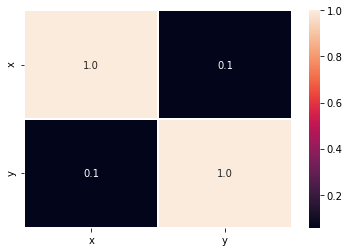

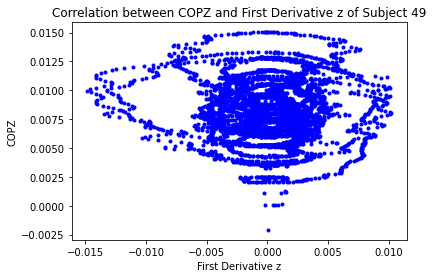

[[ 1.         -0.04461397]
 [-0.04461397  1.        ]]


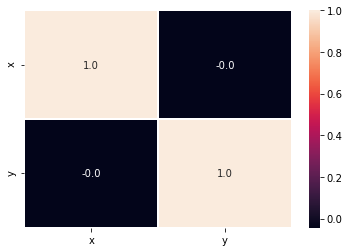

In [39]:
import pandas as pd 
import seaborn as sns
for s in range (1,50):
    a=PDSinfo[PDSinfo['Subject']==s].index.tolist()[2]
    fname_grf = os.path.join(path2, PDSinfo.Trial[a] + 'grf' + '.txt') 
    fname_mkr = os.path.join(path2, PDSinfo.Trial[a] + 'mkr' + '.txt')
    grf = pd.read_csv(fname_grf, delimiter='\t', header=0, engine='c')
    mkr = pd.read_csv(fname_mkr, delimiter='\t', header=0, engine='c')
    COGX=mkr['COG_X']
    COGY=mkr['COG_Y']
    COGZ=mkr['COG_Z']
    d=(COGX**2+COGY**2+COGZ**2)**0.5
    angulox = np.arcsin(COGX/d)
    anguloz= np.arcsin(COGZ/d)
    matrizangx=np.array(angulox[30:])
    matrizangz=np.array(anguloz[30:])
    t=grf['Time']
    dt=t[1]-t[0]
    d1x=np.zeros(len(matrizangx))
    d1z=np.zeros(len(matrizangz))
    for i in range(0, len(matrizangx)-1):
        next=i+1
        d1x[i]=(matrizangx[next]-matrizangx[i])/dt
        d1z[i]=(matrizangz[next]-matrizangz[i])/dt
    d2x=np.zeros(len(d1x))
    d2z=np.zeros(len(d1z))
    for i in range(0, 30):
        next=i+1
        d2x[i]=(d1x[next]-d1x[i])/dt
        d2z[i]=(d1z[next]-d1z[i])/dt
    COPX=COGX[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2x
    COPZ=COGZ[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2z
    COPXreal=grf['COPNET_X']
    COPZreal=grf['COPNET_Z']
    COPXmatrix=np.array(COPX)
    COPXrealmatrix=np.array(COPXreal[30:])
    COPZmatrix=np.array(COPZ)
    COPZrealmatrix=np.array(COPZreal[30:])
    errorx=np.subtract(COPXmatrix,COPXrealmatrix)
    errorz=np.subtract(COPZmatrix,COPZrealmatrix)
    data={'x':d1z,
         'y': COPZmatrix
         }
    df=pd.DataFrame(data)
    plt.plot('x','y','bo',data= df, marker='.')
    plt.xlabel("First Derivative z")
    plt.ylabel("COPZ")
    plt.title("Correlation between COPZ and First Derivative z of Subject {}".format(s))
    plt.show()
    r=np.corrcoef(d1z,COPZmatrix)
    print(r)
    plt.figure()
    data={'x':d1z,
          'y': COPZmatrix
         }
    df=pd.DataFrame(data)
    correlation=df.corr()
    plot=sns.heatmap(correlation,annot= True, fmt='.1f',linewidths=.6)
    plt.show()

# Correlation between COPZ and Second Derivative z

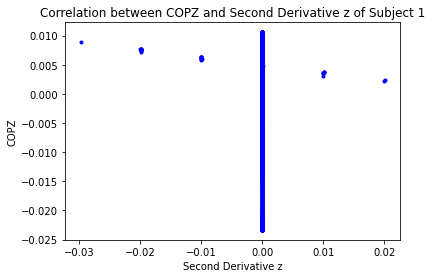

[[ 1.        -0.0383703]
 [-0.0383703  1.       ]]


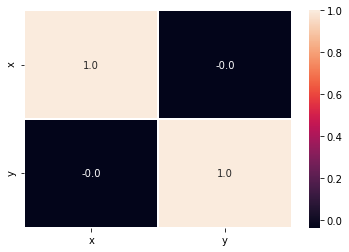

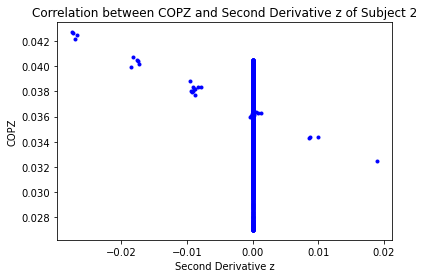

[[ 1.         -0.11437509]
 [-0.11437509  1.        ]]


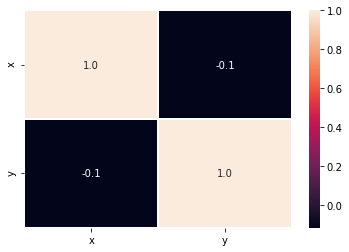

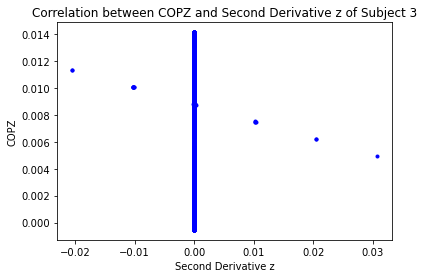

[[ 1.        -0.0239472]
 [-0.0239472  1.       ]]


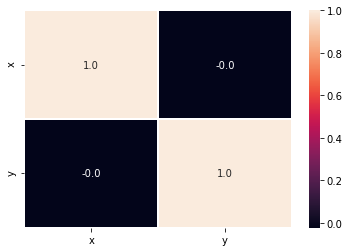

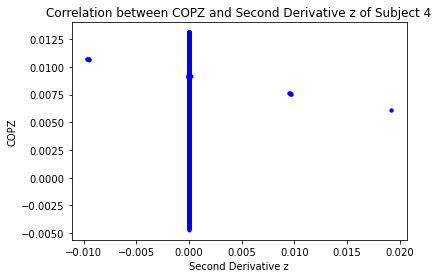

[[ 1.         -0.01809213]
 [-0.01809213  1.        ]]


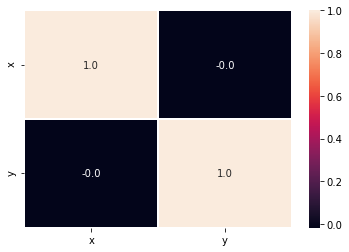

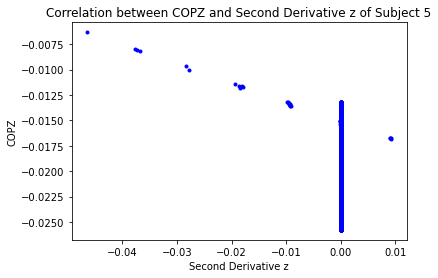

[[ 1.         -0.18141673]
 [-0.18141673  1.        ]]


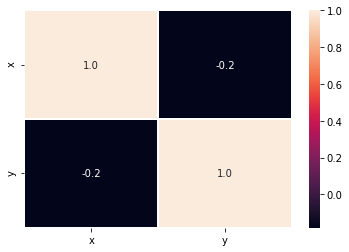

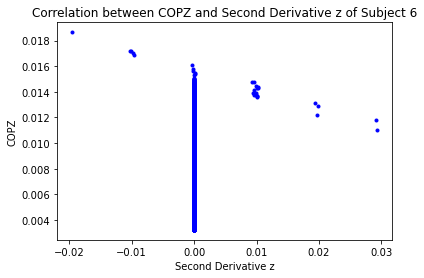

[[1.         0.04002058]
 [0.04002058 1.        ]]


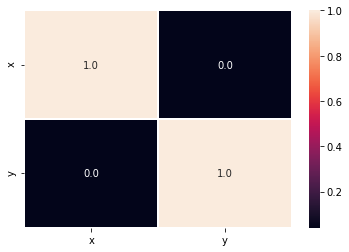

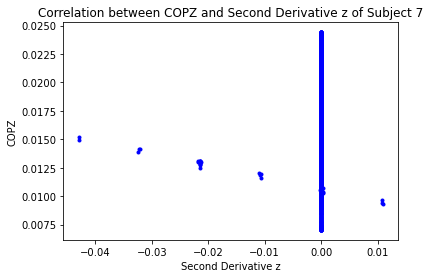

[[1.         0.01890815]
 [0.01890815 1.        ]]


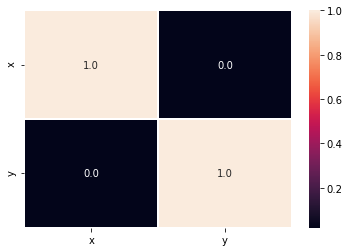

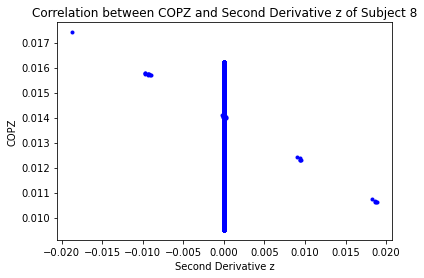

[[ 1.         -0.08260135]
 [-0.08260135  1.        ]]


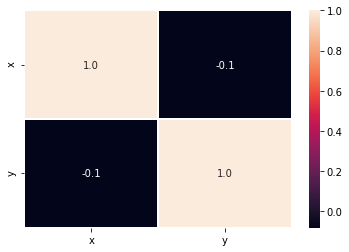

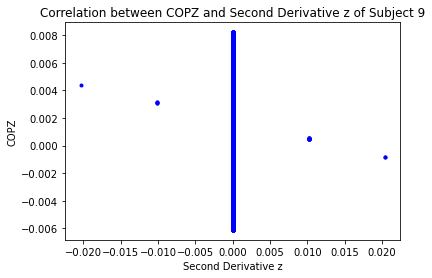

[[ 1.        -0.0238393]
 [-0.0238393  1.       ]]


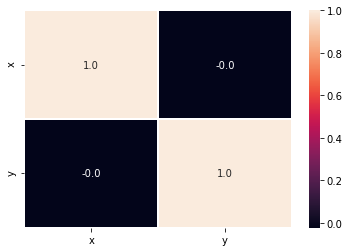

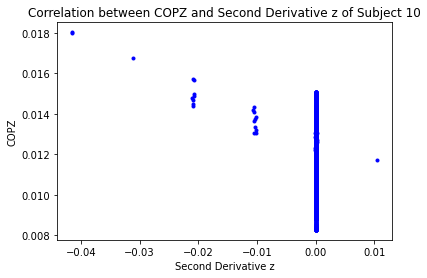

[[ 1.         -0.18899319]
 [-0.18899319  1.        ]]


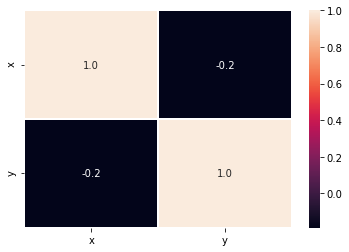

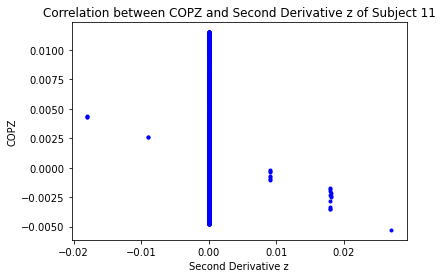

[[ 1.         -0.05873205]
 [-0.05873205  1.        ]]


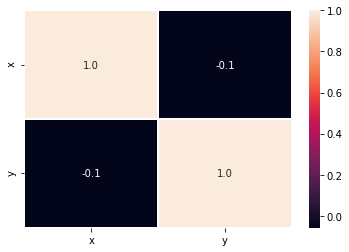

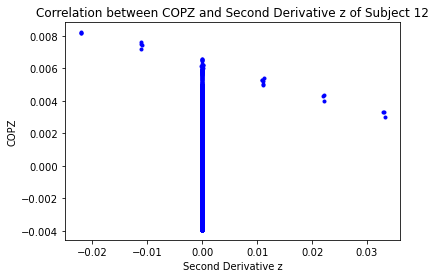

[[1.        0.0071126]
 [0.0071126 1.       ]]


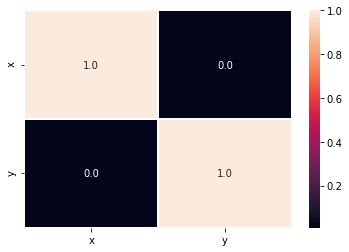

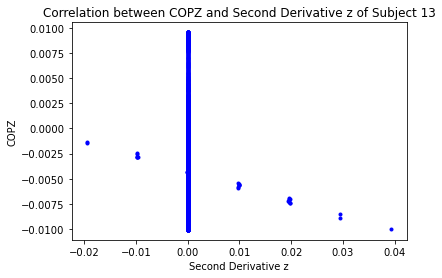

[[ 1.         -0.06386237]
 [-0.06386237  1.        ]]


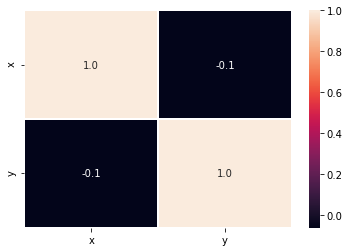

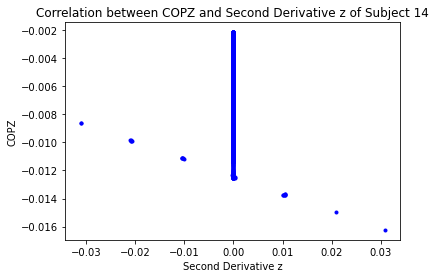

[[ 1.         -0.02485243]
 [-0.02485243  1.        ]]


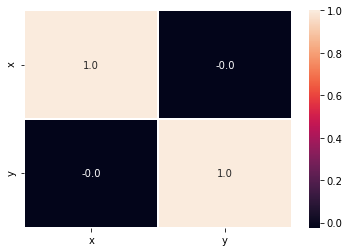

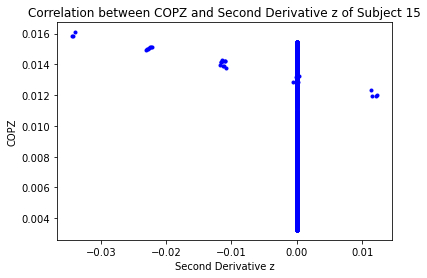

[[ 1.         -0.12027031]
 [-0.12027031  1.        ]]


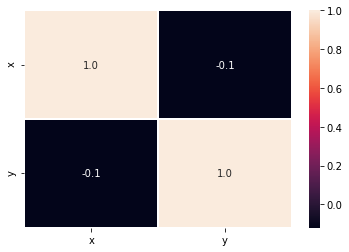

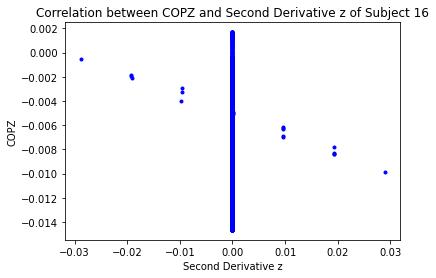

[[ 1.         -0.04808618]
 [-0.04808618  1.        ]]


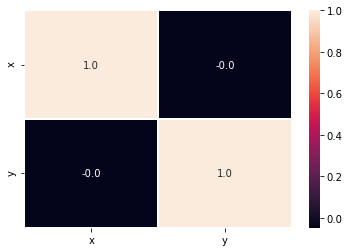

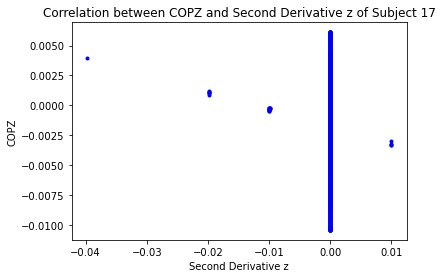

[[ 1.         -0.02907988]
 [-0.02907988  1.        ]]


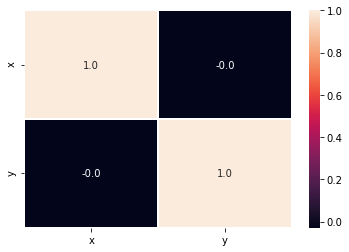

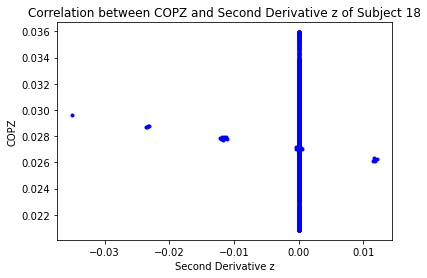

[[ 1.         -0.02536824]
 [-0.02536824  1.        ]]


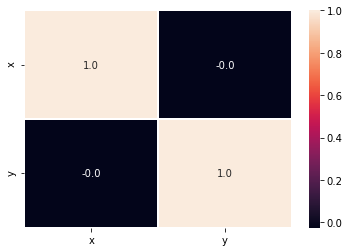

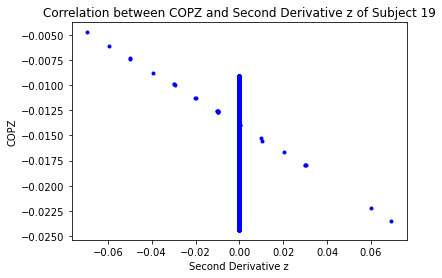

[[ 1.        -0.1199055]
 [-0.1199055  1.       ]]


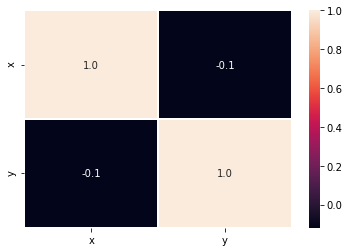

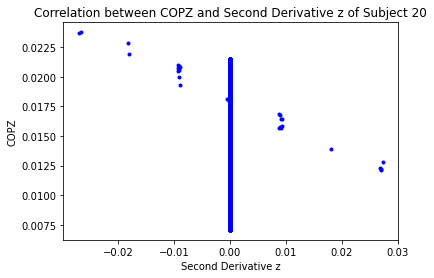

[[ 1.         -0.06296694]
 [-0.06296694  1.        ]]


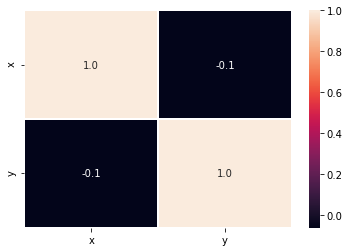

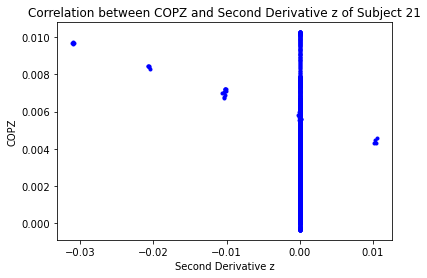

[[ 1.         -0.12392417]
 [-0.12392417  1.        ]]


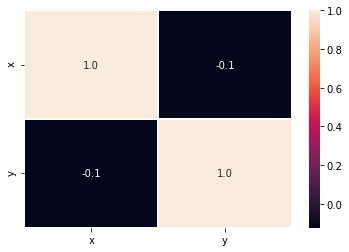

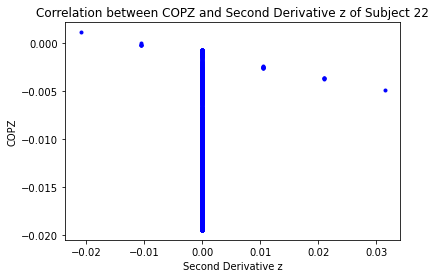

[[1.         0.04241888]
 [0.04241888 1.        ]]


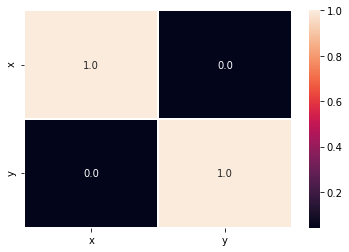

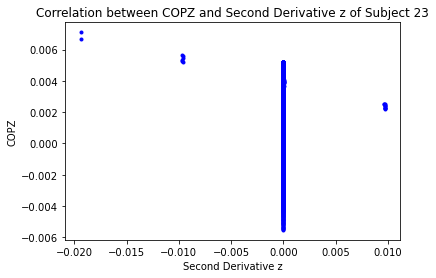

[[ 1.         -0.04308786]
 [-0.04308786  1.        ]]


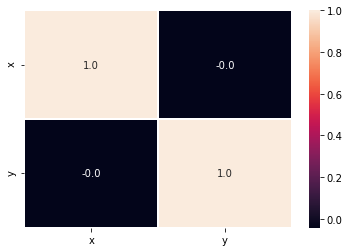

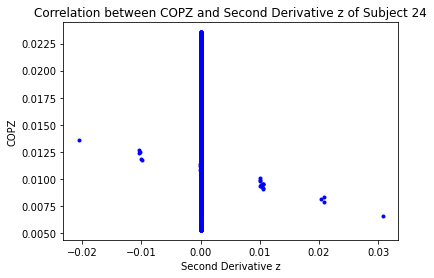

[[ 1.         -0.05481879]
 [-0.05481879  1.        ]]


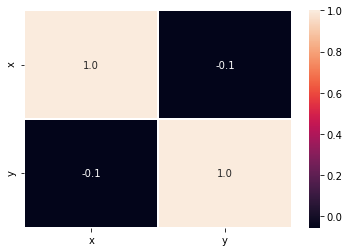

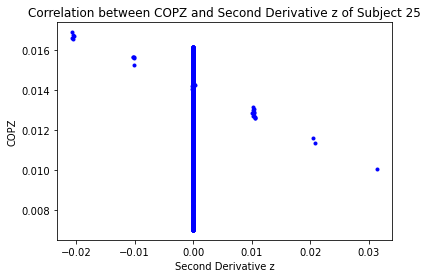

[[ 1.         -0.05526865]
 [-0.05526865  1.        ]]


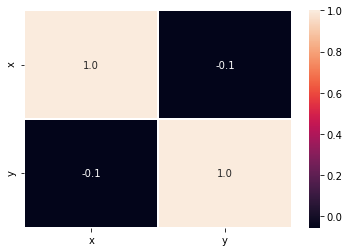

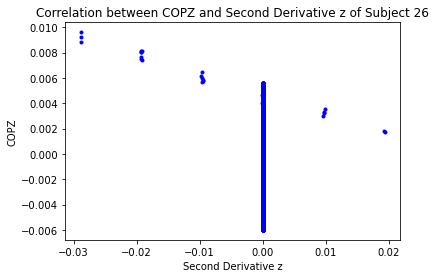

[[ 1.        -0.1399411]
 [-0.1399411  1.       ]]


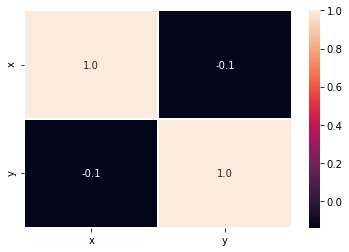

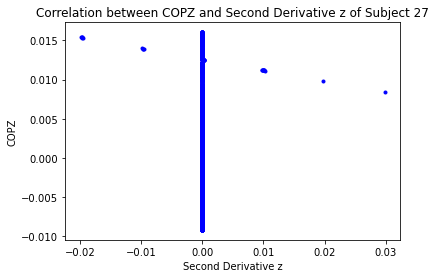

[[ 1.         -0.02547683]
 [-0.02547683  1.        ]]


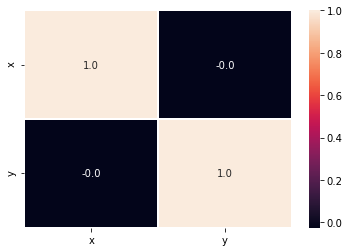

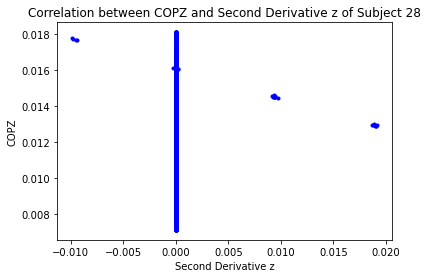

[[1.         0.00404252]
 [0.00404252 1.        ]]


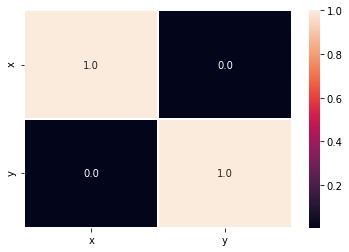

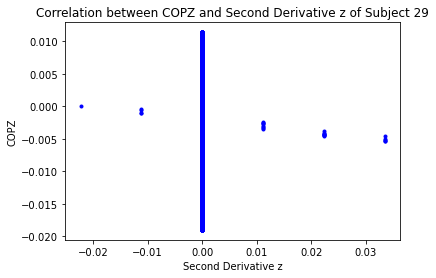

[[ 1.         -0.00305622]
 [-0.00305622  1.        ]]


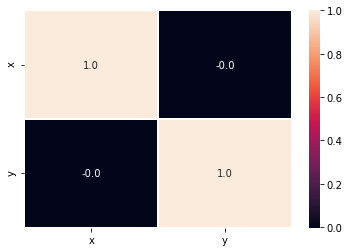

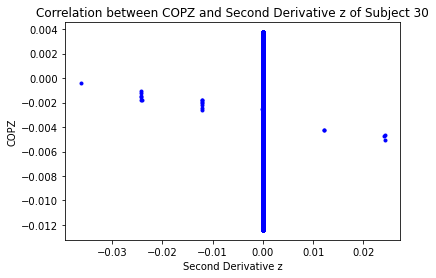

[[ 1.         -0.03019661]
 [-0.03019661  1.        ]]


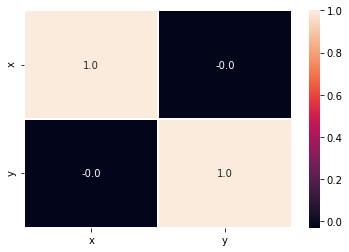

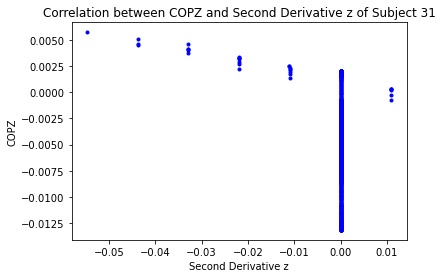

[[ 1.         -0.17416715]
 [-0.17416715  1.        ]]


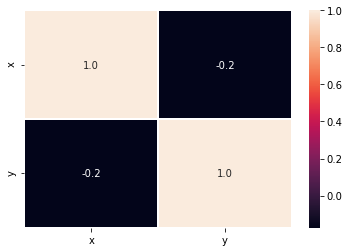

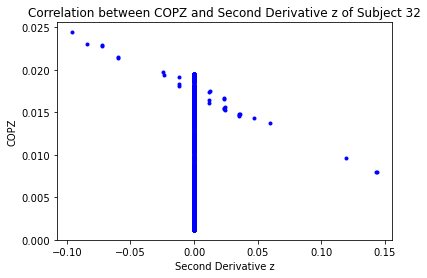

[[ 1.         -0.03377467]
 [-0.03377467  1.        ]]


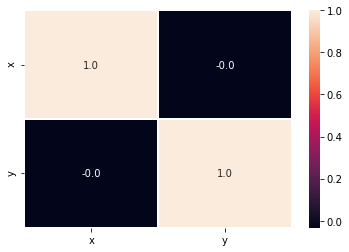

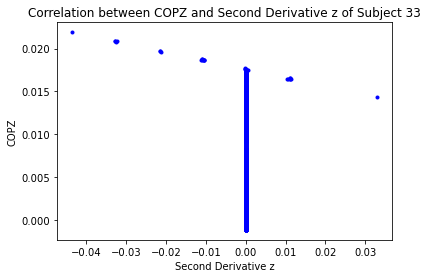

[[ 1.         -0.11104308]
 [-0.11104308  1.        ]]


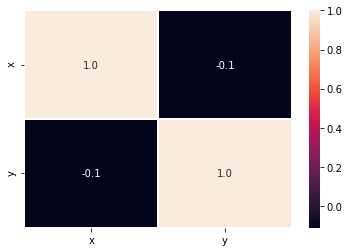

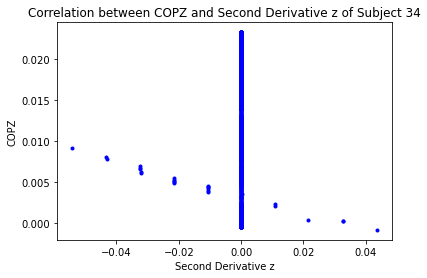

[[1.         0.03663823]
 [0.03663823 1.        ]]


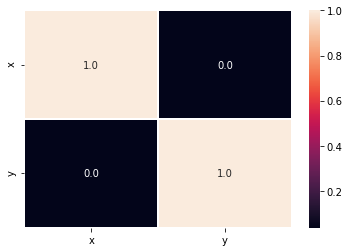

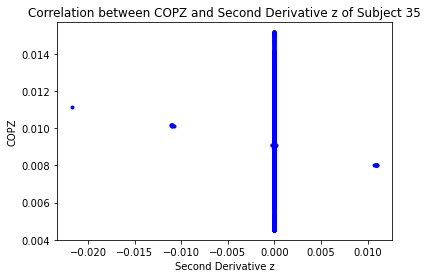

[[ 1.         -0.02629529]
 [-0.02629529  1.        ]]


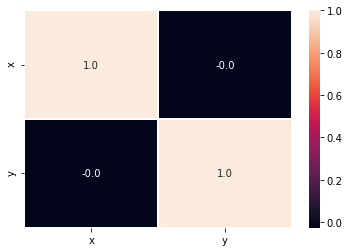

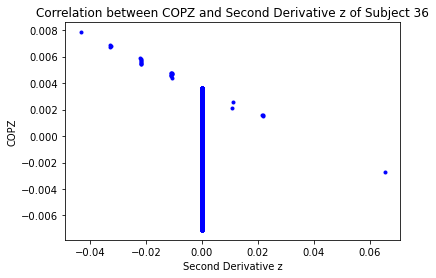

[[ 1.         -0.11011934]
 [-0.11011934  1.        ]]


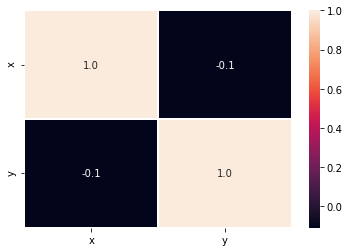

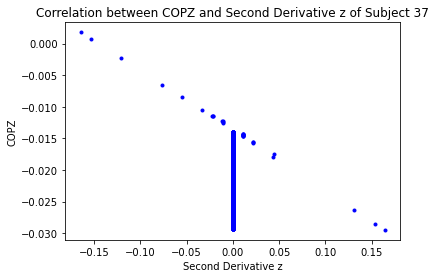

[[ 1.         -0.13108406]
 [-0.13108406  1.        ]]


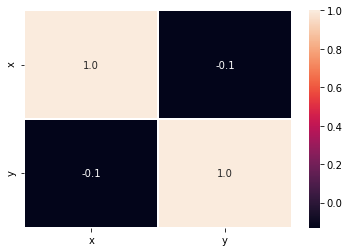

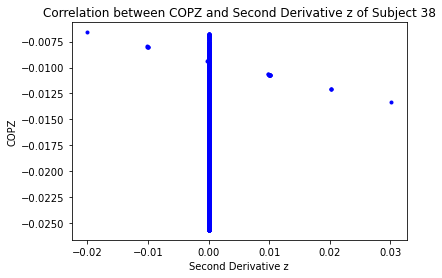

[[1.         0.01905022]
 [0.01905022 1.        ]]


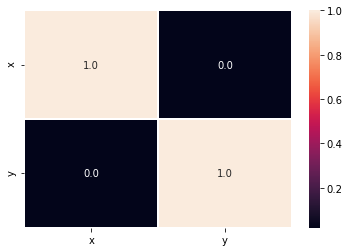

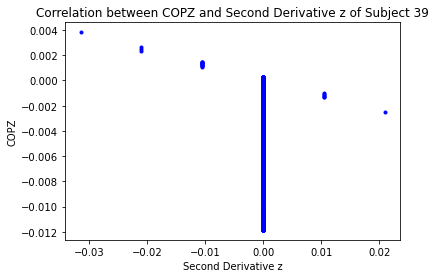

[[ 1.         -0.08234277]
 [-0.08234277  1.        ]]


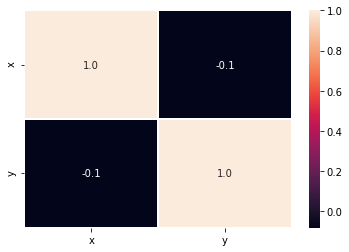

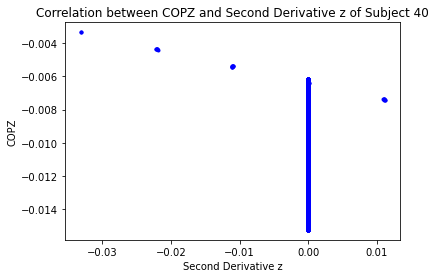

[[ 1.         -0.11755152]
 [-0.11755152  1.        ]]


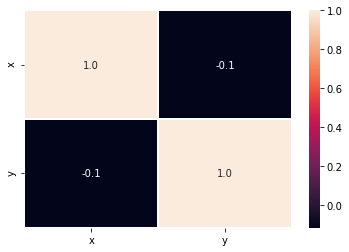

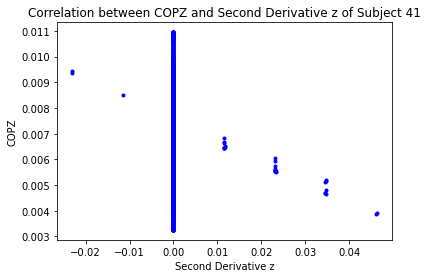

[[ 1.         -0.05642853]
 [-0.05642853  1.        ]]


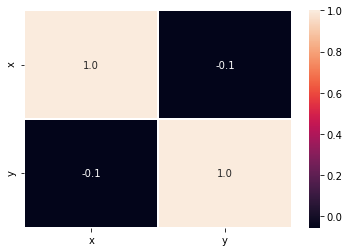

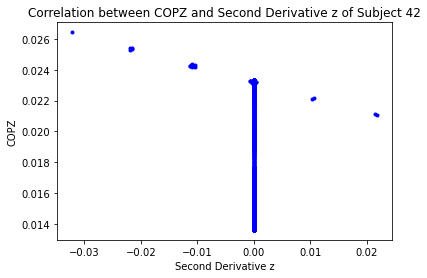

[[ 1.         -0.12173221]
 [-0.12173221  1.        ]]


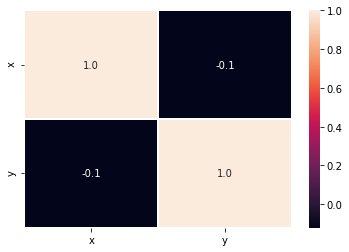

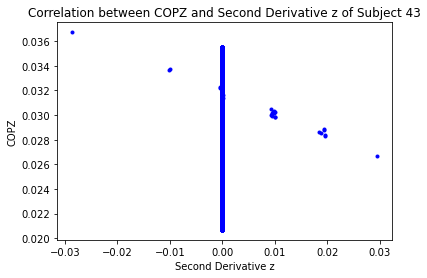

[[1.         0.00986061]
 [0.00986061 1.        ]]


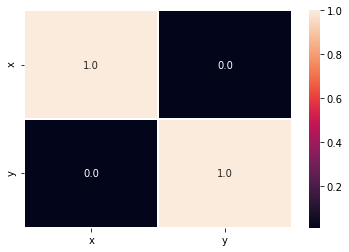

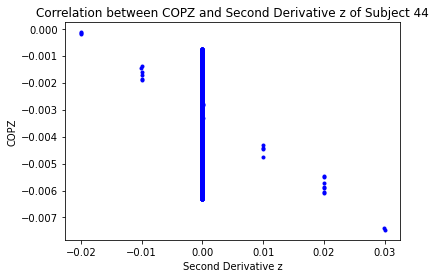

[[ 1.         -0.12565595]
 [-0.12565595  1.        ]]


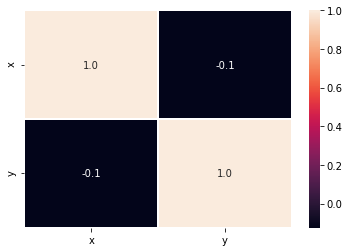

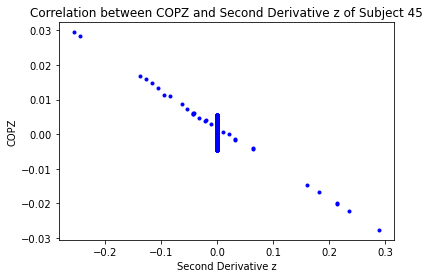

[[ 1.         -0.41543475]
 [-0.41543475  1.        ]]


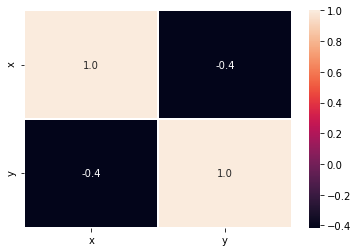

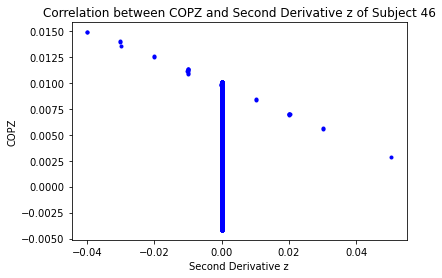

[[ 1.         -0.07422781]
 [-0.07422781  1.        ]]


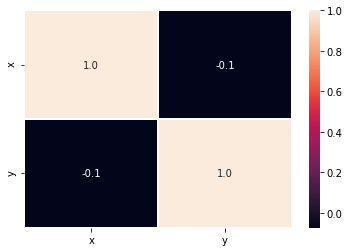

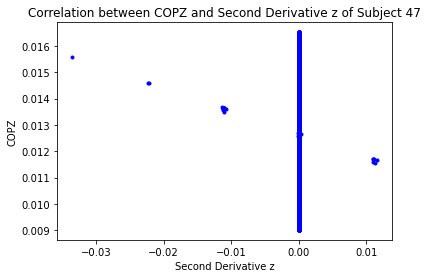

[[ 1.         -0.03652431]
 [-0.03652431  1.        ]]


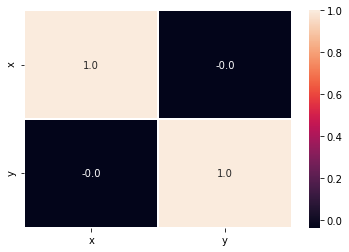

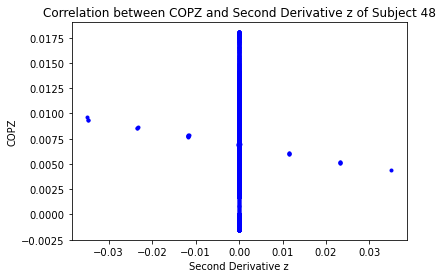

[[ 1.         -0.02355224]
 [-0.02355224  1.        ]]


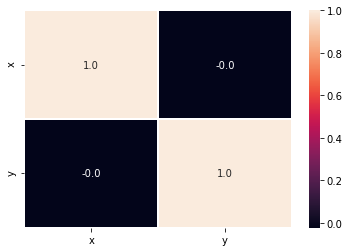

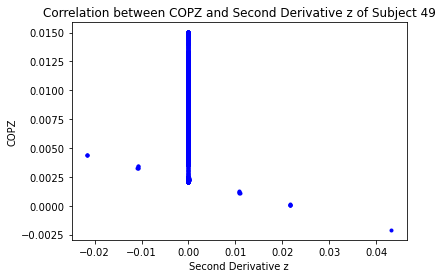

[[ 1.         -0.07788531]
 [-0.07788531  1.        ]]


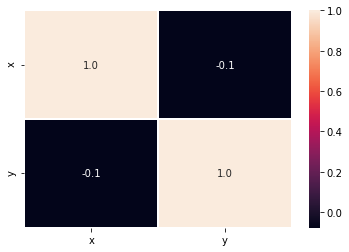

In [40]:
import pandas as pd 
import seaborn as sns
for s in range (1,50):
    a=PDSinfo[PDSinfo['Subject']==s].index.tolist()[2]
    fname_grf = os.path.join(path2, PDSinfo.Trial[a] + 'grf' + '.txt') 
    fname_mkr = os.path.join(path2, PDSinfo.Trial[a] + 'mkr' + '.txt')
    grf = pd.read_csv(fname_grf, delimiter='\t', header=0, engine='c')
    mkr = pd.read_csv(fname_mkr, delimiter='\t', header=0, engine='c')
    COGX=mkr['COG_X']
    COGY=mkr['COG_Y']
    COGZ=mkr['COG_Z']
    d=(COGX**2+COGY**2+COGZ**2)**0.5
    angulox = np.arcsin(COGX/d)
    anguloz= np.arcsin(COGZ/d)
    matrizangx=np.array(angulox[30:])
    matrizangz=np.array(anguloz[30:])
    t=grf['Time']
    dt=t[1]-t[0]
    d1x=np.zeros(len(matrizangx))
    d1z=np.zeros(len(matrizangz))
    for i in range(0, len(matrizangx)-1):
        next=i+1
        d1x[i]=(matrizangx[next]-matrizangx[i])/dt
        d1z[i]=(matrizangz[next]-matrizangz[i])/dt
    d2x=np.zeros(len(d1x))
    d2z=np.zeros(len(d1z))
    for i in range(0, 30):
        next=i+1
        d2x[i]=(d1x[next]-d1x[i])/dt
        d2z[i]=(d1z[next]-d1z[i])/dt
    COPX=COGX[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2x
    COPZ=COGZ[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2z
    COPXreal=grf['COPNET_X']
    COPZreal=grf['COPNET_Z']
    COPXmatrix=np.array(COPX)
    COPXrealmatrix=np.array(COPXreal[30:])
    COPZmatrix=np.array(COPZ)
    COPZrealmatrix=np.array(COPZreal[30:])
    errorx=np.subtract(COPXmatrix,COPXrealmatrix)
    errorz=np.subtract(COPZmatrix,COPZrealmatrix)
    data={'x':d2z,
         'y': COPZmatrix
         }
    df=pd.DataFrame(data)
    plt.plot('x','y','bo',data= df, marker='.')
    plt.xlabel("Second Derivative z")
    plt.ylabel("COPZ")
    plt.title("Correlation between COPZ and Second Derivative z of Subject {}".format(s))
    plt.show()
    r=np.corrcoef(d2z,COPZmatrix)
    print(r)
    plt.figure()
    data={'x':d2z,
          'y': COPZmatrix
         }
    df=pd.DataFrame(data)
    correlation=df.corr()
    plot=sns.heatmap(correlation,annot= True, fmt='.1f',linewidths=.6)
    plt.show()

intercept: [-0.00197646]
slope: [[0.00911918]]
predict response:
[[0.00013947]
 [0.00013957]
 [0.00013967]
 ...
 [0.00023558]
 [0.00023614]
 [0.0002367 ]]
[[0.001038  ]
 [0.0011121 ]
 [0.0013286 ]
 ...
 [0.00614711]
 [0.00607441]
 [0.        ]]


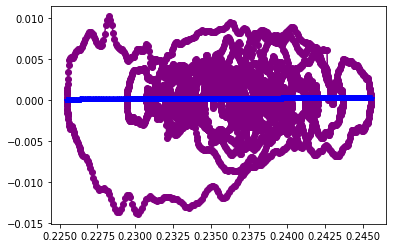

intercept: [0.00741913]
slope: [[-0.03271398]]
predict response:
[[-5.45571496e-04]
 [-5.46622907e-04]
 [-5.47597289e-04]
 ...
 [-9.91009412e-05]
 [-9.83243530e-05]
 [-9.75548578e-05]]
[[ 0.00321395]
 [ 0.00297849]
 [ 0.00276378]
 ...
 [-0.00237387]
 [-0.00235219]
 [ 0.        ]]


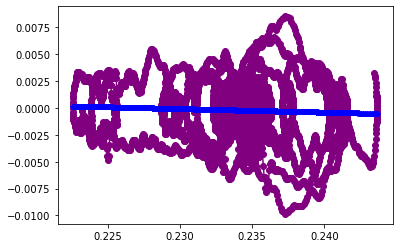

intercept: [0.00937511]
slope: [[-0.04062249]]
predict response:
[[-7.95675005e-04]
 [-7.96380064e-04]
 [-7.97135563e-04]
 ...
 [-6.66498605e-05]
 [-6.57474012e-05]
 [-6.49259645e-05]]
[[ 0.00173564]
 [ 0.00185981]
 [ 0.00183446]
 ...
 [-0.00222158]
 [-0.00202212]
 [ 0.        ]]


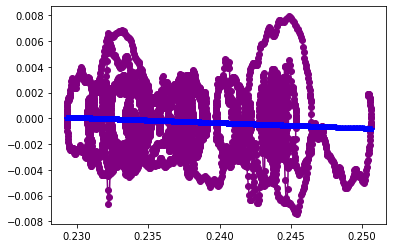

intercept: [-0.00689239]
slope: [[0.03297234]]
predict response:
[[-0.00024132]
 [-0.0002411 ]
 [-0.00024091]
 ...
 [-0.00053405]
 [-0.00053444]
 [-0.0005348 ]]
[[ 0.00065762]
 [ 0.00058297]
 [ 0.00069608]
 ...
 [-0.00117272]
 [-0.00107854]
 [ 0.        ]]


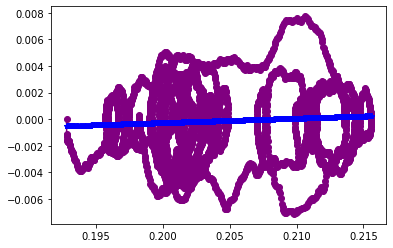

intercept: [0.00349509]
slope: [[-0.01802283]]
predict response:
[[-0.00037139]
 [-0.0003711 ]
 [-0.00037081]
 ...
 [-0.00013217]
 [-0.0001318 ]
 [-0.00013143]]
[[-0.00165953]
 [-0.00155802]
 [-0.00170787]
 ...
 [-0.00206416]
 [-0.00206446]
 [ 0.        ]]


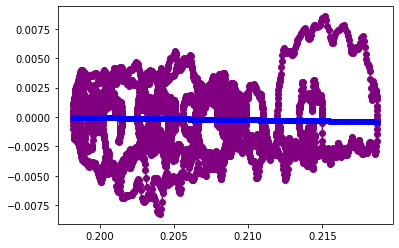

intercept: [-0.00854092]
slope: [[0.0359008]]
predict response:
[[-0.00016002]
 [-0.00015941]
 [-0.0001588 ]
 ...
 [-0.00087146]
 [-0.00087204]
 [-0.00087259]]
[[ 0.00170009]
 [ 0.00167703]
 [ 0.00149075]
 ...
 [-0.00162072]
 [-0.0015454 ]
 [ 0.        ]]


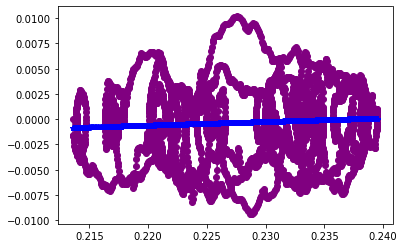

intercept: [-0.00161821]
slope: [[0.00535973]]
predict response:
[[-0.00034414]
 [-0.00034397]
 [-0.00034381]
 ...
 [-0.00047127]
 [-0.00047127]
 [-0.00047126]]
[[3.11303129e-03]
 [3.05888615e-03]
 [2.76967318e-03]
 ...
 [3.19396429e-05]
 [2.20527452e-04]
 [0.00000000e+00]]


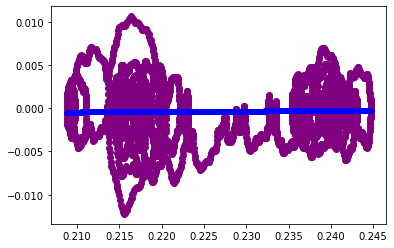

intercept: [0.00016642]
slope: [[-0.00100406]]
predict response:
[[-3.83032745e-05]
 [-3.82828998e-05]
 [-3.82621464e-05]
 ...
 [-3.60627496e-05]
 [-3.60614366e-05]
 [-3.60592061e-05]]
[[-0.00202922]
 [-0.00206695]
 [-0.00206693]
 ...
 [-0.00013077]
 [-0.00022215]
 [ 0.        ]]


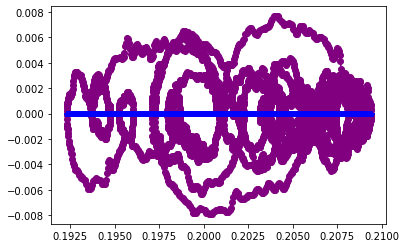

intercept: [0.00429188]
slope: [[-0.01776081]]
predict response:
[[0.00019424]
 [0.00019369]
 [0.00019312]
 ...
 [0.00010318]
 [0.00010325]
 [0.00010334]]
[[ 0.00309973]
 [ 0.00322224]
 [ 0.00332143]
 ...
 [-0.00039639]
 [-0.00049544]
 [ 0.        ]]


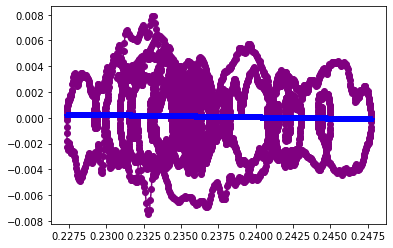

intercept: [0.00134901]
slope: [[-0.00533748]]
predict response:
[[-4.12990902e-05]
 [-4.10792746e-05]
 [-4.08594951e-05]
 ...
 [-2.97748163e-05]
 [-2.98701037e-05]
 [-2.99667958e-05]]
[[-0.00411834]
 [-0.00411767]
 [-0.00419079]
 ...
 [ 0.00178525]
 [ 0.00181157]
 [ 0.        ]]


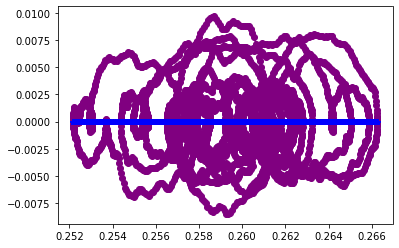

intercept: [-0.02123937]
slope: [[0.09737418]]
predict response:
[[-8.77704315e-06]
 [-9.20242904e-07]
 [ 6.88868514e-06]
 ...
 [-1.63856115e-03]
 [-1.63513616e-03]
 [-1.63162513e-03]]
[[0.00806867]
 [0.00801951]
 [0.00735497]
 ...
 [0.00351735]
 [0.00360572]
 [0.        ]]


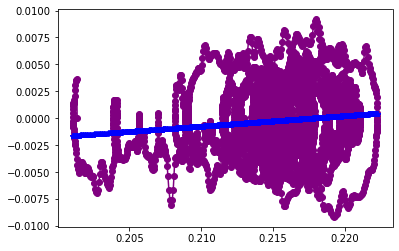

intercept: [-0.00184229]
slope: [[0.00659126]]
predict response:
[[-0.00017643]
 [-0.00017643]
 [-0.00017644]
 ...
 [-0.00025108]
 [-0.00025133]
 [-0.00025158]]
[[-7.40724592e-05]
 [-7.38859290e-05]
 [-1.80767050e-04]
 ...
 [-3.86633634e-03]
 [-3.84002029e-03]
 [ 0.00000000e+00]]


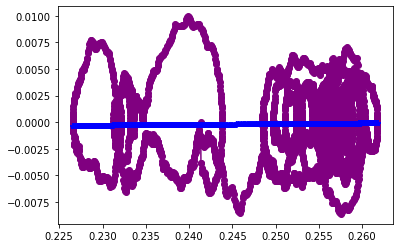

intercept: [0.00044079]
slope: [[-0.00197665]]
predict response:
[[-1.22858106e-05]
 [-1.22824284e-05]
 [-1.22790440e-05]
 ...
 [-1.10652029e-05]
 [-1.10396526e-05]
 [-1.10117887e-05]]
[[-1.71108871e-04]
 [-1.71218258e-04]
 [-3.12903588e-05]
 ...
 [-1.29260823e-03]
 [-1.40965353e-03]
 [ 0.00000000e+00]]


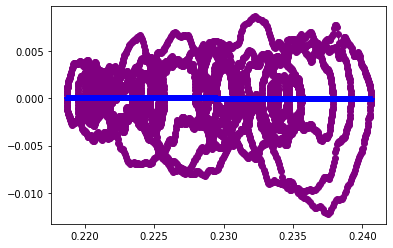

intercept: [0.00334847]
slope: [[-0.01587699]]
predict response:
[[-0.00033557]
 [-0.00033506]
 [-0.00033451]
 ...
 [-0.00013497]
 [-0.00013485]
 [-0.00013471]]
[[-0.00322784]
 [-0.00347632]
 [-0.00365399]
 ...
 [-0.00078605]
 [-0.00088687]
 [ 0.        ]]


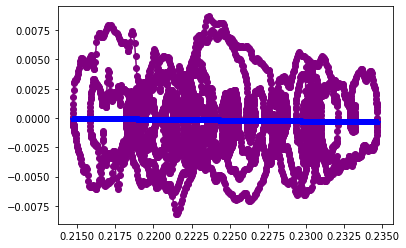

intercept: [-0.00254315]
slope: [[0.01085959]]
predict response:
[[-9.46735163e-05]
 [-9.38433710e-05]
 [-9.30094951e-05]
 ...
 [-1.47974879e-04]
 [-1.47926262e-04]
 [-1.47877646e-04]]
[[0.00764435]
 [0.0076787 ]
 [0.00770388]
 ...
 [0.00044768]
 [0.00044768]
 [0.        ]]


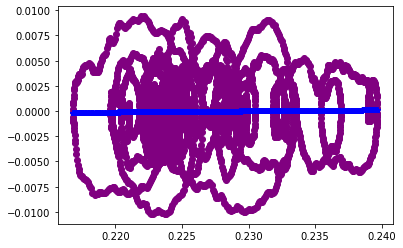

intercept: [0.00750648]
slope: [[-0.03250036]]
predict response:
[[-0.00056981]
 [-0.00056986]
 [-0.00056992]
 ...
 [-0.00022552]
 [-0.00022489]
 [-0.00022426]]
[[ 0.00015909]
 [ 0.00018276]
 [ 0.00020632]
 ...
 [-0.00193993]
 [-0.00194033]
 [ 0.        ]]


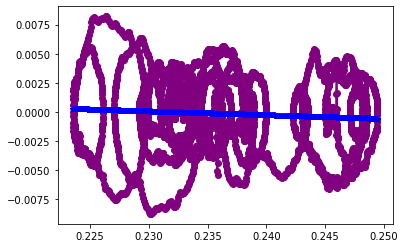

intercept: [-0.00027439]
slope: [[-0.00018569]]
predict response:
[[-0.0003132 ]
 [-0.00031321]
 [-0.00031322]
 ...
 [-0.00030973]
 [-0.00030974]
 [-0.00030975]]
[[0.00562997]
 [0.00562982]
 [0.00560902]
 ...
 [0.0043516 ]
 [0.00443071]
 [0.        ]]


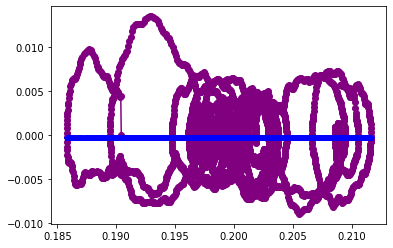

intercept: [0.00156451]
slope: [[-0.0066124]]
predict response:
[[-1.11028109e-04]
 [-1.11021153e-04]
 [-1.11004751e-04]
 ...
 [-7.47565754e-05]
 [-7.47819713e-05]
 [-7.48150077e-05]]
[[-0.0001052 ]
 [-0.00024804]
 [-0.00036132]
 ...
 [ 0.00038406]
 [ 0.00049961]
 [ 0.        ]]


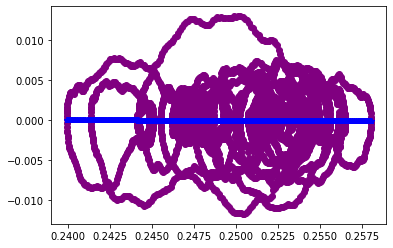

intercept: [-0.00368863]
slope: [[0.0129337]]
predict response:
[[-0.00029141]
 [-0.00029171]
 [-0.00029205]
 ...
 [-0.00058753]
 [-0.00058703]
 [-0.00058652]]
[[-0.00236465]
 [-0.00261091]
 [-0.00283032]
 ...
 [ 0.00388508]
 [ 0.00393064]
 [ 0.        ]]


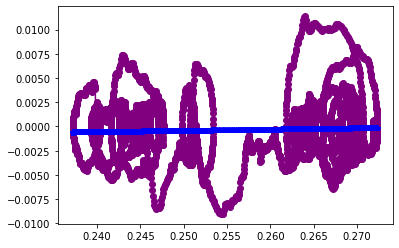

intercept: [-0.00044684]
slope: [[0.00140027]]
predict response:
[[-0.00010576]
 [-0.00010574]
 [-0.0001057 ]
 ...
 [-0.00011488]
 [-0.00011489]
 [-0.00011491]]
[[ 0.00205742]
 [ 0.00216679]
 [ 0.00223201]
 ...
 [-0.00139982]
 [-0.00142065]
 [ 0.        ]]


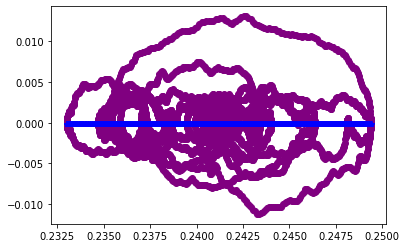

intercept: [0.00593545]
slope: [[-0.02901125]]
predict response:
[[-0.00032411]
 [-0.00032454]
 [-0.00032495]
 ...
 [-0.00019435]
 [-0.00019425]
 [-0.00019416]]
[[ 0.00145444]
 [ 0.00143263]
 [ 0.00131019]
 ...
 [-0.00034532]
 [-0.00030207]
 [ 0.        ]]


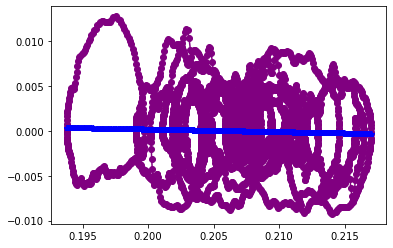

intercept: [0.00807535]
slope: [[-0.03501115]]
predict response:
[[-6.39167720e-04]
 [-6.38945020e-04]
 [-6.38642058e-04]
 ...
 [-3.18326418e-05]
 [-3.33713491e-05]
 [-3.49102577e-05]]
[[-0.00063608]
 [-0.00086533]
 [-0.00096703]
 ...
 [ 0.00439491]
 [ 0.00439548]
 [ 0.        ]]


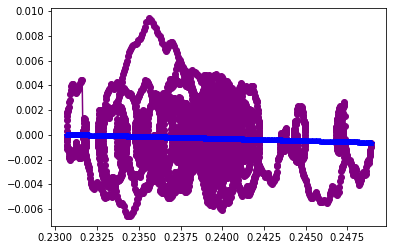

intercept: [0.00443153]
slope: [[-0.02004911]]
predict response:
[[-1.29436227e-04]
 [-1.29411846e-04]
 [-1.29420909e-04]
 ...
 [-5.35267622e-05]
 [-5.34121494e-05]
 [-5.32785732e-05]]
[[-1.21609616e-04]
 [ 4.52047829e-05]
 [ 1.61454112e-04]
 ...
 [-5.71659874e-04]
 [-6.66245198e-04]
 [ 0.00000000e+00]]


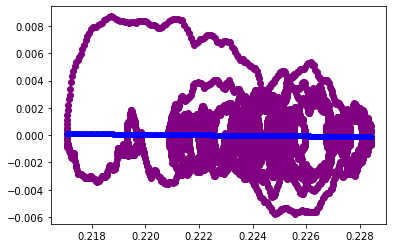

intercept: [-0.00054228]
slope: [[0.00189751]]
predict response:
[[-0.00010796]
 [-0.00010783]
 [-0.0001077 ]
 ...
 [-0.00012029]
 [-0.00012041]
 [-0.00012054]]
[[ 0.00709624]
 [ 0.00704975]
 [ 0.00682645]
 ...
 [-0.00646295]
 [-0.00651782]
 [ 0.        ]]


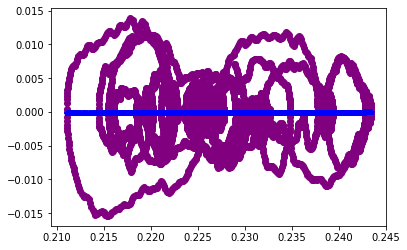

intercept: [-0.00382268]
slope: [[0.014286]]
predict response:
[[-0.00010624]
 [-0.00010665]
 [-0.00010708]
 ...
 [-0.00024066]
 [-0.00024064]
 [-0.00024062]]
[[-0.00282419]
 [-0.00304946]
 [-0.00337312]
 ...
 [ 0.00014839]
 [ 0.00014839]
 [ 0.        ]]


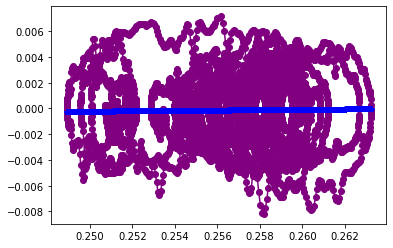

intercept: [0.00069507]
slope: [[-0.00334527]]
predict response:
[[-1.05546536e-04]
 [-1.05794010e-04]
 [-1.06032082e-04]
 ...
 [-8.64204635e-05]
 [-8.64088466e-05]
 [-8.63925912e-05]]
[[ 0.00739773]
 [ 0.00711666]
 [ 0.00699767]
 ...
 [-0.00034726]
 [-0.00048592]
 [ 0.        ]]


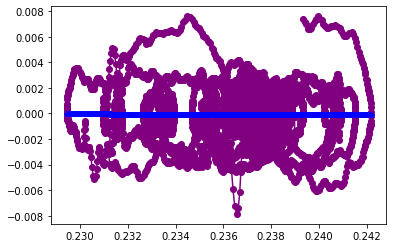

intercept: [0.040823]
slope: [[-0.16412529]]
predict response:
[[-0.00325689]
 [-0.00324819]
 [-0.00323933]
 ...
 [ 0.00011298]
 [ 0.00011135]
 [ 0.00010977]]
[[-0.00530111]
 [-0.00539669]
 [-0.00537014]
 ...
 [ 0.00098927]
 [ 0.00096479]
 [ 0.        ]]


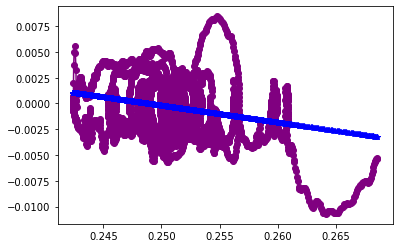

intercept: [0.00739337]
slope: [[-0.03593611]]
predict response:
[[-2.87157134e-04]
 [-2.84527890e-04]
 [-2.81957880e-04]
 ...
 [-7.61761774e-05]
 [-7.58479777e-05]
 [-7.54863010e-05]]
[[-0.00731644]
 [-0.00715161]
 [-0.00698642]
 ...
 [-0.00091329]
 [-0.00100644]
 [ 0.        ]]


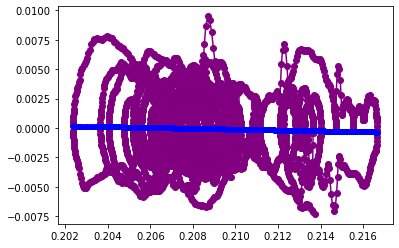

intercept: [0.00401421]
slope: [[-0.0180638]]
predict response:
[[-2.33053524e-04]
 [-2.33445902e-04]
 [-2.33818669e-04]
 ...
 [-9.40038130e-05]
 [-9.51692126e-05]
 [-9.63739826e-05]]
[[0.00217218]
 [0.00206361]
 [0.00195513]
 ...
 [0.00645158]
 [0.00666953]
 [0.        ]]


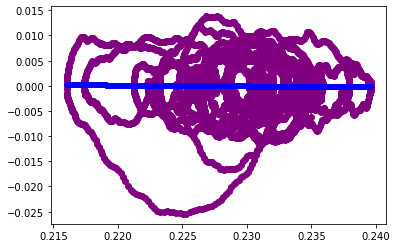

intercept: [0.00709867]
slope: [[-0.02667159]]
predict response:
[[-0.00038198]
 [-0.00038167]
 [-0.00038133]
 ...
 [-0.00015256]
 [-0.00015212]
 [-0.00015164]]
[[-0.00114046]
 [-0.00129018]
 [-0.00129012]
 ...
 [-0.0016675 ]
 [-0.00178405]
 [ 0.        ]]


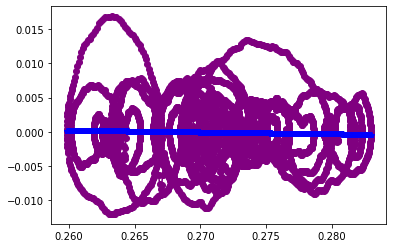

intercept: [0.00088412]
slope: [[-0.00386852]]
predict response:
[[-1.82919629e-05]
 [-1.84009887e-05]
 [-1.85337413e-05]
 ...
 [-1.31479642e-05]
 [-1.32801990e-05]
 [-1.34051310e-05]]
[[0.00281829]
 [0.00343161]
 [0.00401957]
 ...
 [0.00341823]
 [0.00322946]
 [0.        ]]


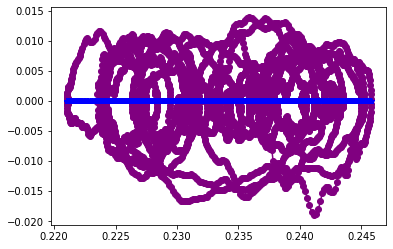

intercept: [0.00372796]
slope: [[-0.01469027]]
predict response:
[[-1.72513622e-04]
 [-1.71233857e-04]
 [-1.69937036e-04]
 ...
 [-8.70685974e-05]
 [-8.73056911e-05]
 [-8.75766526e-05]]
[[-0.00871165]
 [-0.00882775]
 [-0.00879823]
 ...
 [ 0.00161395]
 [ 0.0018445 ]
 [ 0.        ]]


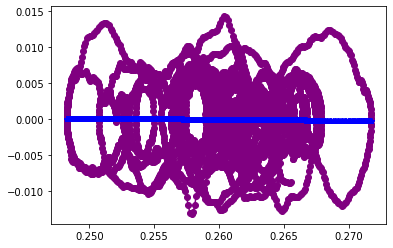

intercept: [-0.01021386]
slope: [[0.04031464]]
predict response:
[[-5.37542043e-05]
 [-5.33124870e-05]
 [-5.28382506e-05]
 ...
 [-4.80843120e-04]
 [-4.81014708e-04]
 [-4.81175862e-04]]
[[ 0.00109567]
 [ 0.00117634]
 [ 0.00109664]
 ...
 [-0.00042562]
 [-0.00039974]
 [ 0.        ]]


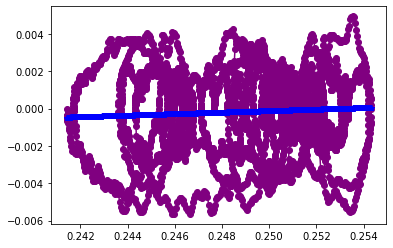

intercept: [0.00265207]
slope: [[-0.01072035]]
predict response:
[[1.13654498e-04]
 [1.13505403e-04]
 [1.13195842e-04]
 ...
 [6.98708008e-05]
 [6.93224525e-05]
 [6.87964016e-05]]
[[0.00139077]
 [0.0028876 ]
 [0.00427958]
 ...
 [0.00511502]
 [0.00490703]
 [0.        ]]


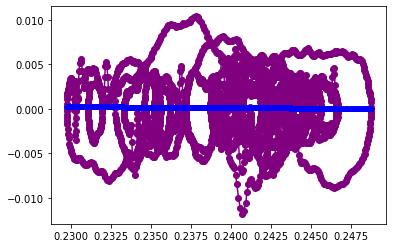

intercept: [0.00331018]
slope: [[-0.01146244]]
predict response:
[[1.11374905e-05]
 [1.12225789e-05]
 [1.13112097e-05]
 ...
 [6.32179594e-06]
 [6.25672277e-06]
 [6.19160054e-06]]
[[-0.00074232]
 [-0.00077323]
 [-0.00077324]
 ...
 [ 0.00056771]
 [ 0.00056814]
 [ 0.        ]]


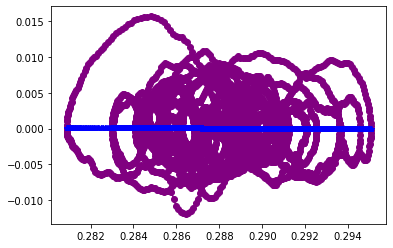

intercept: [0.00082468]
slope: [[-0.0031721]]
predict response:
[[-5.67586620e-06]
 [-5.98149445e-06]
 [-6.31347877e-06]
 ...
 [-4.00917297e-06]
 [-4.01604633e-06]
 [-4.01622624e-06]]
[[9.63488591e-03]
 [1.04657569e-02]
 [1.08278193e-02]
 ...
 [2.16681526e-04]
 [5.67178365e-06]
 [0.00000000e+00]]


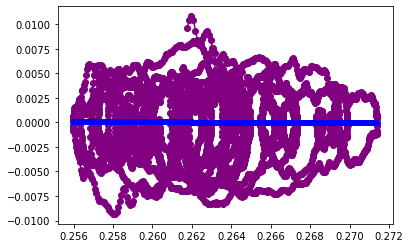

intercept: [0.00496145]
slope: [[-0.02006206]]
predict response:
[[-1.43369469e-04]
 [-1.44327228e-04]
 [-1.45258479e-04]
 ...
 [-9.28265053e-05]
 [-9.18204542e-05]
 [-9.08515639e-05]]
[[ 0.00477398]
 [ 0.00464185]
 [ 0.00416249]
 ...
 [-0.00501469]
 [-0.00482947]
 [ 0.        ]]


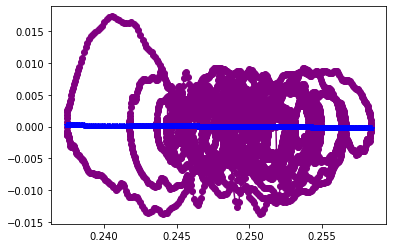

intercept: [-0.00065628]
slope: [[0.00304794]]
predict response:
[[0.00014343]
 [0.00014343]
 [0.00014343]
 ...
 [0.00017178]
 [0.00017179]
 [0.00017179]]
[[-2.80370928e-05]
 [ 6.83779403e-05]
 [ 1.65294480e-04]
 ...
 [ 2.51221468e-04]
 [ 2.98529003e-05]
 [ 0.00000000e+00]]


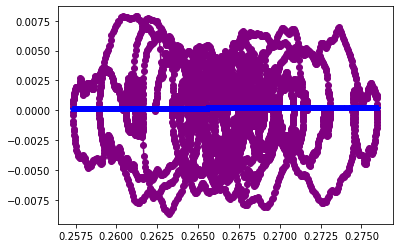

intercept: [-0.01149379]
slope: [[0.05052087]]
predict response:
[[0.00021425]
 [0.00021481]
 [0.00021547]
 ...
 [0.0008216 ]
 [0.00082145]
 [0.00082124]]
[[ 0.00109886]
 [ 0.00130301]
 [ 0.00137528]
 ...
 [-0.00030492]
 [-0.00040666]
 [ 0.        ]]


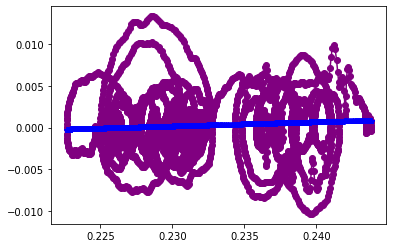

intercept: [-0.00021724]
slope: [[0.00085833]]
predict response:
[[-2.14564273e-05]
 [-2.14543478e-05]
 [-2.14522699e-05]
 ...
 [-2.23968473e-05]
 [-2.23863382e-05]
 [-2.23756185e-05]]
[[0.00024227]
 [0.00024209]
 [0.0001341 ]
 ...
 [0.00122436]
 [0.0012489 ]
 [0.        ]]


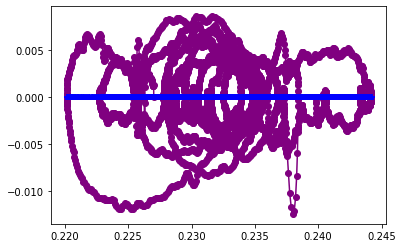

intercept: [0.01560603]
slope: [[-0.0541229]]
predict response:
[[0.00105655]
 [0.00105352]
 [0.00105049]
 ...
 [0.0002854 ]
 [0.00028504]
 [0.00028461]]
[[0.0055977 ]
 [0.005597  ]
 [0.00584931]
 ...
 [0.00066275]
 [0.0007872 ]
 [0.        ]]


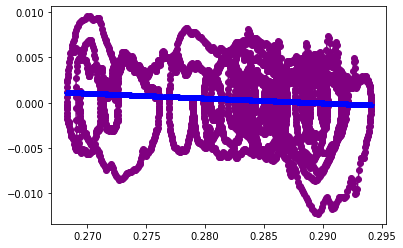

intercept: [0.00973917]
slope: [[-0.03890117]]
predict response:
[[-4.57215943e-04]
 [-4.57678976e-04]
 [-4.58182996e-04]
 ...
 [-5.58995943e-05]
 [-5.65508686e-05]
 [-5.72430197e-05]]
[[0.00119028]
 [0.00129564]
 [0.00123875]
 ...
 [0.00167418]
 [0.00177926]
 [0.        ]]


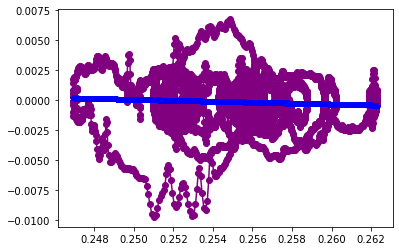

intercept: [0.0016518]
slope: [[-0.00838604]]
predict response:
[[-1.09875110e-04]
 [-1.09959533e-04]
 [-1.10047163e-04]
 ...
 [-6.98275842e-05]
 [-6.96391273e-05]
 [-6.94507062e-05]]
[[ 0.00100672]
 [ 0.00104495]
 [ 0.00095087]
 ...
 [-0.00224727]
 [-0.00224684]
 [ 0.        ]]


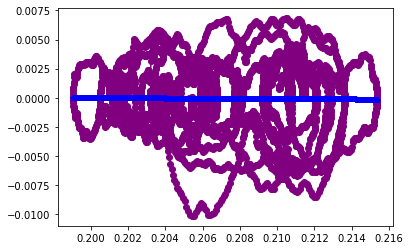

intercept: [0.00651438]
slope: [[-0.02903867]]
predict response:
[[3.95221393e-04]
 [3.95680201e-04]
 [3.96145058e-04]
 ...
 [5.80568050e-05]
 [5.96689859e-05]
 [6.13031372e-05]]
[[-0.00157999]
 [-0.00160082]
 [-0.00152404]
 ...
 [-0.00555184]
 [-0.0056275 ]
 [ 0.        ]]


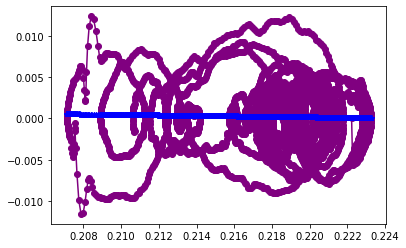

intercept: [0.00248288]
slope: [[-0.00985034]]
predict response:
[[-0.00018344]
 [-0.00018311]
 [-0.00018299]
 ...
 [-0.00010997]
 [-0.00011021]
 [-0.00011044]]
[[-0.00336624]
 [-0.00116753]
 [-0.00054496]
 ...
 [ 0.00238199]
 [ 0.00238195]
 [ 0.        ]]


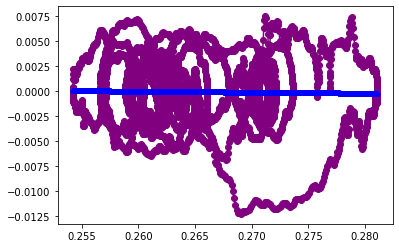

intercept: [0.00500229]
slope: [[-0.02427504]]
predict response:
[[-0.00045291]
 [-0.00045311]
 [-0.00045337]
 ...
 [-0.00011903]
 [-0.00011862]
 [-0.00011822]]
[[ 0.0008474 ]
 [ 0.00106519]
 [ 0.00116271]
 ...
 [-0.00166151]
 [-0.00168274]
 [ 0.        ]]


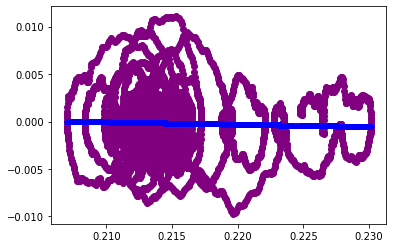

intercept: [0.00460651]
slope: [[-0.01961139]]
predict response:
[[-2.93031030e-04]
 [-2.93407039e-04]
 [-2.93782965e-04]
 ...
 [-8.68388620e-05]
 [-8.75835103e-05]
 [-8.83546764e-05]]
[[0.0019173 ]
 [0.00191687]
 [0.00194442]
 ...
 [0.00379702]
 [0.00393224]
 [0.        ]]


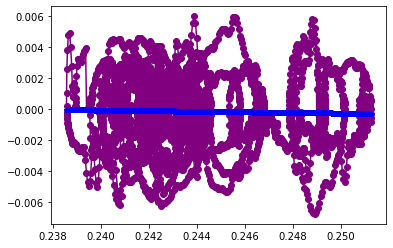

intercept: [-0.0069936]
slope: [[0.0265996]]
predict response:
[[-0.0002022 ]
 [-0.00020159]
 [-0.00020091]
 ...
 [-0.00073936]
 [-0.00073641]
 [-0.00073337]]
[[0.00225885]
 [0.00256748]
 [0.0026514 ]
 ...
 [0.01109569]
 [0.01143658]
 [0.        ]]


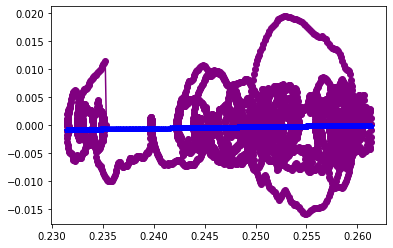

intercept: [0.04142945]
slope: [[-0.15090716]]
predict response:
[[-0.00194434]
 [-0.00193276]
 [-0.00192091]
 ...
 [-0.00034949]
 [-0.00033827]
 [-0.00032737]]
[[-0.00767541]
 [-0.00785264]
 [-0.00779196]
 ...
 [-0.00743128]
 [-0.00722292]
 [ 0.        ]]


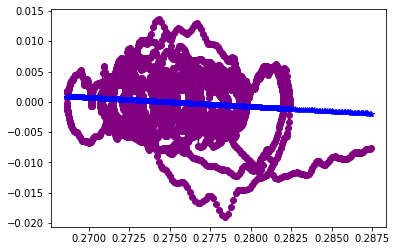

In [64]:
import pandas as pd 
import seaborn as sns
import numpy as np
from sklearn.linear_model import LinearRegression
for s in range (1,50):
    a=PDSinfo[PDSinfo['Subject']==s].index.tolist()[2]
    fname_grf = os.path.join(path2, PDSinfo.Trial[a] + 'grf' + '.txt') 
    fname_mkr = os.path.join(path2, PDSinfo.Trial[a] + 'mkr' + '.txt')
    grf = pd.read_csv(fname_grf, delimiter='\t', header=0, engine='c')
    mkr = pd.read_csv(fname_mkr, delimiter='\t', header=0, engine='c')
    COGX=mkr['COG_X']
    COGY=mkr['COG_Y']
    COGZ=mkr['COG_Z']
    d=(COGX**2+COGY**2+COGZ**2)**0.5
    angulox = np.arcsin(COGX/d)
    anguloz= np.arcsin(COGZ/d)
    matrizangx=np.array(angulox[30:])
    matrizangz=np.array(anguloz[30:])
    t=grf['Time']
    dt=t[1]-t[0]
    d1x=np.zeros(len(matrizangx))
    d1z=np.zeros(len(matrizangz))
    for i in range(0, len(matrizangx)-1):
        next=i+1
        d1x[i]=(matrizangx[next]-matrizangx[i])/dt
        d1z[i]=(matrizangz[next]-matrizangz[i])/dt
    d2x=np.zeros(len(d1x))
    d2z=np.zeros(len(d1z))
    for i in range(0, 30):
        next=i+1
        d2x[i]=(d1x[next]-d1x[i])/dt
        d2z[i]=(d1z[next]-d1z[i])/dt
    COPX=COGX[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2x
    COPZ=COGZ[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2z
    COPXreal=grf['COPNET_X']
    COPZreal=grf['COPNET_Z']
    COPXmatrix=np.array(COPX)
    COPXrealmatrix=np.array(COPXreal[30:])
    COPZmatrix=np.array(COPZ)
    COPZrealmatrix=np.array(COPZreal[30:])
    errorx=np.subtract(COPXmatrix,COPXrealmatrix)
    errorz=np.subtract(COPZmatrix,COPZrealmatrix)
    data={'x':d2z,
         'y': COPZmatrix
         }
    df=pd.DataFrame(data)
    model=LinearRegression()
    model.fit(matrizangx.reshape(-1,1),d1x.reshape(-1,1))
    model= LinearRegression().fit(matrizangx.reshape(-1,1),d1x.reshape(-1,1))
    r_sq=model.score(matrizangx.reshape(-1,1),d1x.reshape(-1,1))
    print("intercept:",model.intercept_)
    print("slope:",model.coef_)
    y_pred=model.predict(matrizangx.reshape(-1,1))
    print('predict response:',y_pred,sep='\n')
    print(d1x.reshape(-1,1))
    plt.plot(matrizangx,d1x,marker='o',color='purple')
    plt.plot(matrizangx,y_pred,marker='*',color='blue')
    plt.show()

In [65]:
import pandas as pd 
import seaborn as sns
import numpy as np
from sklearn.linear_model import LinearRegression
for s in range (1,50):
    a=PDSinfo[PDSinfo['Subject']==s].index.tolist()[2]
    fname_grf = os.path.join(path2, PDSinfo.Trial[a] + 'grf' + '.txt') 
    fname_mkr = os.path.join(path2, PDSinfo.Trial[a] + 'mkr' + '.txt')
    grf = pd.read_csv(fname_grf, delimiter='\t', header=0, engine='c')
    mkr = pd.read_csv(fname_mkr, delimiter='\t', header=0, engine='c')
    COGX=mkr['COG_X']
    COGY=mkr['COG_Y']
    COGZ=mkr['COG_Z']
    d=(COGX**2+COGY**2+COGZ**2)**0.5
    angulox = np.arcsin(COGX/d)
    anguloz= np.arcsin(COGZ/d)
    matrizangx=np.array(angulox[30:])
    matrizangz=np.array(anguloz[30:])
    t=grf['Time']
    dt=t[1]-t[0]
    d1x=np.zeros(len(matrizangx))
    d1z=np.zeros(len(matrizangz))
    for i in range(0, len(matrizangx)-1):
        next=i+1
        d1x[i]=(matrizangx[next]-matrizangx[i])/dt
        d1z[i]=(matrizangz[next]-matrizangz[i])/dt
    d2x=np.zeros(len(d1x))
    d2z=np.zeros(len(d1z))
    for i in range(0, 30):
        next=i+1
        d2x[i]=(d1x[next]-d1x[i])/dt
        d2z[i]=(d1z[next]-d1z[i])/dt
    COPX=COGX[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2x
    COPZ=COGZ[30:]-(4/3)*(d[30:]**4)*(1/9.8)*d2z
    COPXreal=grf['COPNET_X']
    COPZreal=grf['COPNET_Z']
    COPXmatrix=np.array(COPX)
    COPXrealmatrix=np.array(COPXreal[30:])
    COPZmatrix=np.array(COPZ)
    COPZrealmatrix=np.array(COPZreal[30:])
    errorx=np.subtract(COPXmatrix,COPXrealmatrix)
    errorz=np.subtract(COPZmatrix,COPZrealmatrix)
    data={'x':d2z,
         'y': COPZmatrix
         }
    df=pd.DataFrame(data)
    model=LinearRegression()
    model.fit(COPX.reshape(-1,1),t.reshape(-1,1))
    model= LinearRegression().fit(COPX.reshape(-1,1),t.reshape(-1,1))
    r_sq=model.score(COPX.reshape(-1,1),t.reshape(-1,1))
    print("intercept:",model.intercept_)
    print("slope:",model.coef_)
    y_pred=model.predict(COPX.reshape(-1,1))
    print('predict response:',y_pred,sep='\n')
    print(d1x.reshape(-1,1))
    plt.plot(COPX,t,marker='o',color='purple')
    plt.plot(COPX,y_pred,marker='*',color='blue')
    plt.show()

AttributeError: 'Series' object has no attribute 'reshape'